# Projet 7   Implémentez un modèle de scoring

## Partie 1 : Exploratory Data Analysis

La société financière, nommée "Prêt à dépenser",  propose des crédits à la consommation pour des personnes ayant peu ou pas du tout d'historique de prêt.


1. L’entreprise souhaite mettre en œuvre un outil de “scoring crédit” pour calculer la probabilité qu’un client rembourse son crédit, puis classifie la demande en crédit accordé ou refusé. Elle souhaite donc développer un algorithme de classification en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières, etc.).


2. De plus, les chargés de relation client ont fait remonter le fait que les clients sont de plus en plus **demandeurs de transparence vis-à-vis des décisions d’octroi de crédit**. Cette demande de transparence des clients va tout à fait dans le sens des valeurs que l’entreprise veut incarner."Prêt à dépenser" décide donc de développer un dashboard interactif pour que les chargés de relation client puissent à la fois expliquer de façon la plus transparente possible les décisions d’octroi de crédit, mais également permettre à leurs clients de disposer de leurs informations personnelles et de les explorer facilement.

**Mission**:  

 - Construire un modèle de scoring qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique.
 - Construire un dashboard interactif à destination des gestionnaires de la relation client permettant d'interpréter les prédictions faites par le modèle, et d’améliorer la connaissance client des chargés de relation client.
  - Mettre en production le modèle de scoring de prédiction à l’aide d’une API, ainsi que le dashboard interactif qui appelle l’API pour les prédictions.


**Spécifications du dashboard**:

 le dashboard interactif doit contenir au minimum les fonctionnalités suivantes :

  - Permettre de visualiser le score et l’interprétation de ce score pour chaque client de façon intelligible pour une personne non experte en data science.
  - Permettre de visualiser des informations descriptives relatives à un client (via un système de filtre).
  - Permettre de comparer les informations descriptives relatives à un client à l’ensemble des clients ou à un groupe de clients similaires.

**Livrables**:

  - L’application de dashboard interactif répondant aux spécifications ci-dessus et l’API de prédiction du score, déployées chacunes sur le cloud.
  - Un dossier, géré via un outil de versioning de code contenant :
  
  - Le notebook ou code de la modélisation (du prétraitement à la prédiction), intégrant via MLFlow le tracking 
  d’expérimentations et le stockage centralisé des modèles
  
  - Le code générant le dashboard
  
  - Le code permettant de déployer le modèle sous forme d'API
  
  - Pour les applications dashboard et API, un fichier introductif permettant de comprendre l'objectif du projet et le découpage des dossiers, et un fichier listant les packages utilisés seront présents dans les dossiers
  
  - Le tableau HTML d’analyse de data drift réalisé à partir d’evidently
    
  - Une note méthodologique décrivant :  
  
             - La méthodologie d'entraînement du modèle (2 pages maximum)
             - Le traitement du déséquilibre des classes (1 page maximum)
             - La fonction coût métier, l'algorithme d'optimisation et la métrique d'évaluation (1 page maximum)
             - Un tableau de synthèse des résultats (1 page maximum)
             -  L’interprétabilité globale et locale du modèle (1 page maximum)
             - Les limites et les améliorations possibles (1 page maximum)
             - L’analyse du Data Drift (1 page maximum)
  - Un support de présentation pour la soutenance, détaillant le travail réalisé (Powerpoint ou équivalent, 30slides maximum).
  - Des copies écran des commits, du dossier Github (+ lien vers ce dossier) et de l’exécution des tests unitaires, qui sont les preuves qu’un pipeline de déploiement continu a permis de déployer l’API, doivent être formalisés dans ce support de présentation.

##  Imports

In [1]:
# builtin
import os,warnings,sys

# data
import pandas as pd
import numpy as np
from numpy.random import seed
from datetime import datetime

# visualisation
import matplotlib as mtpl
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = 8, 4
%matplotlib inline

import seaborn as sns
sns.set_style("ticks")
sns.color_palette("tab10", as_cmap=False)

# scipy
from scipy.stats import kstest
import scipy.stats as stats
from scipy.stats import norm

# statsmodels
import statsmodels.api as sm

# sklearn
from sklearn.impute import SimpleImputer,KNNImputer



In [2]:
### afficher le nombre de variables par type  et le pourcentage de chaque type

def type_var(df):
    print("Variables")
    print('---------')
    nb=df.dtypes.value_counts()
    nb_tot=nb.sum()
    pourcentage=round((100*nb/nb_tot),2)
    table=pd.concat([nb,pourcentage],axis=1)
    table.columns=[ 'Nombre' , '% ']
    display(table[table['Nombre']!=0]
    .sort_values('% ',ascending= False))

In [3]:
## affiche le nombre de lignes , de colonnes , la taille totale , le nomnbre et le % de cellules manquantes

def cont(df):
    # nombre de lignes et colonnes
    nb_raw,nb_col=df.shape
    # nombre de valeurs manquantes
    val_na=df.isna().sum().sum()
    # % de données manquantes
    ratio_na=round(df.isna().sum().sum()/(nb_raw*nb_col)*100,2)
    print('taille totale du jeu de donnees :' ,nb_raw*nb_col)
    print() 
    print('nombre de lignes :',nb_raw,'                            nombre de colonnes :', nb_col)
    print()      
    print('nombre de valeurs manquantes :',val_na,'          % de valeurs manquantes :', ratio_na)
  

In [4]:
#afficher les valeurs manquantes
def missing_values(df):
    ''' affiche le pourcentage de valeurs manquantes par colonne trié en ordre descendant'''
            
    total = df.isnull().sum()
    percent = np.round(df.isnull().sum()/df.isnull().count()*100,2)
    missing_data = pd.concat([total, percent], 
                             axis=1, keys=['Total', '%']).sort_values('%', ascending=False)
    return missing_data

In [5]:
### print heatmap avec les valeurs manquantes
def viz_na(df):
    plt.figure(figsize=(25,8))
    ax = sns.heatmap(df.isna(),cmap="Blues",cbar=False)
    plt.title('Visualisation des valeurs manquantes ',font='Arial',fontsize=24)
    plt.show()

In [6]:
def correlation_matrice(df,corr_method):
    '''
pearson : standard correlation coefficient
kendall : Kendall Tau correlation coefficient
spearman :  Spearman rank correlation
''' 
    
    corr = df.corr(method=corr_method)
    
    mask=np.triu(np.ones_like(corr,dtype=bool))
    sns.heatmap(corr,mask=mask,center=0,cmap='RdBu',linewidths=1,annot=True,fmt='.2f',vmin=-1,vmax=1)
    plt.title('Heatmap des corrélations avec la méthode {}'.format(corr_method),fontsize=14,fontweight="bold")
    plt.show()

##  Graphics and options¶

In [7]:
# warnings.filterxarnings('ignore'ou once)
warnings.filterwarnings(action='ignore')

# imprimer les float avec une précision de 2
pd.set_option('display.float_format', '{:,.2f}'.format)
pd.set_option('display.max_rows', 250)
pd.set_option('display.max_colwidth', None)


# Versions
print('Version des librairies utilisées :')

print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Python                : ' + sys.version)
print('Matplotlib            : ' + mtpl.__version__)
print('Seaborn               : ' + sns.__version__)


Version des librairies utilisées :
NumPy                 : 1.24.3
Pandas                : 1.5.3
Python                : 3.11.4 | packaged by Anaconda, Inc. | (main, Jul  5 2023, 13:38:37) [MSC v.1916 64 bit (AMD64)]
Matplotlib            : 3.7.1
Seaborn               : 0.12.2


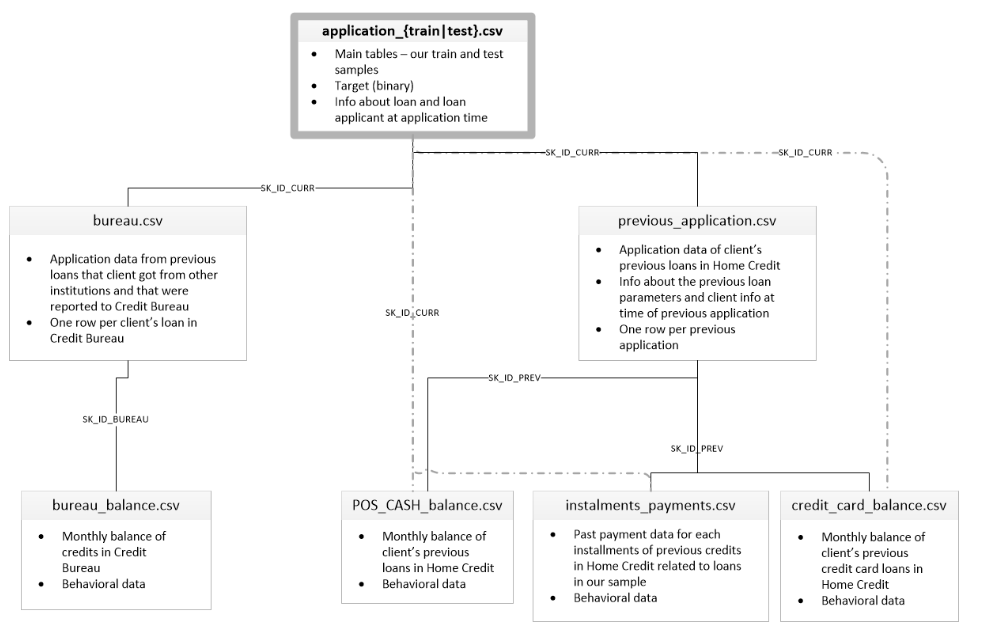

**application_{train|test}.csv**

Il s'agit de la table principale, divisée en deux fichiers pour Train (avec TARGET) et Test (sans TARGET).
Une ligne représente un prêt dans notre échantillon de données.

**bureau.csv**

Tous les crédits antérieurs du client fournis par d'autres institutions financières qui ont été signalés au bureau de crédit (pour les clients qui ont un prêt dans notre échantillon).
Pour chaque prêt de notre échantillon, il y a autant de lignes que le nombre de crédits que le client avait dans le Credit Bureau avant la date de la demande.

**bureau_balance.csv**

Soldes mensuels des crédits antérieurs au bureau de crédit.
Ce tableau comporte une ligne pour chaque mois d'historique de chaque crédit précédent signalé au bureau de crédit - c'est-à-dire que le tableau a nb prêts dans l'échantillon *nb de crédits précédents relatifs * nb de mois où nous avons un historique observable pour les crédits précédents) lignes.

**POS_CASH_balance.csv**

Instantanés mensuels du solde des points de vente précédents et des prêts en espèces que le demandeur avait contractés avec Home Credit.
Ce tableau comporte une ligne pour chaque mois d'historique de chaque crédit précédent dans Home Credit (crédit à la consommation et prêts de trésorerie) liés aux prêts de notre échantillon - c'est-à-dire que le tableau contient des lignes ( nb prêts dans l'échantillon * nb de crédits antérieurs relatifs * nb de mois au cours desquels nous avons un historique observable pour les crédits précédents).

**credit_card_balance.csv**

Aperçus mensuels du solde des cartes de crédit précédentes que le demandeur a avec Home Credit.
Ce tableau comporte une ligne pour chaque mois d'historique de chaque crédit précédent dans Home Credit (crédit à la consommation et prêts de trésorerie) liés aux prêts de notre échantillon - c'est-à-dire que le tableau a ( nb prêts dans l'échantillon * nb de cartes de crédit précédentes relatives * nb de mois où nous avons un historique observable pour la carte de crédit précédente) lignes.

**application_précédente.csv**

Toutes les demandes précédentes de prêts immobiliers des clients qui ont des prêts dans notre échantillon.
Il y a une ligne pour chaque demande précédente liée aux prêts dans notre échantillon de données.
versements_paiements.csv

Historique de remboursement des crédits précédemment décaissés en Home Credit liés aux prêts de notre échantillon.
Il y a :  

    a) une ligne pour chaque paiement effectué + 
    b) une ligne pour chaque paiement manqué
    
Une ligne équivaut à un versement d'une échéance OU une échéance correspondant à un versement d'un précédent crédit immobilier lié aux crédits de notre échantillon.

**Credit_columns_description.csv**

Ce fichier contient les descriptions des colonnes des différents fichiers de données.

##  Chargement et nettoyage des jeux de données¶

In [8]:
path=("C:\\Users\\serge\OneDrive\\Documents\\Documents\\DATA SCIENTIST\\P7\\data\\")

In [9]:
# Lecture des fichiers et réduction de la mémoire utilisée

X_train = pd.read_csv(path+'application_train.csv')

X_test = pd.read_csv(path+'application_test.csv')

bureau = pd.read_csv(path+'bureau.csv')

bureau_balance = pd.read_csv(path+'bureau_balance.csv')

pos_cash = pd.read_csv(path+'POS_CASH_balance.csv')

credit_card = pd.read_csv(path+'credit_card_balance.csv')

previous_application = pd.read_csv(path+'previous_application.csv')

installments_payments = pd.read_csv(path+'installments_payments.csv')

columns_description = pd.read_csv(path+'HomeCredit_columns_description.csv',encoding="latin1")

In [10]:
# créer dataframe reprenant les informations descriptives des datasets

datasets = [X_train, X_test, bureau, bureau_balance, pos_cash, credit_card, 
            previous_application, installments_payments, columns_description]

titres = ["X_train", "X_test", "bureau", "bureau_balance", "pos_cash", "credit_card", 
          "previous_application", "installments_payments", "columns_description"]

infos_df = pd.DataFrame({},)
infos_df['dataset'] = titres

infos_df['no_of_columns'] = [len(df.columns) for df in datasets]
infos_df['columns_name'] = [', '.join(list(df.columns)) for df in datasets]
infos_df['no_of_rows'] = [len(df) for df in datasets]

infos_df.style.background_gradient(cmap='rocket')

,dataset,no_of_columns,columns_name,no_of_rows
0,X_train,122,"SK_ID_CURR, TARGET, NAME_CONTRACT_TYPE, CODE_GENDER, FLAG_OWN_CAR, FLAG_OWN_REALTY, CNT_CHILDREN, AMT_INCOME_TOTAL, AMT_CREDIT, AMT_ANNUITY, AMT_GOODS_PRICE, NAME_TYPE_SUITE, NAME_INCOME_TYPE, NAME_EDUCATION_TYPE, NAME_FAMILY_STATUS, NAME_HOUSING_TYPE, REGION_POPULATION_RELATIVE, DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, OWN_CAR_AGE, FLAG_MOBIL, FLAG_EMP_PHONE, FLAG_WORK_PHONE, FLAG_CONT_MOBILE, FLAG_PHONE, FLAG_EMAIL, OCCUPATION_TYPE, CNT_FAM_MEMBERS, REGION_RATING_CLIENT, REGION_RATING_CLIENT_W_CITY, WEEKDAY_APPR_PROCESS_START, HOUR_APPR_PROCESS_START, REG_REGION_NOT_LIVE_REGION, REG_REGION_NOT_WORK_REGION, LIVE_REGION_NOT_WORK_REGION, REG_CITY_NOT_LIVE_CITY, REG_CITY_NOT_WORK_CITY, LIVE_CITY_NOT_WORK_CITY, ORGANIZATION_TYPE, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, FONDKAPREMONT_MODE, HOUSETYPE_MODE, TOTALAREA_MODE, WALLSMATERIAL_MODE, EMERGENCYSTATE_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, FLAG_DOCUMENT_2, FLAG_DOCUMENT_3, FLAG_DOCUMENT_4, FLAG_DOCUMENT_5, FLAG_DOCUMENT_6, FLAG_DOCUMENT_7, FLAG_DOCUMENT_8, FLAG_DOCUMENT_9, FLAG_DOCUMENT_10, FLAG_DOCUMENT_11, FLAG_DOCUMENT_12, FLAG_DOCUMENT_13, FLAG_DOCUMENT_14, FLAG_DOCUMENT_15, FLAG_DOCUMENT_16, FLAG_DOCUMENT_17, FLAG_DOCUMENT_18, FLAG_DOCUMENT_19, FLAG_DOCUMENT_20, FLAG_DOCUMENT_21, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR",307511
1,X_test,121,"SK_ID_CURR, NAME_CONTRACT_TYPE, CODE_GENDER, FLAG_OWN_CAR, FLAG_OWN_REALTY, CNT_CHILDREN, AMT_INCOME_TOTAL, AMT_CREDIT, AMT_ANNUITY, AMT_GOODS_PRICE, NAME_TYPE_SUITE, NAME_INCOME_TYPE, NAME_EDUCATION_TYPE, NAME_FAMILY_STATUS, NAME_HOUSING_TYPE, REGION_POPULATION_RELATIVE, DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, OWN_CAR_AGE, FLAG_MOBIL, FLAG_EMP_PHONE, FLAG_WORK_PHONE, FLAG_CONT_MOBILE, FLAG_PHONE, FLAG_EMAIL, OCCUPATION_TYPE, CNT_FAM_MEMBERS, REGION_RATING_CLIENT, REGION_RATING_CLIENT_W_CITY, WEEKDAY_APPR_PROCESS_START, HOUR_APPR_PROCESS_START, REG_REGION_NOT_LIVE_REGION, REG_REGION_NOT_WORK_REGION, LIVE_REGION_NOT_WORK_REGION, REG_CITY_NOT_LIVE_CITY, REG_CITY_NOT_WORK_CITY, LIVE_CITY_NOT_WORK_CITY, ORGANIZATION_TYPE, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, FONDKAPREMONT_MOD

In [11]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

detail_df = pd.DataFrame({},)

detail_df['dataset'] = titres

detail_df['numeric_features'] = [
    len((df.select_dtypes(include=numerics)).columns) for df in datasets]

detail_df['num_features_name'] = [', '.join(
    list((df.select_dtypes(include=numerics)).columns)) for df in datasets]

detail_df['object_features'] = [
    len((df.select_dtypes(include='object')).columns) for df in datasets]

detail_df['objt_features_name'] = [', '.join(
    list((df.select_dtypes(include='object')).columns)) for df in datasets]

detail_df.style.background_gradient(cmap='rocket')

,dataset,numeric_features,num_features_name,object_features,objt_features_name
0,X_train,106,"SK_ID_CURR, TARGET, CNT_CHILDREN, AMT_INCOME_TOTAL, AMT_CREDIT, AMT_ANNUITY, AMT_GOODS_PRICE, REGION_POPULATION_RELATIVE, DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, OWN_CAR_AGE, FLAG_MOBIL, FLAG_EMP_PHONE, FLAG_WORK_PHONE, FLAG_CONT_MOBILE, FLAG_PHONE, FLAG_EMAIL, CNT_FAM_MEMBERS, REGION_RATING_CLIENT, REGION_RATING_CLIENT_W_CITY, HOUR_APPR_PROCESS_START, REG_REGION_NOT_LIVE_REGION, REG_REGION_NOT_WORK_REGION, LIVE_REGION_NOT_WORK_REGION, REG_CITY_NOT_LIVE_CITY, REG_CITY_NOT_WORK_CITY, LIVE_CITY_NOT_WORK_CITY, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, TOTALAREA_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, FLAG_DOCUMENT_2, FLAG_DOCUMENT_3, FLAG_DOCUMENT_4, FLAG_DOCUMENT_5, FLAG_DOCUMENT_6, FLAG_DOCUMENT_7, FLAG_DOCUMENT_8, FLAG_DOCUMENT_9, FLAG_DOCUMENT_10, FLAG_DOCUMENT_11, FLAG_DOCUMENT_12, FLAG_DOCUMENT_13, FLAG_DOCUMENT_14, FLAG_DOCUMENT_15, FLAG_DOCUMENT_16, FLAG_DOCUMENT_17, FLAG_DOCUMENT_18, FLAG_DOCUMENT_19, FLAG_DOCUMENT_20, FLAG_DOCUMENT_21, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR",16,"NAME_CONTRACT_TYPE, CODE_GENDER, FLAG_OWN_CAR, FLAG_OWN_REALTY, NAME_TYPE_SUITE, NAME_INCOME_TYPE, NAME_EDUCATION_TYPE, NAME_FAMILY_STATUS, NAME_HOUSING_TYPE, OCCUPATION_TYPE, WEEKDAY_APPR_PROCESS_START, ORGANIZATION_TYPE, FONDKAPREMONT_MODE, HOUSETYPE_MODE, WALLSMATERIAL_MODE, EMERGENCYSTATE_MODE"
1,X_test,105,"SK_ID_CURR, CNT_CHILDREN, AMT_INCOME_TOTAL, AMT_CREDIT, AMT_ANNUITY, AMT_GOODS_PRICE, REGION_POPULATION_RELATIVE, DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, OWN_CAR_AGE, FLAG_MOBIL, FLAG_EMP_PHONE, FLAG_WORK_PHONE, FLAG_CONT_MOBILE, FLAG_PHONE, FLAG_EMAIL, CNT_FAM_MEMBERS, REGION_RATING_CLIENT, REGION_RATING_CLIENT_W_CITY, HOUR_APPR_PROCESS_START, REG_REGION_NOT_LIVE_REGION, REG_REGION_NOT_WORK_REGION, LIVE_REGION_NOT_WORK_REGION, REG_CITY_NOT_LIVE_CITY, REG_CITY_NOT_WORK_CITY, LIVE_CITY_NOT_WORK_CITY, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, TOTALAREA_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, FLAG_DOCUMENT_2, FLAG_DOCUMENT_3, FLAG_DOCUMENT_4, FLAG_DOCUMENT_5,

## Description des Variables

In [12]:
# enlever la colonne Unamed:0 dans columns_description

columns_description.drop(columns='Unnamed: 0', axis=1, inplace=True)
columns_description

,Table,Row,Description,Special
0,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,application_{train|test}.csv,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",NaN
2,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
5,application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,NaN
6,application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,NaN
7,application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,NaN
8,application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,NaN
9,application_{train|test}.csv,AMT_ANNUITY,Loan annuity,NaN


## Nettoyage et Analyse des différents jeux de données


## X_train,X_test

#### taille des dataset

In [13]:
cont(X_train)

taille totale du jeu de donnees : 37516342

nombre de lignes : 307511                             nombre de colonnes : 122

nombre de valeurs manquantes : 9152465           % de valeurs manquantes : 24.4


In [14]:
cont(X_test)

taille totale du jeu de donnees : 5898024

nombre de lignes : 48744                             nombre de colonnes : 121

nombre de valeurs manquantes : 1404419           % de valeurs manquantes : 23.81


#### type de variables

In [15]:
type_var(X_train)

Variables
---------


,Nombre,%
float64,65,53.28
int64,41,33.61
object,16,13.11


In [16]:
type_var(X_test)

Variables
---------


,Nombre,%
float64,65,53.72
int64,40,33.06
object,16,13.22


#### doublons

ici la clé est l'identifiant du prêt ['SK_ID_CURR'] qui doit être unique . On peut vérifier si ce champs comporte des doublons

In [17]:
print(
    f"Nombre d'identifiants de prêts dupliqués dans le jeu d'entrainement : {X_train.duplicated(subset=['SK_ID_CURR']).sum()}")

Nombre d'identifiants de prêts dupliqués dans le jeu d'entrainement : 0


In [18]:
print(
    f"Nombre d'identifiants de prêts dupliqués dans le jeu de test: {X_test.duplicated(subset=['SK_ID_CURR']).sum()}")

Nombre d'identifiants de prêts dupliqués dans le jeu de test: 0


Il n'y a pas de doublons dans les identifiants donc 1 ligne de X_train/Test = 1 identifiant = 1 prêt unique

<Figure size 800x400 with 0 Axes>

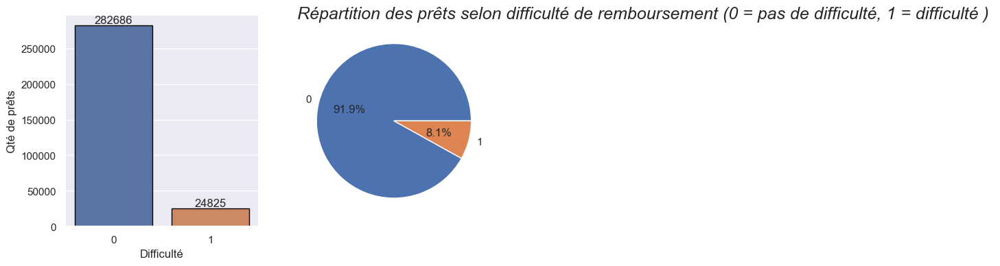

In [19]:
fig = plt.figure(figsize=(8, 4))
#set seaborn plotting aesthetics as default
sns.set()

#define plotting region (1 rows, 2 columns)
fig, ax = plt.subplots(1, 2)


sns.countplot(data=X_train, x="TARGET", edgecolor="black",ax=ax[0])
       
plt.title("Répartition des prêts selon difficulté de remboursement (0 = pas de difficulté, 1 = difficulté ) ",loc='left', fontsize=18, fontstyle='italic')
ax[0].set_xlabel('Difficulté')
ax[0].set_ylabel('Qté de prêts')
for label in ax[0].containers:
    ax[0].bar_label(label)

type_count = X_train['TARGET'].value_counts().reset_index()
ax1=plt.pie(labels=type_count['index'], x=type_count['TARGET'], autopct='%.1f%%')
plt.show()


Il y a une forte disproportion entre le nombre de prêts "sans difficulté" et le nombre de prêts" avec difficulté"  et cela peut nuire à la fiabilité des prédictions. 






Apprentissage à une classe :

Plutôt que d’entraîner un classifieur sur nos 2 classes, on entraîne un détecteur sur la classe majoritaire. Il sera ensuite capable de prédire si un point fait partie de la classe ou non. Même si les modèles d’apprentissage à une classe ne sont pas spécialement conçus pour contrer le déséquilibre des classes, ils peuvent offrir de gros gains de performances.Cette approche peut donner de bons résultats dans certains cas.


**choix des métriques de mesure des performances des modèles**
Avec des données déséquilibrées, il faut opter pour des métriques qui sont moins influencées par la classe majoritaire tels que le recall et le F-score.Si on ne le fait pas ,on peut penser que le modèle donne de bons résultats parce que le score est élevé alors que les prédictions ne sont correctes que pour la classe majoritaire et qu'une grande partie des points de la classe minoritaire sont mal classifiés. Le score est affecté par le déséquilibre des classes.



#### valeurs manquantes

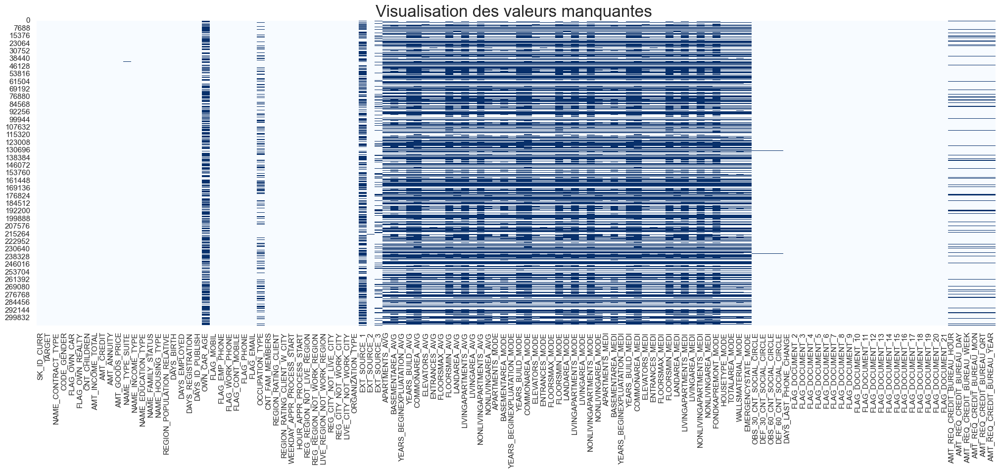

In [20]:
viz_na(X_train)

In [21]:
missing_values(X_train)

,Total,%
COMMONAREA_MEDI,214865,69.87
COMMONAREA_AVG,214865,69.87
COMMONAREA_MODE,214865,69.87
NONLIVINGAPARTMENTS_MODE,213514,69.43
NONLIVINGAPARTMENTS_AVG,213514,69.43
NONLIVINGAPARTMENTS_MEDI,213514,69.43
FONDKAPREMONT_MODE,210295,68.39
LIVINGAPARTMENTS_MODE,210199,68.35
LIVINGAPARTMENTS_AVG,210199,68.35
LIVINGAPARTMENTS_MEDI,210199,68.35


In [22]:
## valeurs manquantes en % 
_top_na=(X_train.isna().mean()*100).sort_values( ascending=True).reset_index()
_top_na=_top_na.rename(columns = {'index': 'variable',0 : "%_na"})
_top_na.tail(10)

,variable,%_na
112,LIVINGAPARTMENTS_AVG,68.35
113,LIVINGAPARTMENTS_MODE,68.35
114,LIVINGAPARTMENTS_MEDI,68.35
115,FONDKAPREMONT_MODE,68.39
116,NONLIVINGAPARTMENTS_AVG,69.43
117,NONLIVINGAPARTMENTS_MEDI,69.43
118,NONLIVINGAPARTMENTS_MODE,69.43
119,COMMONAREA_MODE,69.87
120,COMMONAREA_AVG,69.87
121,COMMONAREA_MEDI,69.87


In [23]:
#### regrouper en classes pour une meilleure visualisation
top_na=_top_na.copy()
top_na["tranche"] = top_na["%_na"]
bin_labels=['[0-10]',']10-20]',']20-30]',']30-40]',']40-50]', ']50-60]', ']60-70]',']70-80]',']80-90]',']90-100]']
top_na["tranche"] =pd.cut(x=top_na["tranche"], bins=[-1,10,20,30,40,50,60,70,80,90,100],labels=bin_labels)
top_na.groupby('tranche').agg({'%_na':['count']})

,%_na
,count
tranche,
[0-10],65
]10-20],7
]20-30],0
]30-40],1
]40-50],8
]50-60],24
]60-70],17
]70-80],0


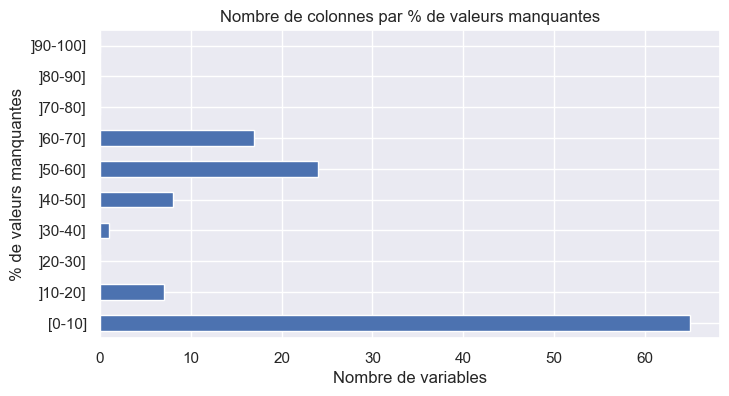

In [24]:
top_na.groupby('tranche').agg({'%_na':['count']}).plot(kind='barh',legend=False)
plt.ylabel('% de valeurs manquantes')
plt.xlabel('Nombre de variables')

plt.title('Nombre de colonnes par % de valeurs manquantes')
plt.show()

Il y a 57 variables qui ont plus de 10% de valeurs manquantes et donc 65 valeurs qui ont au maximum 10%  de valeurs manquantes!

In [25]:
top_na['tranche'].count()

122

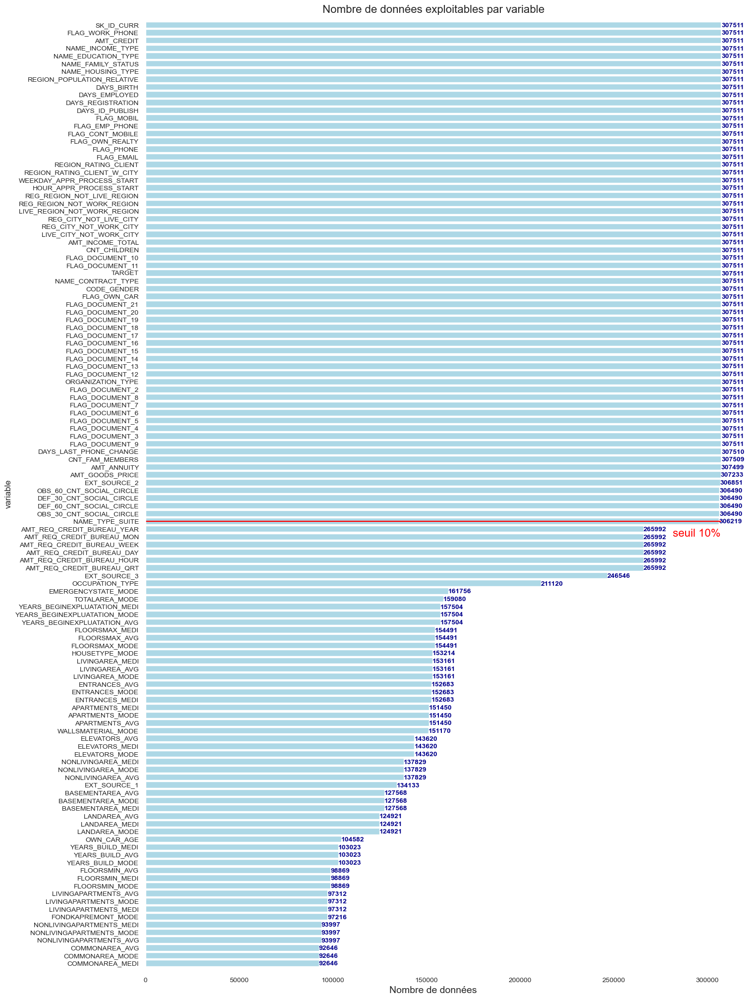

In [26]:
# nombre de données par variable
fig, ax = plt.subplots(figsize=(15, 25))
nb_valeurs = X_train.count()
nb_valeurs.sort_values(inplace=True)
ax.barh(y=nb_valeurs.index, width=nb_valeurs.values, color='lightblue')

## afficher une droite qui représente le nombre de variables de la tranche ]50-75]
ax.plot([0,X_train
         .shape[0]],\
        [top_na['tranche'].count()-top_na.loc[top_na['tranche']=='[0-10]'].count(),\
         top_na['tranche'].count()-top_na.loc[top_na['tranche']=='[0-10]'].count()],color='red')
ax.text(280000,55," seuil 10%",color='red',fontsize=16)
### affichage de la valeur à côté du barplot
for i, v in enumerate(nb_valeurs):
    ax.text(v +5, i-0.30 , str(v), color='darkblue',
            fontsize=10, fontweight='bold')
ax.set_title('Nombre de données exploitables par variable', fontsize=16)
ax.set_xlabel('Nombre de données', fontsize=14)
ax.set_ylabel('variable', fontsize=12)
plt.tick_params(labelsize=10)

ax.set_xlim([0, X_train
             .shape[0]])
ax.set_ylim([-1, X_train
             .shape[1]])
ax.set_facecolor('w')
ax.grid(False)
plt.show()

In [27]:
top_na[top_na['%_na']<=10].count()

variable    65
%_na        65
tranche     65
dtype: int64

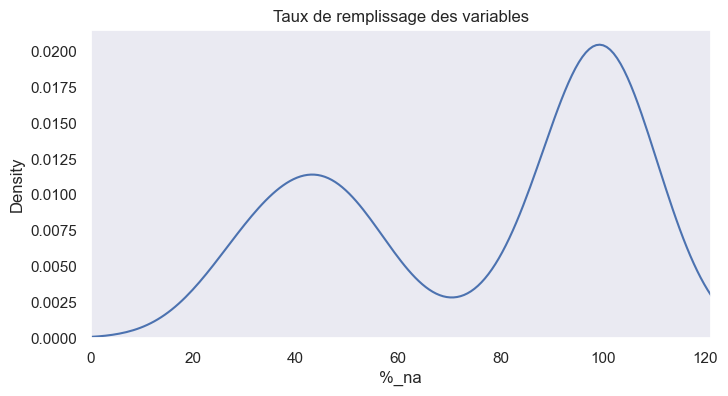

variables restantes : 65


In [28]:
# Représentation graphique du taux de remplissage des champs 
sns.kdeplot(100-top_na['%_na'])
plt.grid(False)
plt.xlim([0,121])
plt.title('Taux de remplissage des variables')
plt.show()
## affecter le nom des colonnes à enlever dans top_na_drop
top_na_drop=top_na[top_na['%_na']>10]
top_na_keep=top_na[top_na['%_na']<=10]
print(f'variables restantes : {top_na_keep.shape[0]}')
plt.show()

In [29]:
### colonnes non conservées
top_na_drop

,variable,%_na,tranche
65,AMT_REQ_CREDIT_BUREAU_HOUR,13.50,]10-20]
66,AMT_REQ_CREDIT_BUREAU_DAY,13.50,]10-20]
67,AMT_REQ_CREDIT_BUREAU_MON,13.50,]10-20]
68,AMT_REQ_CREDIT_BUREAU_WEEK,13.50,]10-20]
69,AMT_REQ_CREDIT_BUREAU_YEAR,13.50,]10-20]
70,AMT_REQ_CREDIT_BUREAU_QRT,13.50,]10-20]
71,EXT_SOURCE_3,19.83,]10-20]
72,OCCUPATION_TYPE,31.35,]30-40]
73,EMERGENCYSTATE_MODE,47.40,]40-50]
74,TOTALAREA_MODE,48.27,]40-50]


In [30]:
## vérification en affichant les statistiques descriptives
top_na_drop.describe().T

,count,mean,std,min,25%,50%,75%,max
%_na,57.00,52.18,16.54,13.50,49.76,53.30,66.50,69.87


In [31]:
##on stocke les variables avec le taux de remplissage < 10% dans une liste
list_na_drop=top_na_drop["variable"].tolist()


In [32]:
list_na_drop

['AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'EXT_SOURCE_3',
 'OCCUPATION_TYPE',
 'EMERGENCYSTATE_MODE',
 'TOTALAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'FLOORSMAX_AVG',
 'FLOORSMAX_MEDI',
 'FLOORSMAX_MODE',
 'HOUSETYPE_MODE',
 'LIVINGAREA_AVG',
 'LIVINGAREA_MODE',
 'LIVINGAREA_MEDI',
 'ENTRANCES_AVG',
 'ENTRANCES_MODE',
 'ENTRANCES_MEDI',
 'APARTMENTS_MEDI',
 'APARTMENTS_AVG',
 'APARTMENTS_MODE',
 'WALLSMATERIAL_MODE',
 'ELEVATORS_MEDI',
 'ELEVATORS_AVG',
 'ELEVATORS_MODE',
 'NONLIVINGAREA_MODE',
 'NONLIVINGAREA_AVG',
 'NONLIVINGAREA_MEDI',
 'EXT_SOURCE_1',
 'BASEMENTAREA_MODE',
 'BASEMENTAREA_AVG',
 'BASEMENTAREA_MEDI',
 'LANDAREA_MEDI',
 'LANDAREA_AVG',
 'LANDAREA_MODE',
 'OWN_CAR_AGE',
 'YEARS_BUILD_MODE',
 'YEARS_BUILD_AVG',
 'YEARS_BUILD_MEDI',
 'FLOORSMIN_AVG',
 'FLOORSMIN_

In [33]:
X_train[list_na_drop].dtypes

AMT_REQ_CREDIT_BUREAU_HOUR      float64
AMT_REQ_CREDIT_BUREAU_DAY       float64
AMT_REQ_CREDIT_BUREAU_MON       float64
AMT_REQ_CREDIT_BUREAU_WEEK      float64
AMT_REQ_CREDIT_BUREAU_YEAR      float64
AMT_REQ_CREDIT_BUREAU_QRT       float64
EXT_SOURCE_3                    float64
OCCUPATION_TYPE                  object
EMERGENCYSTATE_MODE              object
TOTALAREA_MODE                  float64
YEARS_BEGINEXPLUATATION_MODE    float64
YEARS_BEGINEXPLUATATION_AVG     float64
YEARS_BEGINEXPLUATATION_MEDI    float64
FLOORSMAX_AVG                   float64
FLOORSMAX_MEDI                  float64
FLOORSMAX_MODE                  float64
HOUSETYPE_MODE                   object
LIVINGAREA_AVG                  float64
LIVINGAREA_MODE                 float64
LIVINGAREA_MEDI                 float64
ENTRANCES_AVG                   float64
ENTRANCES_MODE                  float64
ENTRANCES_MEDI                  float64
APARTMENTS_MEDI                 float64
APARTMENTS_AVG                  float64


In [34]:
X_train['HOUSETYPE_MODE'].value_counts(normalize=True, dropna=False)*100

NaN                50.18
block of flats     48.94
specific housing    0.49
terraced house      0.39
Name: HOUSETYPE_MODE, dtype: float64

In [35]:
X_train['WALLSMATERIAL_MODE'].value_counts(normalize=True, dropna=False)*100

NaN            50.84
Panel          21.48
Stone, brick   21.08
Block           3.01
Wooden          1.74
Mixed           0.75
Monolithic      0.58
Others          0.53
Name: WALLSMATERIAL_MODE, dtype: float64

In [36]:
X_train['FONDKAPREMONT_MODE'].value_counts(normalize=True, dropna=False)*100

NaN                     68.39
reg oper account        24.01
reg oper spec account    3.93
not specified            1.85
org spec account         1.83
Name: FONDKAPREMONT_MODE, dtype: float64

In [37]:
X_train[list_na_drop].describe(include=[np.number]).T

,count,mean,std,min,25%,50%,75%,max
AMT_REQ_CREDIT_BUREAU_HOUR,"265,992.00",0.01,0.08,0.00,0.00,0.00,0.00,4.00
AMT_REQ_CREDIT_BUREAU_DAY,"265,992.00",0.01,0.11,0.00,0.00,0.00,0.00,9.00
AMT_REQ_CREDIT_BUREAU_MON,"265,992.00",0.27,0.92,0.00,0.00,0.00,0.00,27.00
AMT_REQ_CREDIT_BUREAU_WEEK,"265,992.00",0.03,0.20,0.00,0.00,0.00,0.00,8.00
AMT_REQ_CREDIT_BUREAU_YEAR,"265,992.00",1.90,1.87,0.00,0.00,1.00,3.00,25.00
AMT_REQ_CREDIT_BUREAU_QRT,"265,992.00",0.27,0.79,0.00,0.00,0.00,0.00,261.00
EXT_SOURCE_3,"246,546.00",0.51,0.19,0.00,0.37,0.54,0.67,0.90
TOTALAREA_MODE,"159,080.00",0.10,0.11,0.00,0.04,0.07,0.13,1.00
YEARS_BEGINEXPLUATATION_MODE,"157,504.00",0.98,0.06,0.00,0.98,0.98,0.99,1.00
YEARS_BEGINEXPLUATATION_AVG,"157,504.00",0.98,0.06,0.00,0.98,0.98,0.99,1.00


In [38]:
### enlever les  colonnes avec taux de nan au dessus du seuil fixé
X_train=X_train.drop(columns=list_na_drop)
X_train.shape

(307511, 65)

In [39]:
## valeurs manquantes en % 
top_na2=(X_train.isna().mean()*100).sort_values( ascending=True).reset_index()
top_na2=top_na2.rename(columns = {'index': 'variable',0 : "%_na"})
top_na2=top_na2.loc[top_na2['%_na']>0]
top_na2

,variable,%_na
55,DAYS_LAST_PHONE_CHANGE,0.00
56,CNT_FAM_MEMBERS,0.00
57,AMT_ANNUITY,0.00
58,AMT_GOODS_PRICE,0.09
59,EXT_SOURCE_2,0.21
60,OBS_30_CNT_SOCIAL_CIRCLE,0.33
61,DEF_30_CNT_SOCIAL_CIRCLE,0.33
62,OBS_60_CNT_SOCIAL_CIRCLE,0.33
63,DEF_60_CNT_SOCIAL_CIRCLE,0.33
64,NAME_TYPE_SUITE,0.42


In [40]:
# liste des variables avec des valeurs manquantes
list_na=top_na2["variable"].tolist()

In [41]:
list_na

['DAYS_LAST_PHONE_CHANGE',
 'CNT_FAM_MEMBERS',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'EXT_SOURCE_2',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'NAME_TYPE_SUITE']

In [42]:
X_train[list_na].dtypes

DAYS_LAST_PHONE_CHANGE      float64
CNT_FAM_MEMBERS             float64
AMT_ANNUITY                 float64
AMT_GOODS_PRICE             float64
EXT_SOURCE_2                float64
OBS_30_CNT_SOCIAL_CIRCLE    float64
DEF_30_CNT_SOCIAL_CIRCLE    float64
OBS_60_CNT_SOCIAL_CIRCLE    float64
DEF_60_CNT_SOCIAL_CIRCLE    float64
NAME_TYPE_SUITE              object
dtype: object

In [43]:
X_train[list_na].describe(include=[np.number]).T

,count,mean,std,min,25%,50%,75%,max
DAYS_LAST_PHONE_CHANGE,"307,510.00",-962.86,826.81,"-4,292.00","-1,570.00",-757.00,-274.00,0.00
CNT_FAM_MEMBERS,"307,509.00",2.15,0.91,1.00,2.00,2.00,3.00,20.00
AMT_ANNUITY,"307,499.00","27,108.57","14,493.74","1,615.50","16,524.00","24,903.00","34,596.00","258,025.50"
AMT_GOODS_PRICE,"307,233.00","538,396.21","369,446.46","40,500.00","238,500.00","450,000.00","679,500.00","4,050,000.00"
EXT_SOURCE_2,"306,851.00",0.51,0.19,0.00,0.39,0.57,0.66,0.85
OBS_30_CNT_SOCIAL_CIRCLE,"306,490.00",1.42,2.40,0.00,0.00,0.00,2.00,348.00
DEF_30_CNT_SOCIAL_CIRCLE,"306,490.00",0.14,0.45,0.00,0.00,0.00,0.00,34.00
OBS_60_CNT_SOCIAL_CIRCLE,"306,490.00",1.41,2.38,0.00,0.00,0.00,2.00,344.00
DEF_60_CNT_SOCIAL_CIRCLE,"306,490.00",0.10,0.36,0.00,0.00,0.00,0.00,24.00


In [44]:
list_na


['DAYS_LAST_PHONE_CHANGE',
 'CNT_FAM_MEMBERS',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'EXT_SOURCE_2',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'NAME_TYPE_SUITE']

Regardons la distribution des variables numériques

In [45]:
list_na.remove('NAME_TYPE_SUITE')

Nous pouvons afficher les distributions afin de connaitre la loi que suivent les données avant de décider de la méthode d'imputation des valeurs manquantes.

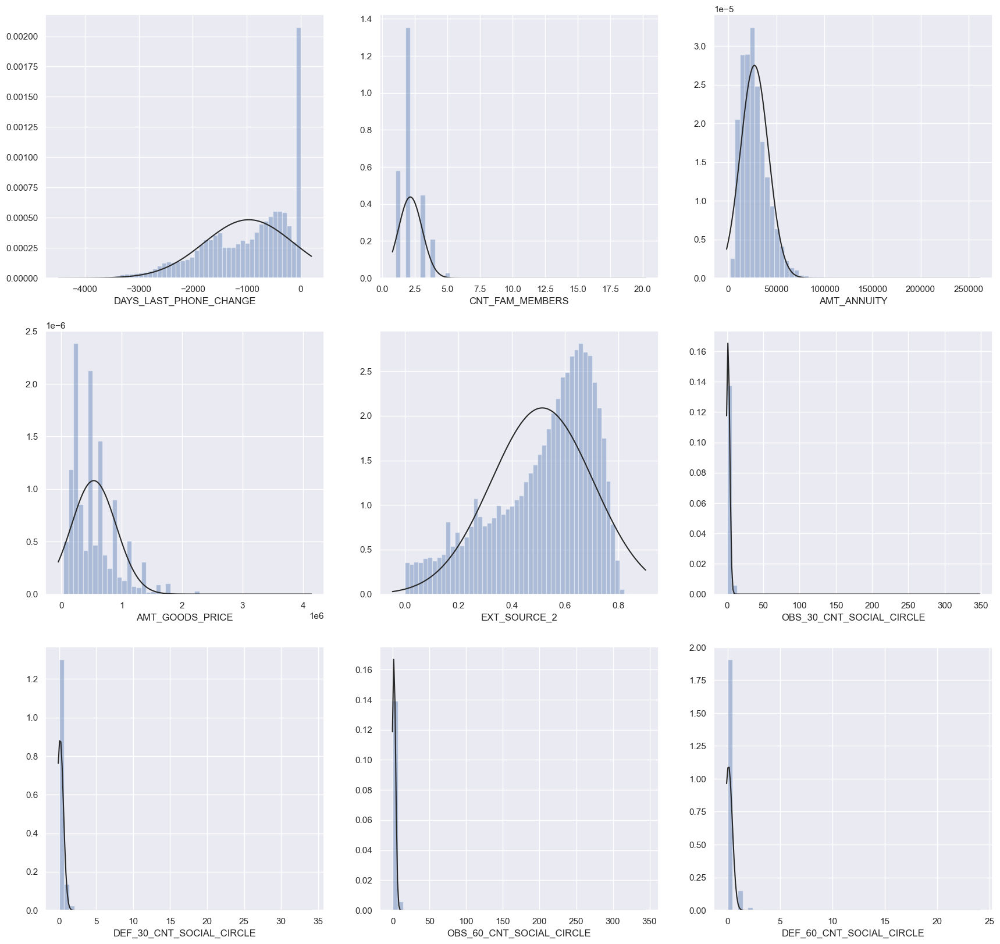

In [46]:
fig = plt.figure(figsize=(21,20))
for i in enumerate(X_train[list_na]):
    fig.add_subplot(3,3,i[0]+1)
    ax=sns.distplot(X_train[i[1]], fit=stats.norm, kde=False)

Les distributions représentées ci-dessus ne suivent pas une loi normale.

In [47]:
# je vais utiliser KNN pour imputer les  variables manquantes

data=X_train[list_na]
# On entraine le modèle d'imputation sur un échantillon de données
knn_features = data.columns
sample_data = X_train[knn_features].sample(frac=0.20, random_state=1)
imputer = KNNImputer(n_neighbors=5, missing_values=np.nan).fit(sample_data)

In [48]:
# Puis on applique le modèle sur l'ensemble des données

data_imputed = imputer.transform(X_train[knn_features])

X_train_data_imputed = pd.DataFrame(data_imputed, columns=knn_features)

On vérifie les distributions après imputation

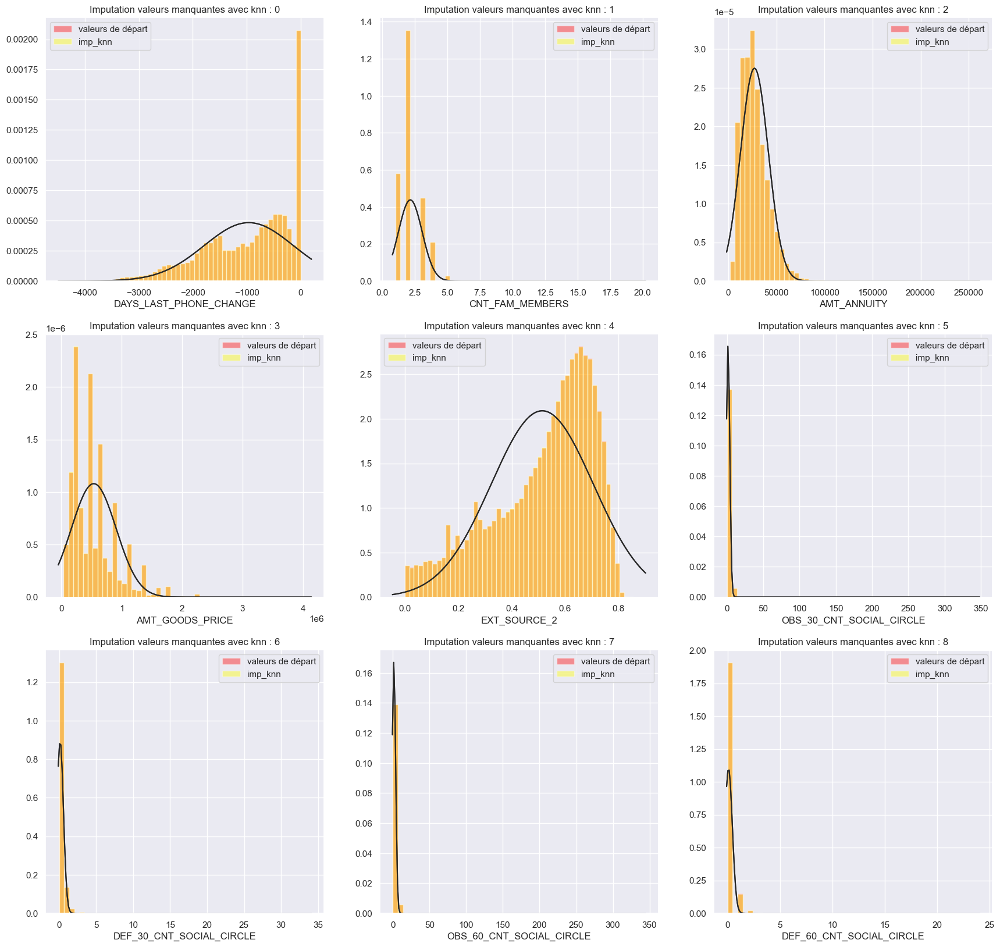

In [49]:
fig = plt.figure(figsize=(21,20))
for i in enumerate(X_train[list_na]):
    fig.add_subplot(3,3,i[0]+1)
    ax=sns.distplot(X_train[i[1]], fit=stats.norm, kde=False,color="red",label= 'valeurs de départ')
    ax=sns.distplot(X_train_data_imputed[i[1]], fit=stats.norm, kde=False,color="yellow",label="imp_knn")
    ax.set_title("Imputation valeurs manquantes avec knn : {}".format(i[0]))
    plt.legend()


L'imputation des valeurs manquantes n'a pas modifié les distributions. Les courbes sont pratiquement identiques avant et après transformation . Nous pouvons charger les valeurs imputées dans notre dataframe X_train_clean

In [50]:
clean_X_train=X_train.copy()
for col_knn in knn_features:
    clean_X_train[col_knn] = X_train_data_imputed[col_knn].values

In [51]:
clean_X_train[list_na].describe().T

,count,mean,std,min,25%,50%,75%,max
DAYS_LAST_PHONE_CHANGE,"307,511.00",-962.86,826.81,"-4,292.00","-1,570.00",-757.00,-274.00,0.00
CNT_FAM_MEMBERS,"307,511.00",2.15,0.91,1.00,2.00,2.00,3.00,20.00
AMT_ANNUITY,"307,511.00","27,108.46","14,493.57","1,615.50","16,524.00","24,903.00","34,596.00","258,025.50"
AMT_GOODS_PRICE,"307,511.00","538,160.07","369,405.44","40,500.00","238,500.00","450,000.00","679,500.00","4,050,000.00"
EXT_SOURCE_2,"307,511.00",0.51,0.19,0.00,0.39,0.57,0.66,0.85
OBS_30_CNT_SOCIAL_CIRCLE,"307,511.00",1.42,2.40,0.00,0.00,0.00,2.00,348.00
DEF_30_CNT_SOCIAL_CIRCLE,"307,511.00",0.14,0.45,0.00,0.00,0.00,0.00,34.00
OBS_60_CNT_SOCIAL_CIRCLE,"307,511.00",1.40,2.38,0.00,0.00,0.00,2.00,344.00
DEF_60_CNT_SOCIAL_CIRCLE,"307,511.00",0.10,0.36,0.00,0.00,0.00,0.00,24.00


In [52]:
clean_X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 65 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   CNT_CHILDREN                 307511 non-null  int64  
 7   AMT_INCOME_TOTAL             307511 non-null  float64
 8   AMT_CREDIT                   307511 non-null  float64
 9   AMT_ANNUITY                  307511 non-null  float64
 10  AMT_GOODS_PRICE              307511 non-null  float64
 11  NAME_TYPE_SUITE              306219 non-null  object 
 12  NAME_INCOME_TYPE             307511 non-null  object 
 13 

Il reste des valeurs manquantes dans  la variable NAME_TYPE_SUITE qui indique qui accompagnait le demandeur du prêt à la banque. Dans plus de 80% des cas,il n'était pas accompagné.

In [53]:
clean_X_train['NAME_TYPE_SUITE'].value_counts(normalize=True, dropna=False)*100

Unaccompanied     80.82
Family            13.06
Spouse, partner    3.70
Children           1.06
Other_B            0.58
NaN                0.42
Other_A            0.28
Group of people    0.09
Name: NAME_TYPE_SUITE, dtype: float64

In [54]:
# Regroupement des modalités

map_name_type_suite = {'Unaccompanied' : 'Non_accompagné',
                       'Family' : 'Famille',
                       'Spouse, partner' : 'Famille',
                       'Children' : 'Famille',
                       'Other_A' : 'Autres',
                       'Other_B' : 'Autres',
                       'Group of people' : 'Autres'}

clean_X_train['NAME_TYPE_SUITE'] = clean_X_train['NAME_TYPE_SUITE'].map(map_name_type_suite)

In [55]:
from sklearn.impute import SimpleImputer
 ### il y a 4 strategies : mean,median,most_frequent et constant
imp = SimpleImputer(missing_values=np.nan, strategy='most_frequent')  
clean_X_train['NAME_TYPE_SUITE'] = imp.fit_transform(clean_X_train['NAME_TYPE_SUITE'].values.reshape(-1,1))
clean_X_train['NAME_TYPE_SUITE'].isna().sum()

0

In [56]:
clean_X_train['NAME_TYPE_SUITE'].value_counts(normalize=True, dropna=False)*100

Non_accompagné   81.24
Famille          17.82
Autres            0.95
Name: NAME_TYPE_SUITE, dtype: float64

In [57]:
# nombre de cellules nan dans dataframe

clean_X_train.isna().sum().sum()

0

Nous devons faire à présent les mêmes opérations dans X_test

In [58]:
### enlever les  colonnes avec taux de nan au dessus du seuil fixé
X_test=X_test.drop(columns=list_na_drop)
X_test.shape

(48744, 64)

In [59]:
## valeurs manquantes en % 
top_na3=(X_test.isna().mean()*100).sort_values( ascending=True).reset_index()
top_na3=top_na3.rename(columns = {'index': 'variable',0 : "%_na"})
top_na3=top_na3.loc[top_na3['%_na']>0]
top_na3

,variable,%_na
57,EXT_SOURCE_2,0.02
58,AMT_ANNUITY,0.05
59,OBS_30_CNT_SOCIAL_CIRCLE,0.06
60,DEF_30_CNT_SOCIAL_CIRCLE,0.06
61,OBS_60_CNT_SOCIAL_CIRCLE,0.06
62,DEF_60_CNT_SOCIAL_CIRCLE,0.06
63,NAME_TYPE_SUITE,1.87


In [60]:
# je vais utiliser KNN pour imputer les  variables manquantes

data=X_test[list_na]
# On entraine le modèle d'imputation sur un échantillon de données
knn_features = data.columns
sample_data = X_test[knn_features].sample(frac=0.20, random_state=1)
imputer = KNNImputer(n_neighbors=5, missing_values=np.nan).fit(sample_data)

In [61]:
# Puis on applique le modèle sur l'ensemble des données

data_imputed = imputer.transform(X_test[knn_features])

X_test_data_imputed = pd.DataFrame(data_imputed, columns=knn_features)

In [62]:
#  Nous pouvons charger les valeurs imputées dans notre dataframe clean_X_test
clean_X_test=X_test.copy()
for col_knn in knn_features:
    clean_X_test[col_knn] = X_test_data_imputed[col_knn].values

In [63]:
clean_X_test[list_na].describe().T

,count,mean,std,min,25%,50%,75%,max
DAYS_LAST_PHONE_CHANGE,"48,744.00","-1,077.77",878.92,"-4,361.00","-1,766.25",-863.00,-363.00,0.00
CNT_FAM_MEMBERS,"48,744.00",2.15,0.89,1.00,2.00,2.00,3.00,21.00
AMT_ANNUITY,"48,744.00","29,425.38","16,015.68","2,295.00","17,971.88","26,194.50","37,390.50","180,576.00"
AMT_GOODS_PRICE,"48,744.00","462,618.84","336,710.22","45,000.00","225,000.00","396,000.00","630,000.00","2,245,500.00"
EXT_SOURCE_2,"48,744.00",0.52,0.18,0.00,0.41,0.56,0.66,0.85
OBS_30_CNT_SOCIAL_CIRCLE,"48,744.00",1.45,3.61,0.00,0.00,0.00,2.00,354.00
DEF_30_CNT_SOCIAL_CIRCLE,"48,744.00",0.14,0.51,0.00,0.00,0.00,0.00,34.00
OBS_60_CNT_SOCIAL_CIRCLE,"48,744.00",1.44,3.58,0.00,0.00,0.00,2.00,351.00
DEF_60_CNT_SOCIAL_CIRCLE,"48,744.00",0.10,0.40,0.00,0.00,0.00,0.00,24.00


In [64]:
clean_X_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Data columns (total 64 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   SK_ID_CURR                   48744 non-null  int64  
 1   NAME_CONTRACT_TYPE           48744 non-null  object 
 2   CODE_GENDER                  48744 non-null  object 
 3   FLAG_OWN_CAR                 48744 non-null  object 
 4   FLAG_OWN_REALTY              48744 non-null  object 
 5   CNT_CHILDREN                 48744 non-null  int64  
 6   AMT_INCOME_TOTAL             48744 non-null  float64
 7   AMT_CREDIT                   48744 non-null  float64
 8   AMT_ANNUITY                  48744 non-null  float64
 9   AMT_GOODS_PRICE              48744 non-null  float64
 10  NAME_TYPE_SUITE              47833 non-null  object 
 11  NAME_INCOME_TYPE             48744 non-null  object 
 12  NAME_EDUCATION_TYPE          48744 non-null  object 
 13  NAME_FAMILY_STAT

Il reste des valeurs manquantes dans  la variable NAME_TYPE_SUITE qui indique qui accompagnait le demandeur du prêt à la banque. 

In [65]:
# Regroupement des modalités

map_name_type_suite = {'Unaccompanied' : 'Non_accompagné',
                       'Family' : 'Famille',
                       'Spouse, partner' : 'Famille',
                       'Children' : 'Famille',
                       'Other_A' : 'Autres',
                       'Other_B' : 'Autres',
                       'Group of people' : 'Autres'}

clean_X_test['NAME_TYPE_SUITE'] = clean_X_test['NAME_TYPE_SUITE'].map(map_name_type_suite)

In [66]:
clean_X_test['NAME_TYPE_SUITE'].value_counts(normalize=True, dropna=False)*100

Non_accompagné   81.50
Famille          15.87
NaN               1.87
Autres            0.76
Name: NAME_TYPE_SUITE, dtype: float64

In [67]:
from sklearn.impute import SimpleImputer
 ### il y a 4 strategies : mean,median,most_frequent et constant
imp = SimpleImputer(missing_values=np.nan, strategy='most_frequent')  
clean_X_test['NAME_TYPE_SUITE'] = imp.fit_transform(clean_X_test['NAME_TYPE_SUITE'].values.reshape(-1,1))
clean_X_test['NAME_TYPE_SUITE'].isna().sum()

0

In [68]:
# nombre de cellules nan dans dataframe

clean_X_test.isna().sum().sum()

0

In [69]:
print('clean_X_train :',clean_X_train.shape,'  &    clean_X_test :', clean_X_test.shape)

clean_X_train : (307511, 65)   &    clean_X_test : (48744, 64)


In [70]:
clean_X_train.select_dtypes(['object']).columns

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'ORGANIZATION_TYPE'],
      dtype='object')

### Quel  type de prêt  le client a t-il souscrit ?  trésorerie ou renouvelable

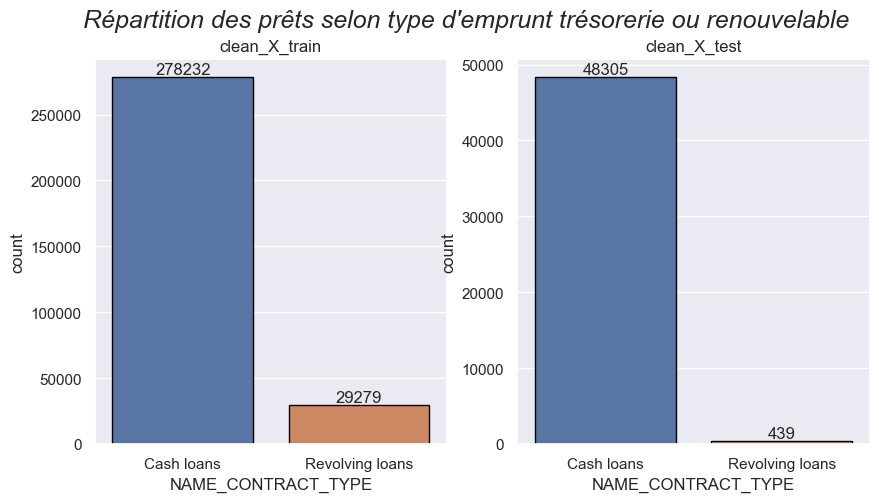

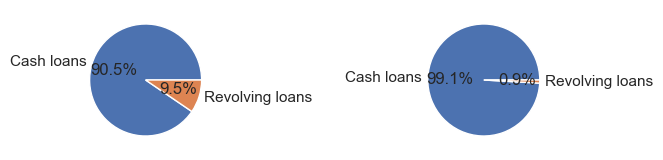

In [71]:
plt.figure(figsize = (10,5))


plt.subplot(1,2,1)
plt.suptitle("Répartition des prêts selon type d'emprunt trésorerie ou renouvelable ", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="NAME_CONTRACT_TYPE", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="NAME_CONTRACT_TYPE", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['NAME_CONTRACT_TYPE'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['NAME_CONTRACT_TYPE'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['NAME_CONTRACT_TYPE'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['NAME_CONTRACT_TYPE'], autopct='%.1f%%')


plt.show()

### Quel est le genre du client ?

In [72]:
clean_X_train['CODE_GENDER'].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

In [73]:
clean_X_train[clean_X_train.CODE_GENDER == 'XNA']

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21
35657,141289,0,Revolving loans,XNA,Y,Y,0,"207,000.00","382,500.00","19,125.00",...,0,0,0,0,0,0,0,0,0,0
38566,144669,0,Revolving loans,XNA,N,Y,2,"157,500.00","270,000.00","13,500.00",...,0,0,0,0,0,0,0,0,0,0
83382,196708,0,Revolving loans,XNA,N,Y,1,"135,000.00","405,000.00","20,250.00",...,0,0,0,0,0,0,0,0,0,0
189640,319880,0,Revolving loans,XNA,Y,Y,0,"247,500.00","540,000.00","27,000.00",...,0,0,0,0,0,0,0,0,0,0


In [74]:
# On peut imputer la modalité la plus fréquente aux 4 clients dont le genre est inconnu (Femme)

map_genre = {'F' : 'Femme',
             'M' : 'Homme',
             'XNA' : 'Femme'}

clean_X_train['CODE_GENDER'] = clean_X_train['CODE_GENDER'].map(map_genre)
clean_X_test['CODE_GENDER'] = clean_X_test['CODE_GENDER'].map(map_genre)

clean_X_train.shape, clean_X_test.shape

((307511, 65), (48744, 64))

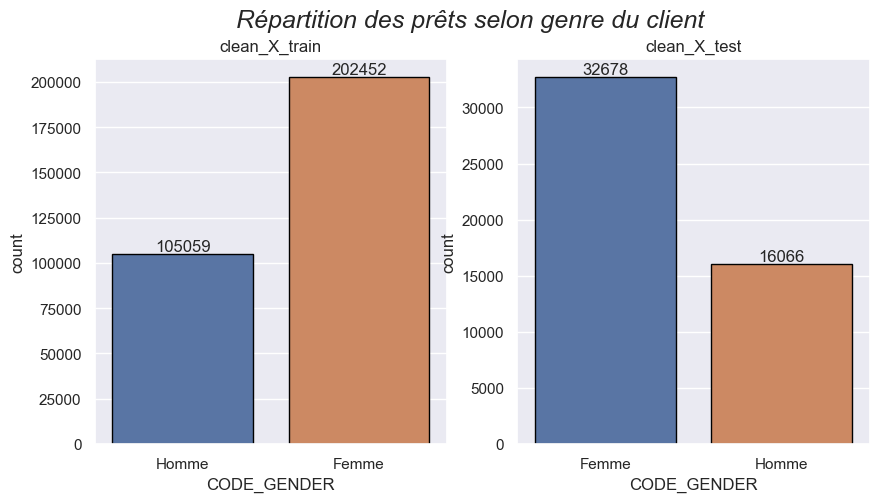

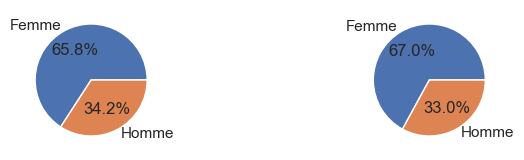

In [75]:
plt.figure(figsize = (10,5))


plt.subplot(1,2,1)
plt.suptitle("Répartition des prêts selon genre du client", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="CODE_GENDER", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="CODE_GENDER", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['CODE_GENDER'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['CODE_GENDER'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['CODE_GENDER'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['CODE_GENDER'], autopct='%.1f%%')


plt.show()

### Le client possède t-il une voiture ?

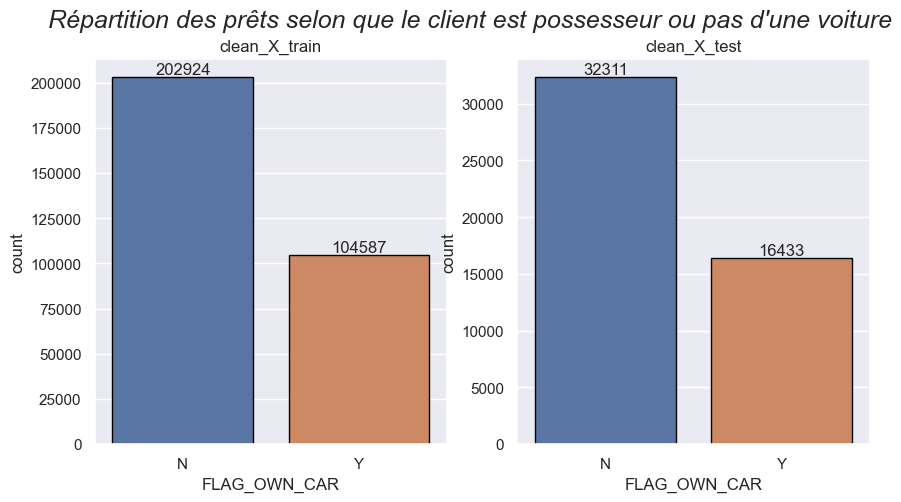

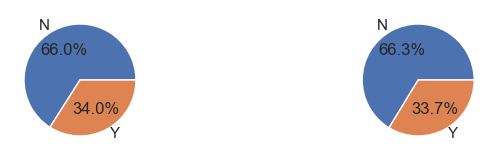

In [76]:
plt.figure(figsize = (10,5))


plt.subplot(1,2,1)
plt.suptitle("Répartition des prêts selon que le client est possesseur ou pas d'une voiture", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="FLAG_OWN_CAR", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="FLAG_OWN_CAR", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['FLAG_OWN_CAR'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['FLAG_OWN_CAR'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['FLAG_OWN_CAR'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['FLAG_OWN_CAR'], autopct='%.1f%%')


plt.show()

### Le client est -il propriétaire d'une maison ou d'un appartement ?

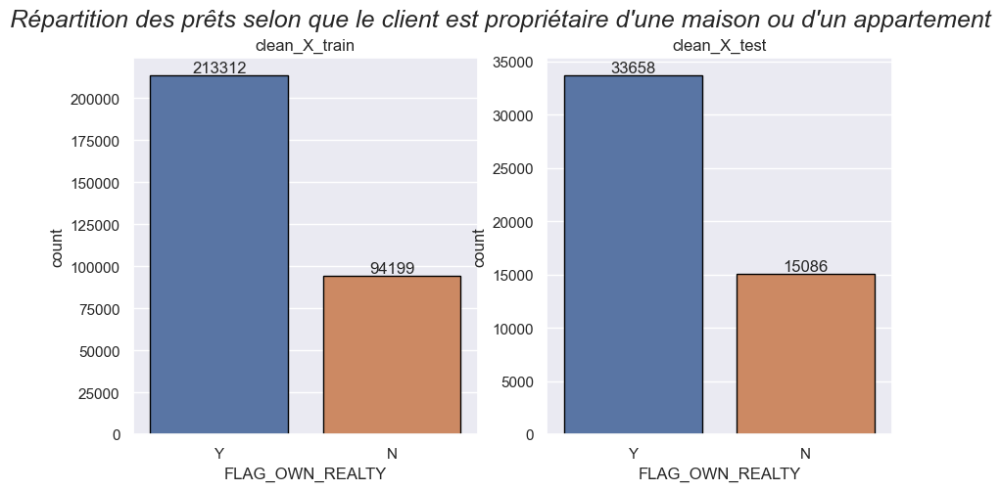

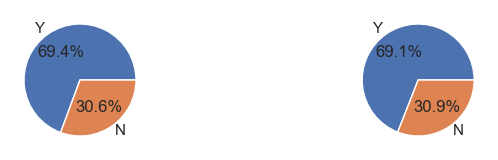

In [77]:
plt.figure(figsize = (10,5))


plt.subplot(1,2,1)
plt.suptitle("Répartition des prêts selon que le client est propriétaire d'une maison ou d'un appartement", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="FLAG_OWN_REALTY", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="FLAG_OWN_REALTY", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['FLAG_OWN_REALTY'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['FLAG_OWN_REALTY'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['FLAG_OWN_REALTY'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['FLAG_OWN_REALTY'], autopct='%.1f%%')


plt.show()

### Le client était -il accompagné lors de sa demande de prêt ?

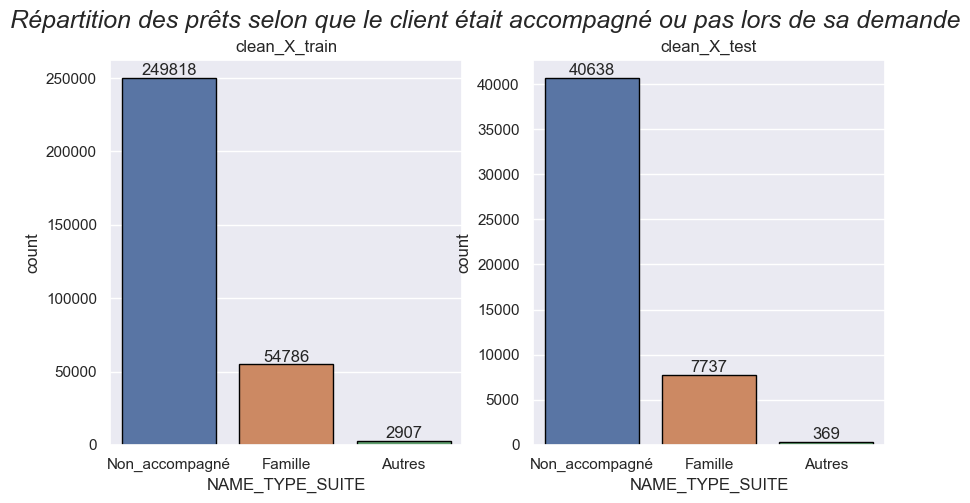

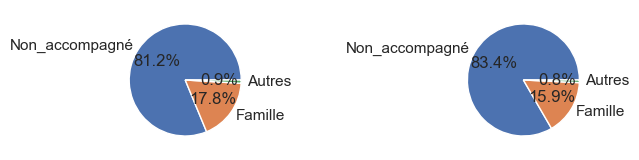

In [78]:
plt.figure(figsize = (10,5))


plt.subplot(1,2,1)
plt.suptitle("Répartition des prêts selon que le client était accompagné ou pas lors de sa demande", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="NAME_TYPE_SUITE", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="NAME_TYPE_SUITE", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['NAME_TYPE_SUITE'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['NAME_TYPE_SUITE'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['NAME_TYPE_SUITE'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['NAME_TYPE_SUITE'], autopct='%.1f%%')


plt.show()

### Quelle est la situation professionnelle du client ?

In [79]:
clean_X_train['NAME_INCOME_TYPE'].value_counts()

Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64

In [80]:
# Regroupement des modalités

map_name_income_type = {'Working' : 'employé',
                        'Commercial associate' : 'homme_d_affaire',
                        'Pensioner' : 'sans_emploi',
                        'State servant' : 'fonctionnaire',
                        'Unemployed' : 'sans_emploi',
                        'Student' : 'sans_emploi',
                        'Businessman':'homme_d_affaire',
                        'Maternity leave' : 'sans_emploi'}

clean_X_train['NAME_INCOME_TYPE'] = clean_X_train['NAME_INCOME_TYPE'].map(map_name_income_type)
clean_X_test['NAME_INCOME_TYPE'] = clean_X_test['NAME_INCOME_TYPE'].map(map_name_income_type)

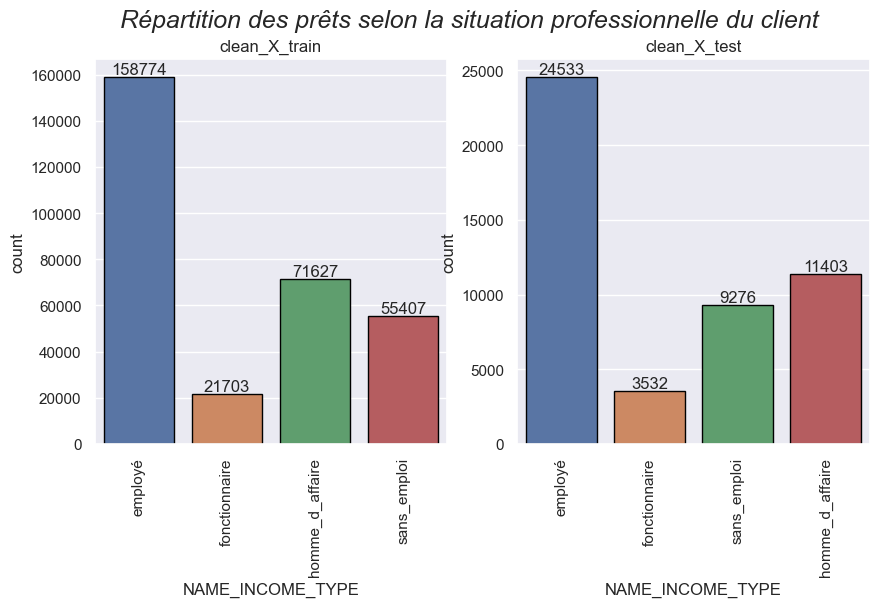

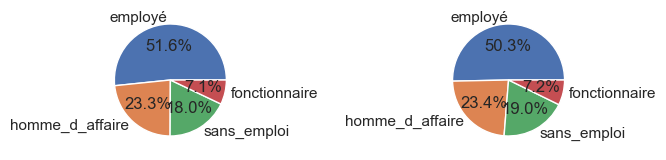

In [81]:
plt.figure(figsize = (10,5))


plt.subplot(1,2,1)
plt.suptitle("Répartition des prêts selon la situation professionnelle du client", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="NAME_INCOME_TYPE", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="NAME_INCOME_TYPE", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['NAME_INCOME_TYPE'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['NAME_INCOME_TYPE'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['NAME_INCOME_TYPE'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['NAME_INCOME_TYPE'], autopct='%.1f%%')


plt.show()

### Quel est le niveau d'études du client ?

In [82]:
clean_X_train['NAME_EDUCATION_TYPE'].value_counts()

Secondary / secondary special    218391
Higher education                  74863
Incomplete higher                 10277
Lower secondary                    3816
Academic degree                     164
Name: NAME_EDUCATION_TYPE, dtype: int64

In [83]:
# Regroupement des modalités

map_name_education_type = {'Lower secondary' : 'enseignement_secondaire',
                           'Secondary / secondary special' : 'enseignement_secondaire',
                           'Higher education' : 'enseignement_superieur',
                           'Academic degree' : 'enseignement_superieur',
                           'Incomplete higher' : 'enseignement_superieur'}

clean_X_train['NAME_EDUCATION_TYPE'] = clean_X_train['NAME_EDUCATION_TYPE'].map(map_name_education_type)

clean_X_test['NAME_EDUCATION_TYPE'] = clean_X_test['NAME_EDUCATION_TYPE'].map(map_name_education_type)

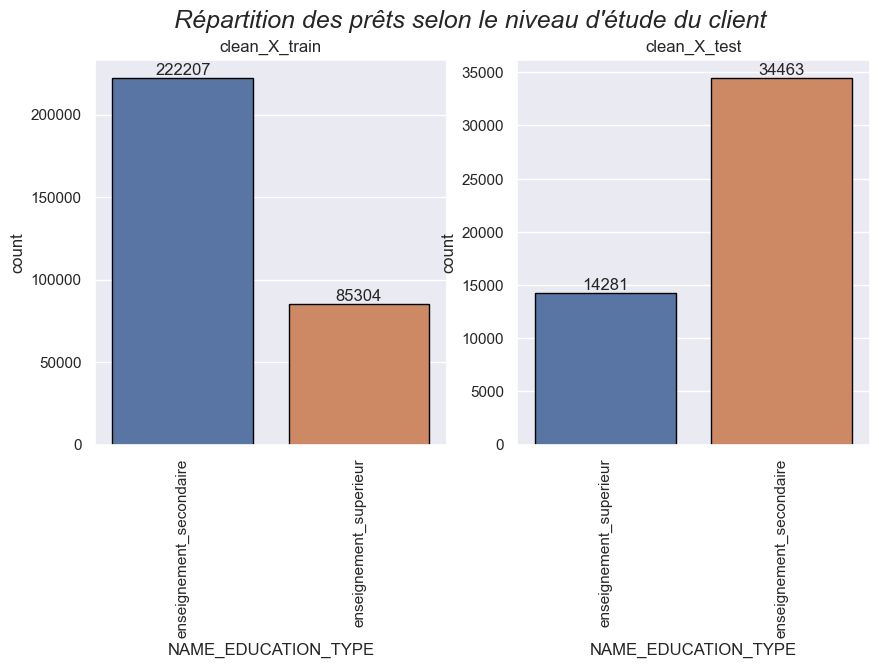

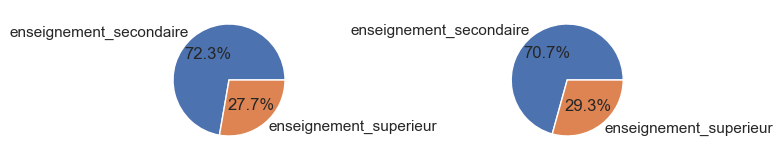

In [84]:
plt.figure(figsize = (10,5))


plt.subplot(1,2,1)
plt.suptitle("Répartition des prêts selon le niveau d'étude du client", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="NAME_EDUCATION_TYPE", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="NAME_EDUCATION_TYPE", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['NAME_EDUCATION_TYPE'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['NAME_EDUCATION_TYPE'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['NAME_EDUCATION_TYPE'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['NAME_EDUCATION_TYPE'], autopct='%.1f%%')


plt.show()

### Quelle est la situation familiale du client ?

In [85]:
clean_X_train['NAME_FAMILY_STATUS'].value_counts()

Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64

In [86]:
# Regroupement des modalités

map_name_education_type = {'Married' : 'couple',
                           'Civil marriage' : 'couple',
                           'Single / not married' : 'seul',
                           'Separated' : 'seul',
                           'Widow' : 'seul',
                           'Unknown' : 'seul'}

clean_X_train['NAME_FAMILY_STATUS'] = clean_X_train['NAME_FAMILY_STATUS'].map(map_name_education_type)
clean_X_test['NAME_FAMILY_STATUS'] = clean_X_test['NAME_FAMILY_STATUS'].map(map_name_education_type)

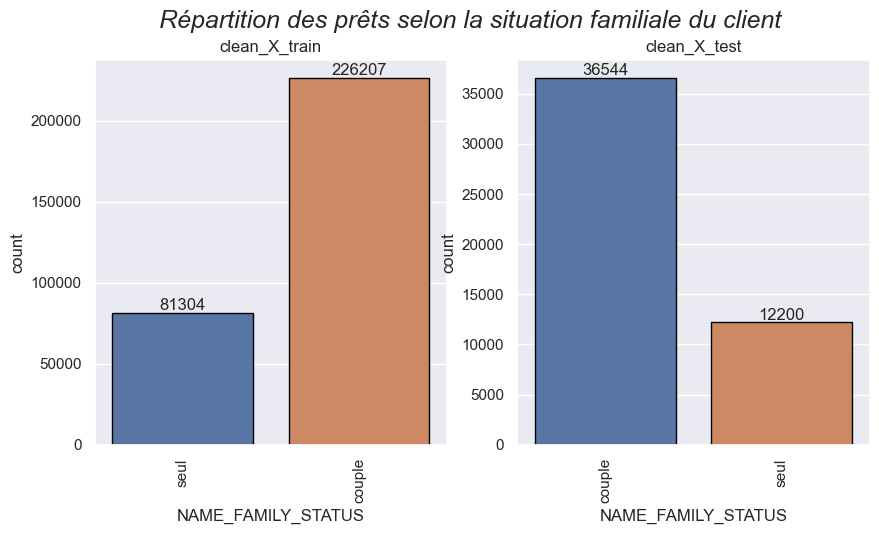

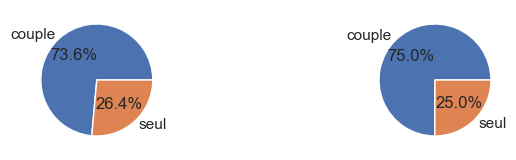

In [87]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Répartition des prêts selon la situation familiale du client", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="NAME_FAMILY_STATUS", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="NAME_FAMILY_STATUS", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['NAME_FAMILY_STATUS'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['NAME_FAMILY_STATUS'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['NAME_FAMILY_STATUS'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['NAME_FAMILY_STATUS'], autopct='%.1f%%')


plt.show()

### Quel est le type de logement du client ?

In [88]:
clean_X_train['NAME_HOUSING_TYPE'].value_counts()

House / apartment      272868
With parents            14840
Municipal apartment     11183
Rented apartment         4881
Office apartment         2617
Co-op apartment          1122
Name: NAME_HOUSING_TYPE, dtype: int64

In [89]:
# Regroupement des modalités

map_name_housing_type = {'House / apartment' : 'maison_ou_appartement',
                         'With parents' : 'autre_logement',
                         'Municipal apartment' : 'autre_logement',
                         'Rented apartment' : 'autre_logement',
                         'Office apartment' : 'autre_logement',
                         'Co-op apartment' : 'autre_logement'}

clean_X_train['NAME_HOUSING_TYPE'] = clean_X_train['NAME_HOUSING_TYPE'].map(map_name_housing_type)
clean_X_test['NAME_HOUSING_TYPE'] = clean_X_test['NAME_HOUSING_TYPE'].map(map_name_housing_type)

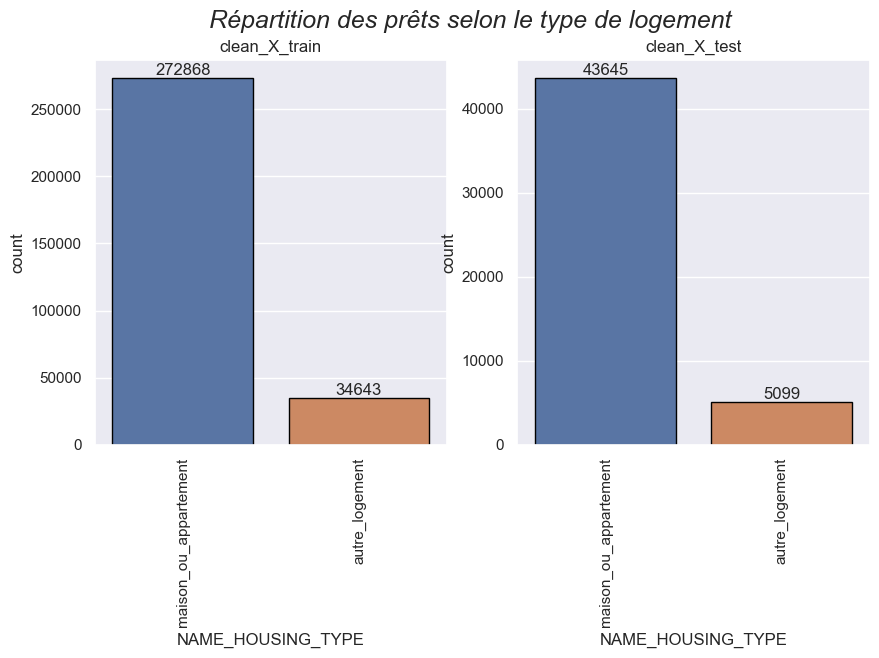

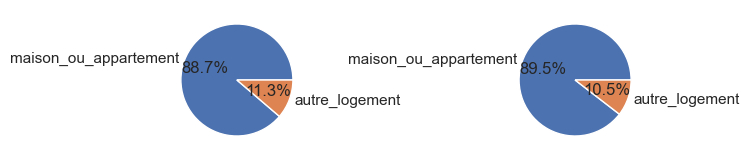

In [90]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Répartition des prêts selon le type de logement", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="NAME_HOUSING_TYPE", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="NAME_HOUSING_TYPE", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['NAME_HOUSING_TYPE'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['NAME_HOUSING_TYPE'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['NAME_HOUSING_TYPE'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['NAME_HOUSING_TYPE'], autopct='%.1f%%')


plt.show()

### Quel jour de la semaine le client a t-il introduit sa demande ?

In [91]:
clean_X_train['WEEKDAY_APPR_PROCESS_START'].value_counts(normalize=True)*100

TUESDAY     17.53
WEDNESDAY   16.89
MONDAY      16.49
THURSDAY    16.45
FRIDAY      16.37
SATURDAY    11.01
SUNDAY       5.26
Name: WEEKDAY_APPR_PROCESS_START, dtype: float64

In [92]:
loan_map = {1 : "Oui",
            0 : "Non"}
crosstab1= pd.crosstab(clean_X_train['TARGET'].map(loan_map), clean_X_train['WEEKDAY_APPR_PROCESS_START'],values=clean_X_train['WEEKDAY_APPR_PROCESS_START'],aggfunc=len,margins=True,margins_name='Total')
crosstab1

WEEKDAY_APPR_PROCESS_START,FRIDAY,MONDAY,SATURDAY,SUNDAY,THURSDAY,TUESDAY,WEDNESDAY,Total
TARGET,,,,,,,,
Non,46237,46780,31182,14898,46493,49400,47696,282686
Oui,4101,3934,2670,1283,4098,4501,4238,24825
Total,50338,50714,33852,16181,50591,53901,51934,307511


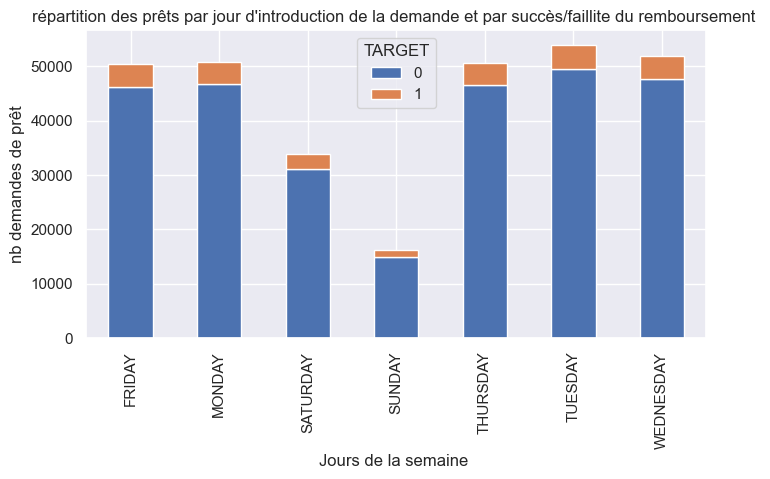

In [93]:
clean_X_train.groupby(['WEEKDAY_APPR_PROCESS_START','TARGET']).count()['SK_ID_CURR'].unstack(level=1).plot(kind='bar',stacked=True)
plt.xlabel("Jours de la semaine ")
plt.ylabel("nb demandes de prêt")
plt.title("répartition des prêts par jour d'introduction de la demande et par succès/faillite du remboursement ")
plt.show()

### Dans quel secteur le client est-il employé ?

In [94]:
#clean_X_train['ORGANIZATION_TYPE'].value_counts(normalize=False) 
clean_X_train['ORGANIZATION_TYPE'].value_counts(normalize=True) *100

Business Entity Type 3   22.11
XNA                      18.01
Self-employed            12.49
Other                     5.43
Medicine                  3.64
Business Entity Type 2    3.43
Government                3.38
School                    2.89
Trade: type 7             2.55
Kindergarten              2.24
Construction              2.19
Business Entity Type 1    1.95
Transport: type 4         1.76
Trade: type 3             1.14
Industry: type 9          1.10
Industry: type 3          1.07
Security                  1.06
Housing                   0.96
Industry: type 11         0.88
Military                  0.86
Bank                      0.82
Agriculture               0.80
Police                    0.76
Transport: type 2         0.72
Postal                    0.70
Security Ministries       0.64
Trade: type 2             0.62
Restaurant                0.59
Services                  0.51
University                0.43
Industry: type 7          0.43
Transport: type 3         0.39
Industry

**Il y a beaucoup de valeurs non définies(18%). Je ne conserve pas cette variable pour la suite.**

In [95]:
clean_X_train.drop(labels='ORGANIZATION_TYPE', axis=1, inplace=True)
clean_X_test.drop(labels='ORGANIZATION_TYPE', axis=1, inplace=True)


In [96]:
y_train = clean_X_train['TARGET']
clean_X_train.drop(labels='TARGET', axis=1, inplace=True)

In [97]:
clean_X_train.shape, clean_X_test.shape

((307511, 63), (48744, 63))

In [98]:
clean_X_train.describe().T

,count,mean,std,min,25%,50%,75%,max
SK_ID_CURR,"307,511.00","278,180.52","102,790.18","100,002.00","189,145.50","278,202.00","367,142.50","456,255.00"
CNT_CHILDREN,"307,511.00",0.42,0.72,0.00,0.00,0.00,1.00,19.00
AMT_INCOME_TOTAL,"307,511.00","168,797.92","237,123.15","25,650.00","112,500.00","147,150.00","202,500.00","117,000,000.00"
AMT_CREDIT,"307,511.00","599,026.00","402,490.78","45,000.00","270,000.00","513,531.00","808,650.00","4,050,000.00"
AMT_ANNUITY,"307,511.00","27,108.46","14,493.57","1,615.50","16,524.00","24,903.00","34,596.00","258,025.50"
AMT_GOODS_PRICE,"307,511.00","538,160.07","369,405.44","40,500.00","238,500.00","450,000.00","679,500.00","4,050,000.00"
REGION_POPULATION_RELATIVE,"307,511.00",0.02,0.01,0.00,0.01,0.02,0.03,0.07
DAYS_BIRTH,"307,511.00","-16,037.00","4,363.99","-25,229.00","-19,682.00","-15,750.00","-12,413.00","-7,489.00"
DAYS_EMPLOYED,"307,511.00","63,815.05","141,275.77","-17,912.00","-2,760.00","-1,213.00",-289.00,"365,243.00"
DAYS_REGISTRATION,"307,511.00","-4,986.12","3,522.89","-24,672.00","-7,479.50","-4,504.00","-2,010.00",0.00


### Combien d'enfants a le client ?

In [99]:
clean_X_train['CNT_CHILDREN'].value_counts()

0     215371
1      61119
2      26749
3       3717
4        429
5         84
6         21
7          7
14         3
8          2
9          2
12         2
10         2
19         2
11         1
Name: CNT_CHILDREN, dtype: int64

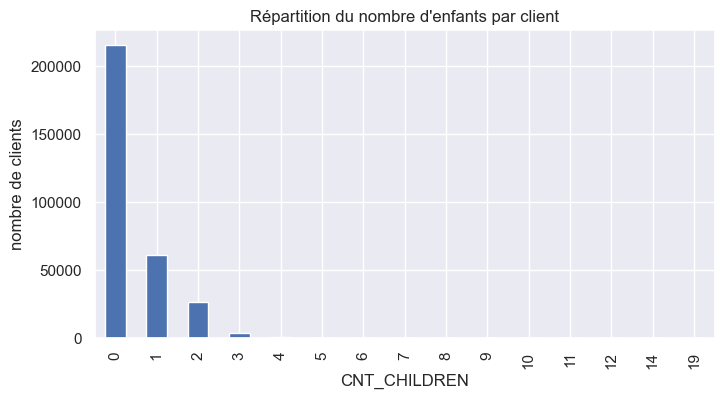

In [100]:
# Histogramme et Densité de probabilité deCNT_CHILDREN
nb_child=clean_X_train['CNT_CHILDREN'].groupby(clean_X_train['CNT_CHILDREN']).count()
plt.xlabel("Nombre d'enfants")
plt.ylabel("nombre de clients")
plt.title("Répartition du nombre d'enfants par client")
nb_child.plot(kind='bar')

plt.show()

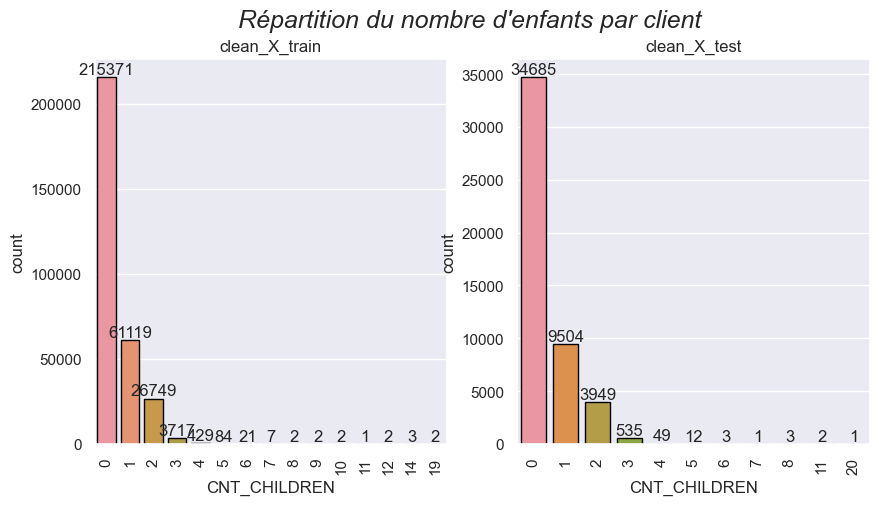

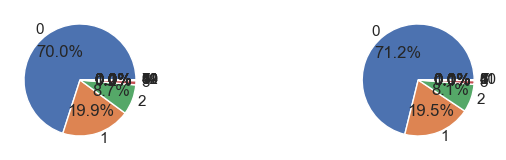

In [101]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Répartition du nombre d'enfants par client", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="CNT_CHILDREN", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="CNT_CHILDREN", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['CNT_CHILDREN'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['CNT_CHILDREN'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['CNT_CHILDREN'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['CNT_CHILDREN'], autopct='%.1f%%')


plt.show()

In [102]:
# On peut transformer 'CNT_CHILDREN' en variable qualitative de l'ensemble d'entraînement et de test

clean_X_train['nb_enfants'] = clean_X_train['CNT_CHILDREN'] 
clean_X_test['nb_enfants'] = clean_X_test['CNT_CHILDREN'] 

clean_X_train['nb_enfants'] = np.where(clean_X_train['CNT_CHILDREN'] == 0, 'sans_enfant', clean_X_train['nb_enfants'])
clean_X_test['nb_enfants'] = np.where(clean_X_test['CNT_CHILDREN'] == 0, 'sans_enfant', clean_X_test['nb_enfants'])

clean_X_train['nb_enfants'] = np.where(clean_X_train['CNT_CHILDREN'] == 1, 'un_enfant', clean_X_train['nb_enfants'])
clean_X_test['nb_enfants'] = np.where(clean_X_test['CNT_CHILDREN'] == 1, 'un_enfant', clean_X_test['nb_enfants'])

clean_X_train['nb_enfants'] = np.where(clean_X_train['CNT_CHILDREN'] == 2, 'deux_enfants', clean_X_train['nb_enfants'])
clean_X_test['nb_enfants'] = np.where(clean_X_test['CNT_CHILDREN'] == 2, 'deux_enfants', clean_X_test['nb_enfants'])

clean_X_train['nb_enfants'] = np.where(clean_X_train['CNT_CHILDREN'] >= 3, 'trois_enfants_et_plus', clean_X_train['nb_enfants'])  
clean_X_test['nb_enfants'] = np.where(clean_X_test['CNT_CHILDREN'] >= 3, 'trois_enfants_et_plus', clean_X_test['nb_enfants'])  

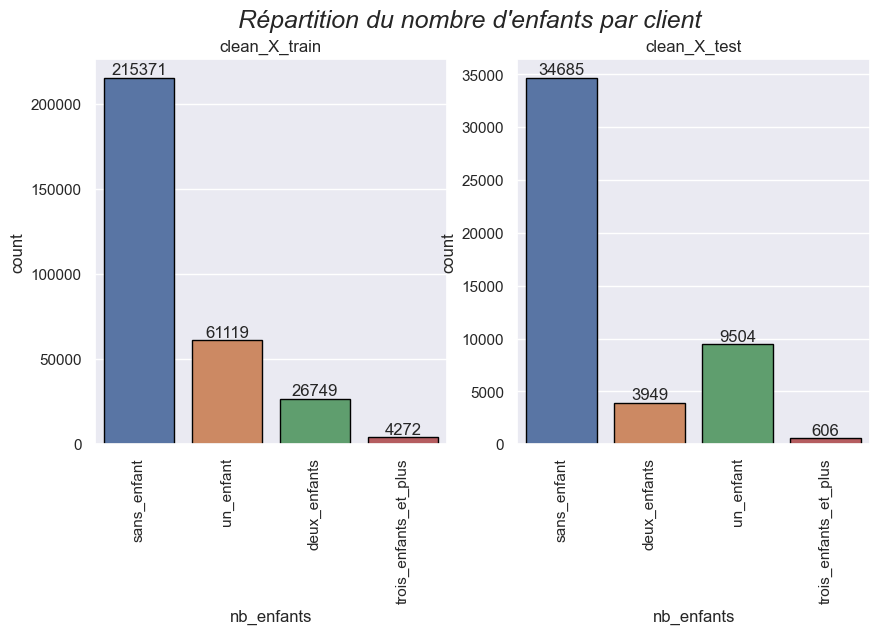

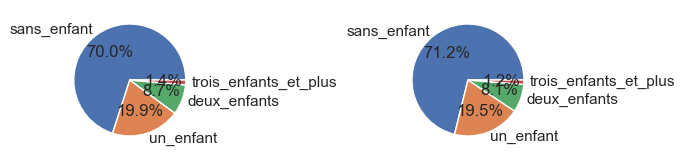

In [103]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Répartition du nombre d'enfants par client", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="nb_enfants", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="nb_enfants", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['nb_enfants'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['nb_enfants'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['nb_enfants'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['nb_enfants'], autopct='%.1f%%')


plt.show()

In [104]:
clean_X_train.drop(labels='CNT_CHILDREN', 
                   axis=1, inplace=True)

clean_X_test.drop(labels='CNT_CHILDREN', 
                  axis=1, inplace=True)



### Revenu du client , montant de l'emprunt , annuité et pour les prêts à la consommation,valeurs des biens pour lesquels le prêt a été demandé

In [105]:
liste_amt = ['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'EXT_SOURCE_2']

In [106]:
clean_X_train[liste_amt].describe()

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,EXT_SOURCE_2
count,"307,511.00","307,511.00","307,511.00","307,511.00","307,511.00"
mean,"168,797.92","599,026.00","27,108.46","538,160.07",0.51
std,"237,123.15","402,490.78","14,493.57","369,405.44",0.19
min,"25,650.00","45,000.00","1,615.50","40,500.00",0.00
25%,"112,500.00","270,000.00","16,524.00","238,500.00",0.39
50%,"147,150.00","513,531.00","24,903.00","450,000.00",0.57
75%,"202,500.00","808,650.00","34,596.00","679,500.00",0.66
max,"117,000,000.00","4,050,000.00","258,025.50","4,050,000.00",0.85


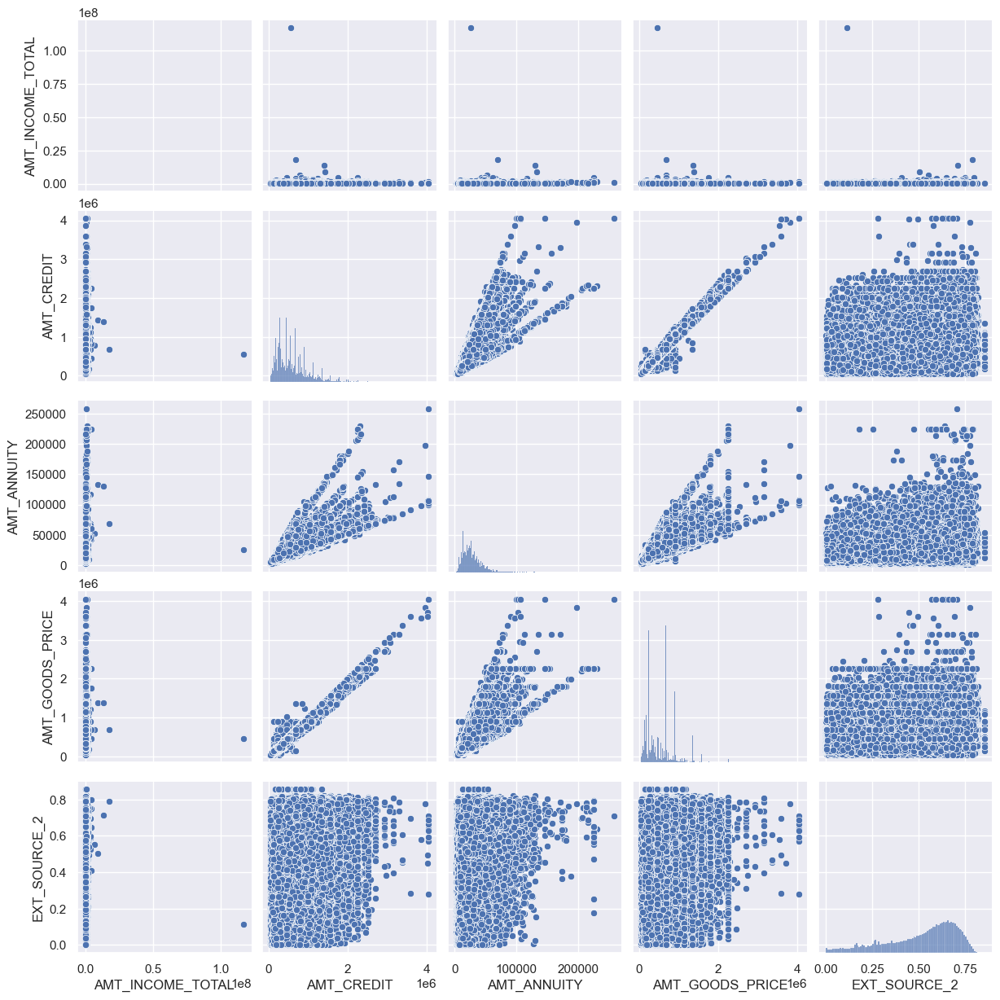

In [107]:
sns.pairplot(clean_X_train[liste_amt])

On constate la présence d' outliers et d'une corrélation assez importante entre différentes variables. Regardons dans un 1er temps si il y a des variables qui suivent une loi gaussienne.

In [108]:
# Calcul des degrés d'asymétrie : Test Skewness

clean_X_train[liste_amt].skew().sort_values()

EXT_SOURCE_2        -0.79
AMT_CREDIT           1.23
AMT_GOODS_PRICE      1.35
AMT_ANNUITY          1.58
AMT_INCOME_TOTAL   391.56
dtype: float64

In [109]:
# Calcul des degrés d'aplatissement : Test Kurtosis

clean_X_train[liste_amt].kurt().sort_values()


EXT_SOURCE_2            -0.27
AMT_CREDIT               1.93
AMT_GOODS_PRICE          2.43
AMT_ANNUITY              7.71
AMT_INCOME_TOTAL   191,786.55
dtype: float64

Aucune des variables a un degré d'asymétrie proche de 0 et aucune des variables a un degré d'aplatissement proche de 3. Elles ne suivent donc pas une loi normale. Vérifions-le statistiquement grâce au test de Jarque-Bera.

Le test de Jarque-Bera permet de tester si l'échantillon a l'asymétrie et l'aplatissement correspondant à une distribution normale, c'est-à-dire asymétrie = 0 et aplatissement = 3.

La statistique de test est toujours non négative, et si elle est loin de zéro, elle montre que les données n'ont pas une distribution normale. Ce test ne fonctionne que pour plus de 2000 échantillons de données.

H0 = L'échantillon provient d'une distribution normale.  
H1 = L'échantillon ne provient pas d'une distribution normale.

Si la valeur P est inférieure à 0,05, nous rejetons l'hypothèse nulle. Nous avons suffisamment de preuves pour dire que les données de l'échantillon ne proviennent pas d'une distribution normale.

In [110]:
# Jarque-Bera test

from scipy import stats

alpha = 0.05

for i in liste_amt:
    print ([i])
    a,b = stats.jarque_bera(clean_X_train[[i]])
    print ("Statistics : ", a, "; p-value : ", b)
    if b < alpha:  
        print("On rejette H0 : la normalité de la distribution est rejetée\n")
    else:
        print("On accepte H0 : la normalité de la distribution est acceptée\n")

['AMT_INCOME_TOTAL']
Statistics :  471279821765169.1 ; p-value :  0.0
On rejette H0 : la normalité de la distribution est rejetée

['AMT_CREDIT']
Statistics :  126066.32414248875 ; p-value :  0.0
On rejette H0 : la normalité de la distribution est rejetée

['AMT_ANNUITY']
Statistics :  889034.377584555 ; p-value :  0.0
On rejette H0 : la normalité de la distribution est rejetée

['AMT_GOODS_PRICE']
Statistics :  169251.4214941434 ; p-value :  0.0
On rejette H0 : la normalité de la distribution est rejetée

['EXT_SOURCE_2']
Statistics :  33181.00843075111 ; p-value :  0.0
On rejette H0 : la normalité de la distribution est rejetée



Les statistiques de test de toutes les variables sont éloignées de zéro et que les valeurs de p sont de 0.La distribution des variables ne suit pas une loi normale
Nous allons utiliser Spearman(méthode de calcul des corrélations non paramétriques)

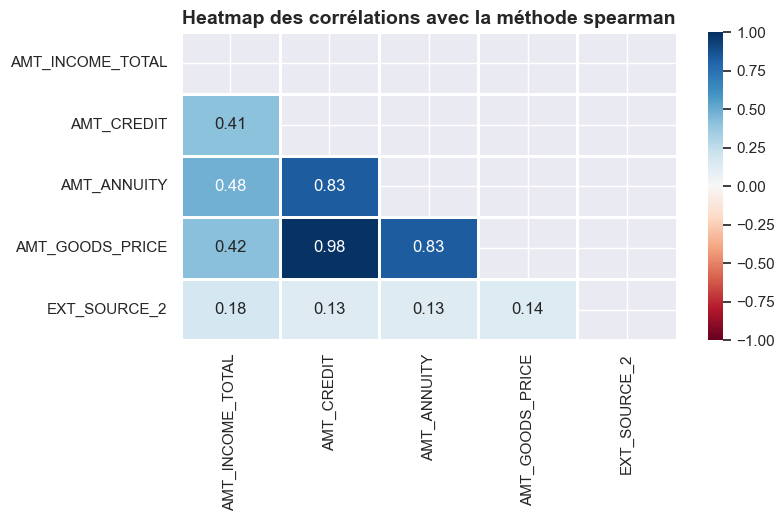

In [111]:
correlation_matrice(clean_X_train[liste_amt],"spearman")

Très forte corrélation entre AMT_GOODS_PRICE et AMT_CREDIT.Je supprime 'AMT_GOODS_PRICE'(99%).

In [112]:
clean_X_train.drop(labels='AMT_GOODS_PRICE', 
                   axis=1, inplace=True)

clean_X_test.drop(labels='AMT_GOODS_PRICE', 
                  axis=1, inplace=True)


Nous allons donc discrétiser ces variables en créant des groupes.

### Quel est le taux d'endettement du client ?

In [113]:
clean_X_train['taux_endettement'] = clean_X_train['AMT_ANNUITY'] / clean_X_train['AMT_INCOME_TOTAL'] * 100
clean_X_test['taux_endettement'] = clean_X_test['AMT_ANNUITY'] / clean_X_test['AMT_INCOME_TOTAL'] * 100
clean_X_train['taux_endettement'].describe()

count   307,511.00
mean         18.09
std           9.46
min           0.02
25%          11.48
50%          16.28
75%          22.91
max         187.60
Name: taux_endettement, dtype: float64

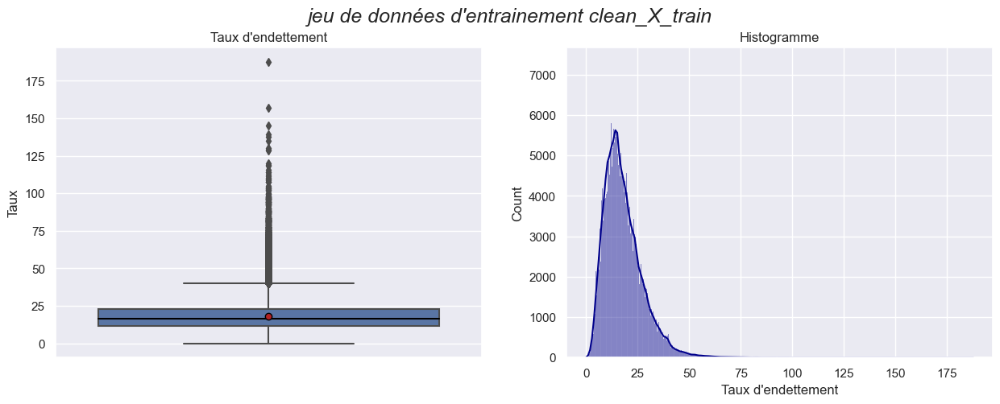

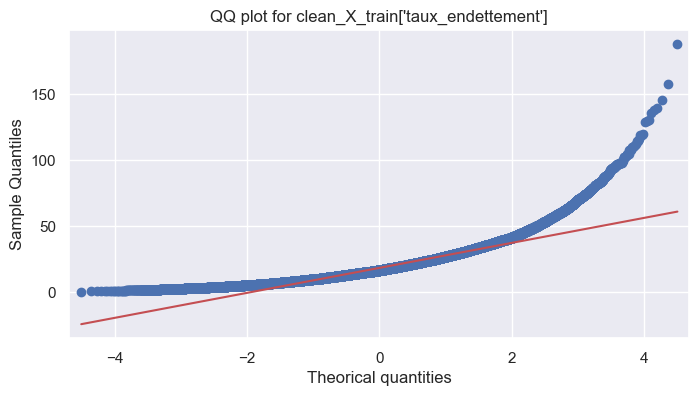

In [114]:
plt.figure(figsize = (15,5))
plt.suptitle("jeu de données d'entrainement clean_X_train", fontsize=18, fontstyle='italic')
plt.subplot(1,2,1)
# Propriétés graphiques     
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot( y=clean_X_train['taux_endettement'], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
plt.title("Taux d'endettement" )
plt.ylabel('Taux')

plt.subplot(1,2,2)
sns.histplot(clean_X_train['taux_endettement'], kde = True, color='Darkblue',discrete=False)
plt.title("Histogramme")
plt.xlabel("Taux d'endettement")
plt.show()

sm.qqplot(clean_X_train['taux_endettement'], line='s')
plt.title("QQ plot for clean_X_train['taux_endettement']")
plt.xlabel('Theorical quantities')


plt.show()

In [115]:
pd.qcut(round(clean_X_train.taux_endettement, 0), q=5 ).head()

0      (10.0, 14.0]
1      (10.0, 14.0]
2    (-0.001, 10.0]
3      (19.0, 25.0]
4      (14.0, 19.0]
Name: taux_endettement, dtype: category
Categories (5, interval[float64, right]): [(-0.001, 10.0] < (10.0, 14.0] < (14.0, 19.0] < (19.0, 25.0] < (25.0, 188.0]]

In [116]:
pd.qcut(round(clean_X_test.taux_endettement, 0), q=5 ).head()

0     (11.0, 15.0]
1     (15.0, 19.0]
2    (25.0, 202.0]
3     (15.0, 19.0]
4     (15.0, 19.0]
Name: taux_endettement, dtype: category
Categories (5, interval[float64, right]): [(0.999, 11.0] < (11.0, 15.0] < (15.0, 19.0] < (19.0, 25.0] < (25.0, 202.0]]

On doit garder les mêmes classes . On va imposer les classes à clean_X_test

In [117]:
clean_X_train['taux_endettement'] = pd.qcut(clean_X_train.taux_endettement,
                                      q=5,
                                      labels=['10%_et_moins',
                                              '11_à_14%',
                                              '15_à_19%',
                                              '20_à_25%',
                                              '26%_et_plus'])

clean_X_test['taux_endettement'] =  pd.cut(round(clean_X_test.taux_endettement, 0),
                                          bins=[-1,
                                                10,
                                                14,
                                                19,
                                                25,
                                                300],
                                          include_lowest=True,
                                          labels=['10%_et_moins',
                                              '11_à_14%',
                                              '15_à_19%',
                                              '20_à_25%',
                                              '26%_et_plus'])

clean_X_test['taux_endettement'].value_counts()

15_à_19%        11293
10%_et_moins     9640
11_à_14%         9605
26%_et_plus      9134
20_à_25%         9072
Name: taux_endettement, dtype: int64

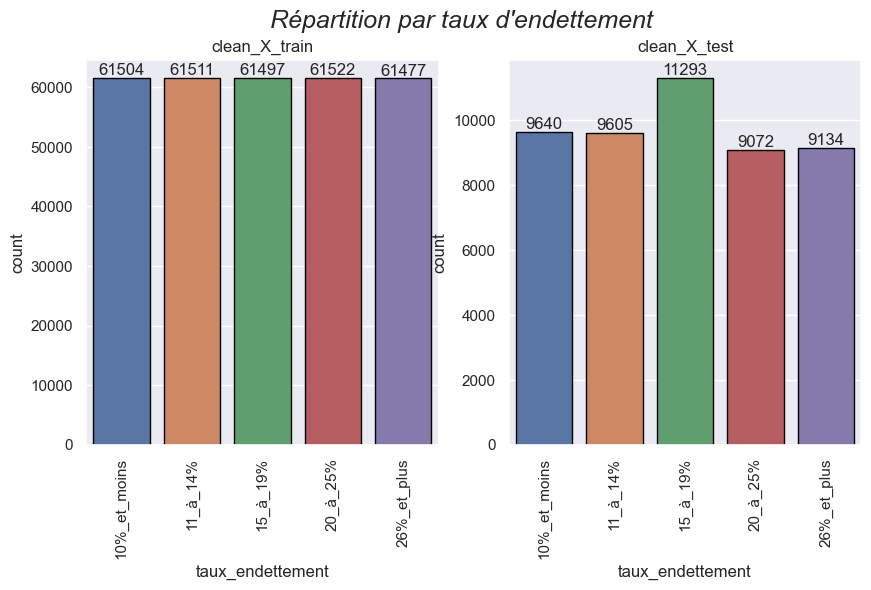

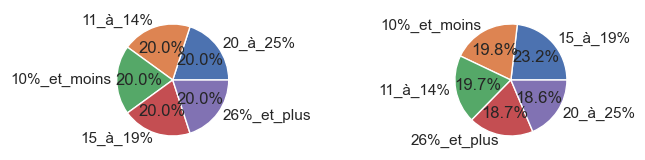

In [118]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Répartition par taux d'endettement", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="taux_endettement", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="taux_endettement", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['taux_endettement'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['taux_endettement'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['taux_endettement'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['taux_endettement'], autopct='%.1f%%')


plt.show()

### Combien de mensualités pour rembourser le crédit?

In [119]:
clean_X_train['nb_mensualites'] =  round(clean_X_train['AMT_CREDIT'] / clean_X_train['AMT_ANNUITY'], 0)
clean_X_test['nb_mensualites'] =  round(clean_X_test['AMT_CREDIT'] / clean_X_test['AMT_ANNUITY'], 0)
clean_X_train['nb_mensualites'].describe()

count   307,511.00
mean         21.62
std           7.83
min           8.00
25%          16.00
50%          20.00
75%          27.00
max          45.00
Name: nb_mensualites, dtype: float64

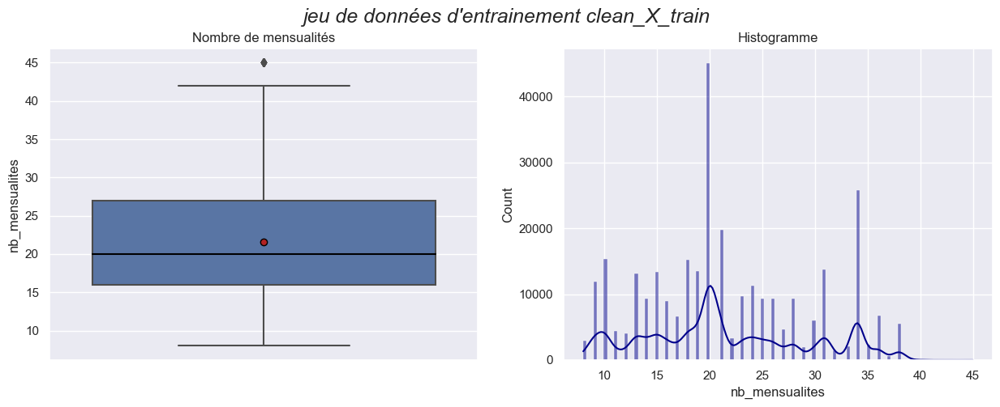

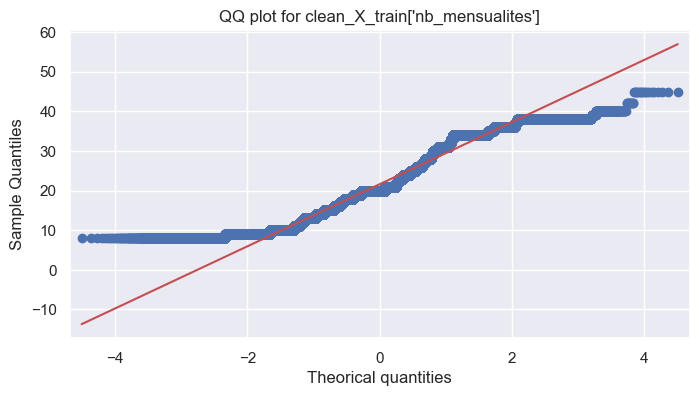

In [120]:
plt.figure(figsize = (15,5))
plt.suptitle("jeu de données d'entrainement clean_X_train", fontsize=18, fontstyle='italic')
plt.subplot(1,2,1)
# Propriétés graphiques     
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot( y=clean_X_train['nb_mensualites'], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
plt.title("Nombre de mensualités" )
plt.ylabel('nb_mensualites')

plt.subplot(1,2,2)
sns.histplot(clean_X_train['nb_mensualites'], kde = True, color='Darkblue',discrete=False)
plt.title("Histogramme")
plt.xlabel("nb_mensualites")
plt.show()

sm.qqplot(clean_X_train['nb_mensualites'], line='s')
plt.title("QQ plot for clean_X_train['nb_mensualites']")
plt.xlabel('Theorical quantities')

plt.show()

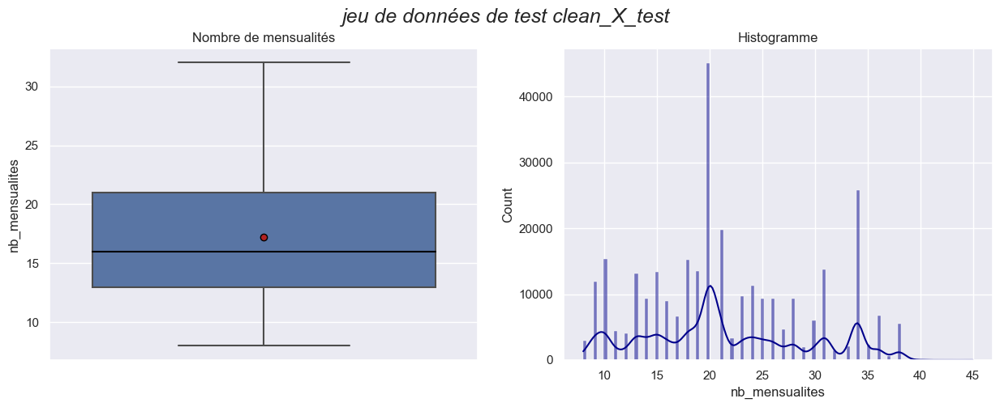

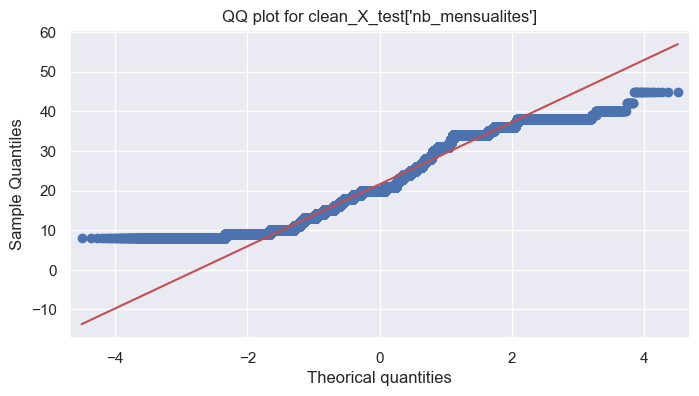

In [121]:
plt.figure(figsize = (15,5))
plt.suptitle("jeu de données de test clean_X_test", fontsize=18, fontstyle='italic')
plt.subplot(1,2,1)
# Propriétés graphiques     
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot( y=clean_X_test['nb_mensualites'], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
plt.title("Nombre de mensualités" )
plt.ylabel('nb_mensualites')

plt.subplot(1,2,2)
sns.histplot(clean_X_train['nb_mensualites'], kde = True, color='Darkblue',discrete=False)
plt.title("Histogramme")
plt.xlabel("nb_mensualites")
plt.show()
clean_X_test
sm.qqplot(clean_X_train['nb_mensualites'], line='s')
plt.title("QQ plot for clean_X_test['nb_mensualites']")
plt.xlabel('Theorical quantities')

plt.show()

In [122]:
pd.qcut(clean_X_train.nb_mensualites, q=3).head()

0    (7.999, 18.0]
1     (24.0, 45.0]
2     (18.0, 24.0]
3    (7.999, 18.0]
4     (18.0, 24.0]
Name: nb_mensualites, dtype: category
Categories (3, interval[float64, right]): [(7.999, 18.0] < (18.0, 24.0] < (24.0, 45.0]]

In [123]:
clean_X_train['nb_mensualites'] = pd.qcut(clean_X_train.nb_mensualites,
                                               q=3,
                                               labels=['18_mois_et_moins',
                                                       '19_à_24_mois',
                                                       '25_mois_et_plus'])

clean_X_train['nb_mensualites'].value_counts()

18_mois_et_moins    105473
19_à_24_mois        102694
25_mois_et_plus      99344
Name: nb_mensualites, dtype: int64

In [124]:
pd.qcut(clean_X_test.nb_mensualites, q=3).head()

0     (20.0, 32.0]
1    (7.999, 13.0]
2    (7.999, 13.0]
3     (20.0, 32.0]
4     (13.0, 20.0]
Name: nb_mensualites, dtype: category
Categories (3, interval[float64, right]): [(7.999, 13.0] < (13.0, 20.0] < (20.0, 32.0]]

On doit imposer les mêmes catégories

In [125]:
clean_X_test['nb_mensualites'] = pd.cut(clean_X_test.nb_mensualites,
                                             bins=[-1,
                                                   18,
                                                   24,
                                                   100],
                                             include_lowest=True,
                                             labels=['18_mois_et_moins',
                                                     '19_à_24_mois',
                                                     '25_mois_et_plus'])


clean_X_test['nb_mensualites'].value_counts()

18_mois_et_moins    29008
19_à_24_mois        13787
25_mois_et_plus      5949
Name: nb_mensualites, dtype: int64

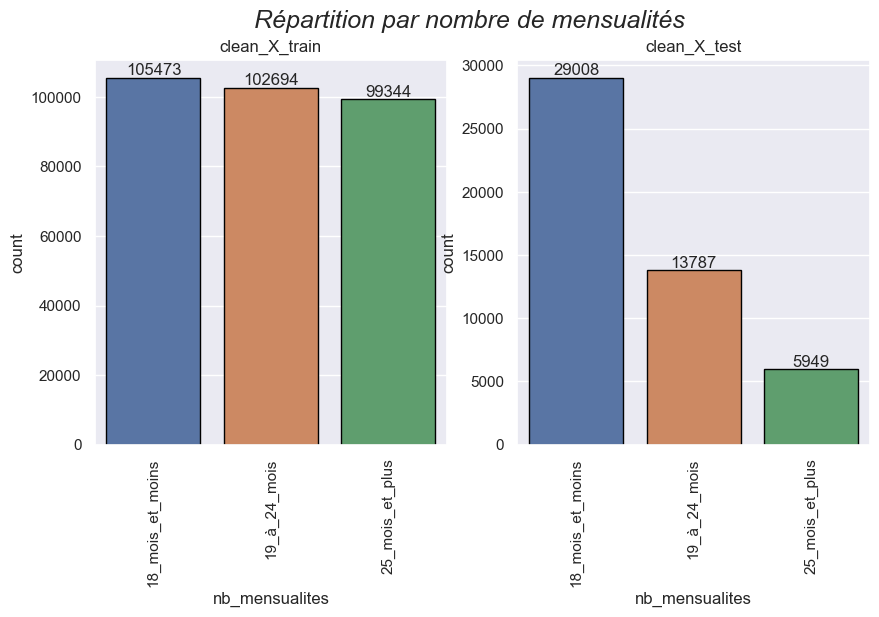

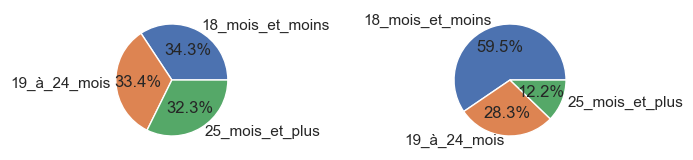

In [126]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Répartition par nombre de mensualités", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="nb_mensualites", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="nb_mensualites", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['nb_mensualites'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['nb_mensualites'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['nb_mensualites'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['nb_mensualites'], autopct='%.1f%%')


plt.show()

In [127]:
clean_X_train.drop(labels='AMT_ANNUITY', 
                   axis=1, inplace=True)

clean_X_test.drop(labels='AMT_ANNUITY', 
                  axis=1, inplace=True)

clean_X_train.shape, clean_X_test.shape

((307511, 63), (48744, 63))

### Quels sont les montants des revenus mensuels des clients ?

In [128]:
clean_X_train['AMT_INCOME_TOTAL'].describe()

count       307,511.00
mean        168,797.92
std         237,123.15
min          25,650.00
25%         112,500.00
50%         147,150.00
75%         202,500.00
max     117,000,000.00
Name: AMT_INCOME_TOTAL, dtype: float64

In [129]:
pd.qcut(clean_X_train.AMT_INCOME_TOTAL, q=5).head(5)

0       (162000.0, 225000.0]
1    (225000.0, 117000000.0]
2       (25649.999, 99000.0]
3        (99000.0, 135000.0]
4        (99000.0, 135000.0]
Name: AMT_INCOME_TOTAL, dtype: category
Categories (5, interval[float64, right]): [(25649.999, 99000.0] < (99000.0, 135000.0] < (135000.0, 162000.0] < (162000.0, 225000.0] < (225000.0, 117000000.0]]

In [130]:
clean_X_train['total_revenus'] = pd.qcut(clean_X_train.AMT_INCOME_TOTAL,
                                         q=5,
                                         labels=['99000_et_moins',
                                                 '99001_à_135000',
                                                 '135001_à_162000',
                                                 '162001_à_225000',
                                                 '225001_et_plus'])

# Application à l'ensemble de test

clean_X_test['total_revenus'] = pd.cut(clean_X_test.AMT_INCOME_TOTAL,
                                       bins=[1,
                                             99000,
                                             135000,
                                             162000,
                                             225000,
                                             200000000],
                                       include_lowest=True,
                                       labels=['99000_et_moins',
                                               '99001_à_135000',
                                               '135001_à_162000',
                                               '162001_à_225000',
                                               '225001_et_plus'])
# Application à l'ensemble de test
clean_X_test['total_revenus'].value_counts()


clean_X_train['total_revenus'].value_counts()

99001_à_135000     85756
162001_à_225000    75513
99000_et_moins     63671
225001_et_plus     47118
135001_à_162000    35453
Name: total_revenus, dtype: int64

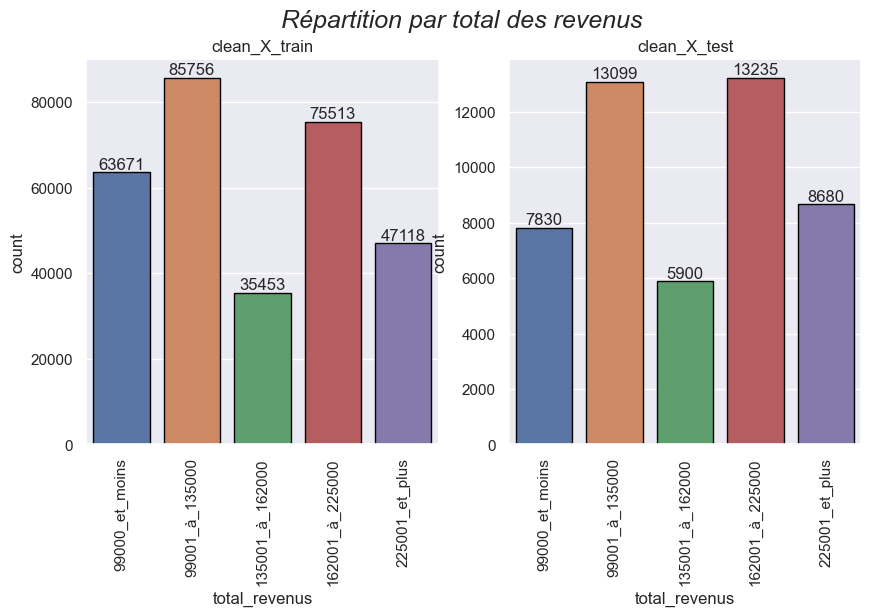

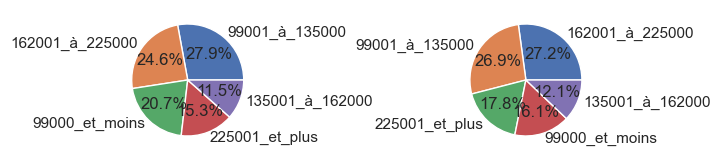

In [131]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Répartition par total des revenus", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="total_revenus", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="total_revenus", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['total_revenus'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['total_revenus'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['total_revenus'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['total_revenus'], autopct='%.1f%%')


plt.show()

In [132]:
# Suppression de la variable AMT_INCOME_TOTAL dans X_Train et X_Test

clean_X_train.drop(labels='AMT_INCOME_TOTAL', 
                   axis=1, inplace=True)

clean_X_test.drop(labels='AMT_INCOME_TOTAL', 
                   axis=1, inplace=True)

clean_X_train.shape, clean_X_test.shape

((307511, 63), (48744, 63))

### Quel sont les montants  des crédits demandés par les clients?

In [133]:
clean_X_train['AMT_CREDIT'].describe()

count     307,511.00
mean      599,026.00
std       402,490.78
min        45,000.00
25%       270,000.00
50%       513,531.00
75%       808,650.00
max     4,050,000.00
Name: AMT_CREDIT, dtype: float64

In [134]:
pd.qcut(clean_X_train.AMT_CREDIT, q=6).head(5)

0     (337500.0, 513531.0]
1    (983160.0, 4050000.0]
2    (44999.999, 229500.0]
3     (229500.0, 337500.0]
4     (337500.0, 513531.0]
Name: AMT_CREDIT, dtype: category
Categories (6, interval[float64, right]): [(44999.999, 229500.0] < (229500.0, 337500.0] < (337500.0, 513531.0] < (513531.0, 679500.0] < (679500.0, 983160.0] < (983160.0, 4050000.0]]

In [135]:
clean_X_train['montant_credit'] = pd.qcut(clean_X_train.AMT_CREDIT,
                                          q=6,
                                          labels=['229500_et_moins',
                                                  '229501_à_337500',
                                                  '337501__513531',
                                                  '513532_à_679500',
                                                  '679501_à_983160',
                                                  '983161_et_plus'])

# Application à l'ensemble de test

clean_X_test['montant_credit'] = pd.cut(clean_X_test.AMT_CREDIT,
                                        bins=[1,
                                              229500,
                                              337500,
                                              513531,
                                              679500,
                                              983160,
                                              5000000],
                                        include_lowest=True,
                                        labels=['229500_et_moins',
                                                '229501_à_337500',
                                                '337501__513531',
                                                '513532_à_679500',
                                                '679501_à_983160',
                                                '983161_et_plus'])




clean_X_train['montant_credit'].value_counts()

229501_à_337500    52096
513532_à_679500    52068
229500_et_moins    51649
983161_et_plus     51241
679501_à_983160    50353
337501__513531     50104
Name: montant_credit, dtype: int64

In [136]:
clean_X_test['montant_credit'].value_counts()

337501__513531     10681
229500_et_moins    10118
229501_à_337500     8753
513532_à_679500     8194
679501_à_983160     6307
983161_et_plus      4691
Name: montant_credit, dtype: int64

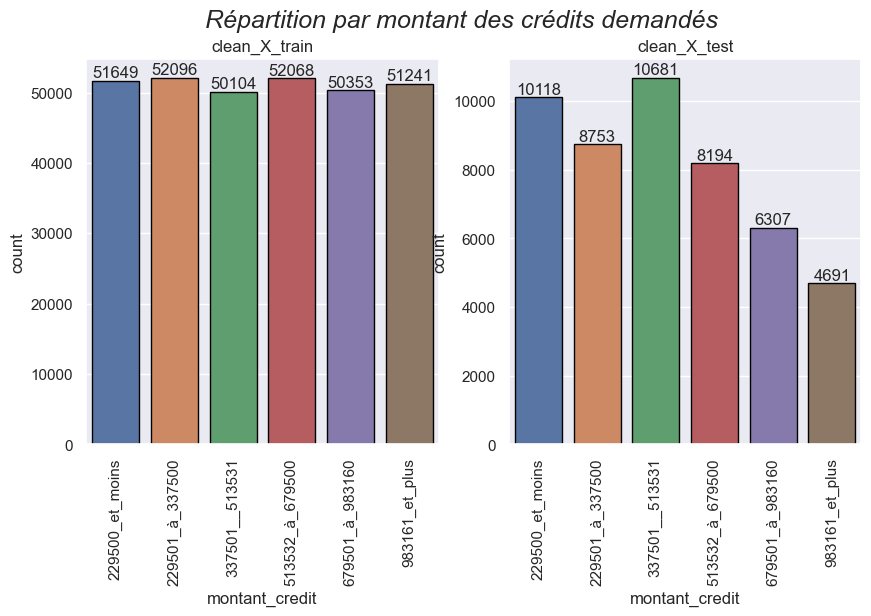

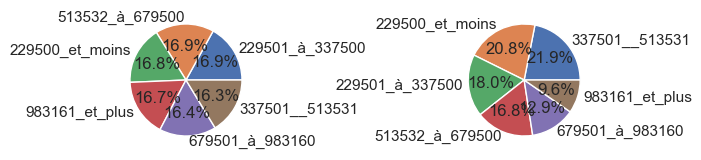

In [137]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Répartition par montant des crédits demandés", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="montant_credit", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="montant_credit", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['montant_credit'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['montant_credit'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['montant_credit'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['montant_credit'], autopct='%.1f%%')


plt.show()

In [138]:
# Suppression de la variable AMT_CREDIT dans X_Train et X_Test

clean_X_train.drop(labels='AMT_CREDIT', 
                   axis=1, inplace=True)

clean_X_test.drop(labels='AMT_CREDIT', 
                   axis=1, inplace=True)



### Quels sont les valeurs de score normalisé à partir d'une source de données externe

In [139]:
clean_X_train['EXT_SOURCE_2'].describe()

count   307,511.00
mean          0.51
std           0.19
min           0.00
25%           0.39
50%           0.57
75%           0.66
max           0.85
Name: EXT_SOURCE_2, dtype: float64

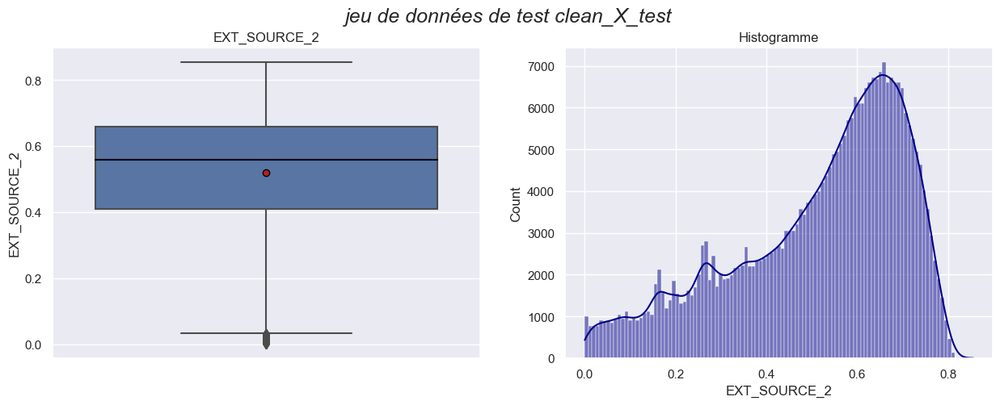

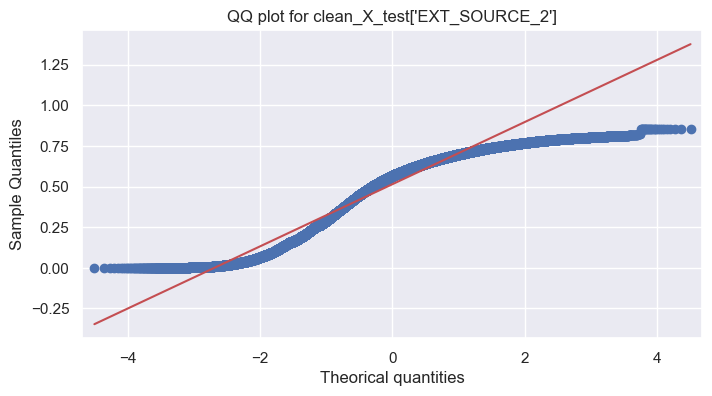

In [140]:
plt.figure(figsize = (15,5))
plt.suptitle("jeu de données de test clean_X_test", fontsize=18, fontstyle='italic')
plt.subplot(1,2,1)
# Propriétés graphiques     
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot( y=clean_X_test['EXT_SOURCE_2'], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
plt.title("EXT_SOURCE_2" )
plt.ylabel('EXT_SOURCE_2')

plt.subplot(1,2,2)
sns.histplot(clean_X_train['EXT_SOURCE_2'], kde = True, color='Darkblue',discrete=False)
plt.title("Histogramme")
plt.xlabel("EXT_SOURCE_2")
plt.show()
clean_X_test
sm.qqplot(clean_X_train['EXT_SOURCE_2'], line='s')
plt.title("QQ plot for clean_X_test['EXT_SOURCE_2']")
plt.xlabel('Theorical quantities')

plt.show()

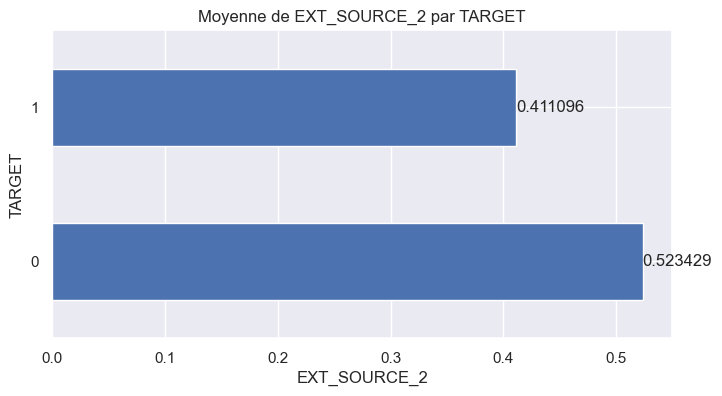

In [141]:
clean_X_train['TARGET'] = y_train
ax=clean_X_train.groupby('TARGET').agg({'EXT_SOURCE_2':['mean']}).plot(kind='barh',legend=False)
ax.bar_label(ax.containers[0])
plt.ylabel('TARGET')
plt.xlabel('EXT_SOURCE_2')

plt.title('Moyenne de EXT_SOURCE_2 par TARGET')
plt.show()

distribution non normale , pas d'outliers/valeurs aberrantes,je conserve cette variable pour l'instant.

### Population normalisée de la région où vit le client (un nombre plus élevé signifie que le client vit dans une région plus peuplée)

In [142]:
clean_X_train['REGION_POPULATION_RELATIVE'].describe()

count   307,511.00
mean          0.02
std           0.01
min           0.00
25%           0.01
50%           0.02
75%           0.03
max           0.07
Name: REGION_POPULATION_RELATIVE, dtype: float64

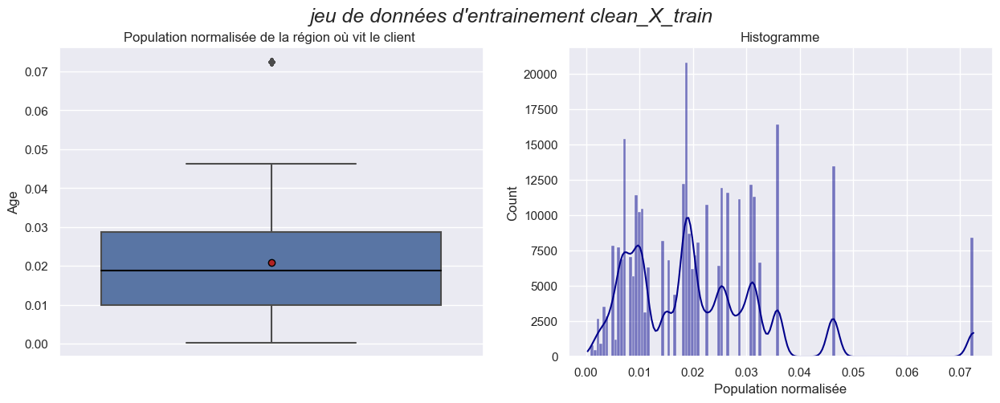

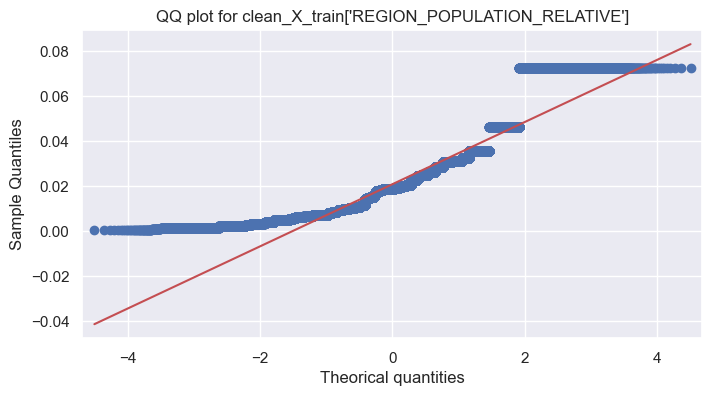

In [143]:
plt.figure(figsize = (15,5))
plt.suptitle("jeu de données d'entrainement clean_X_train", fontsize=18, fontstyle='italic')
plt.subplot(1,2,1)
# Propriétés graphiques     
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot( y=clean_X_train['REGION_POPULATION_RELATIVE'], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
plt.title('Population normalisée de la région où vit le client ')
plt.ylabel('Age')

plt.subplot(1,2,2)
sns.histplot(clean_X_train['REGION_POPULATION_RELATIVE'], kde = True, color='Darkblue',discrete=False)
plt.title("Histogramme")
plt.xlabel('Population normalisée')
plt.show()

sm.qqplot(clean_X_train['REGION_POPULATION_RELATIVE'], line='s')
plt.title("QQ plot for clean_X_train['REGION_POPULATION_RELATIVE']")
plt.xlabel('Theorical quantities')


plt.show()

In [144]:
pd.qcut(clean_X_train.REGION_POPULATION_RELATIVE, q=7).head()

0       (0.0182, 0.0202]
1    (-0.00071, 0.00727]
2      (0.00727, 0.0105]
3      (0.00727, 0.0105]
4       (0.0264, 0.0326]
Name: REGION_POPULATION_RELATIVE, dtype: category
Categories (7, interval[float64, right]): [(-0.00071, 0.00727] < (0.00727, 0.0105] < (0.0105, 0.0182] < (0.0182, 0.0202] < (0.0202, 0.0264] < (0.0264, 0.0326] < (0.0326, 0.0725]]

In [145]:
clean_X_train['population_region'] = pd.qcut(clean_X_train.REGION_POPULATION_RELATIVE,
                                      q=5,
                                      labels=['densité_très_faible',
                                              'densité_faible',
                                              'densité_moyenne',
                                              'densité_forte',
                                              'densité_très_forte'])
clean_X_test['population_region'] = pd.qcut(clean_X_test.REGION_POPULATION_RELATIVE,
                                      q=5,
                                      labels=['densité_très_faible',
                                              'densité_faible',
                                              'densité_moyenne',
                                              'densité_forte',
                                              'densité_très_forte'])
clean_X_train['population_region'].value_counts()

densité_forte          64025
densité_très_faible    63155
densité_moyenne        63143
densité_faible         60969
densité_très_forte     56219
Name: population_region, dtype: int64

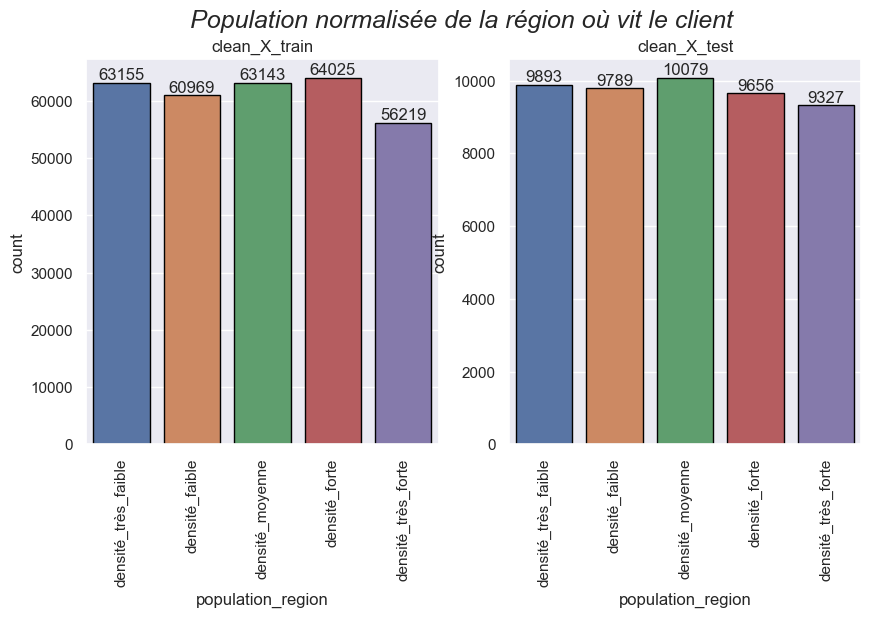

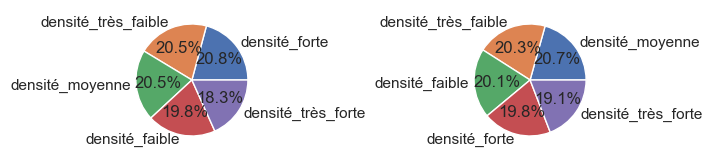

In [146]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Population normalisée de la région où vit le client", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="population_region", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="population_region", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['population_region'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['population_region'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['population_region'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['population_region'], autopct='%.1f%%')


plt.show()

In [147]:
clean_X_train.drop(labels='REGION_POPULATION_RELATIVE', 
                   axis=1, inplace=True)

clean_X_test.drop(labels='REGION_POPULATION_RELATIVE', 
                  axis=1, inplace=True)

clean_X_train.shape, clean_X_test.shape

((307511, 64), (48744, 63))

### A quel âge le client a introduit sa demande de prêt ?

In [148]:
# Calculé en jours depuis le jour de la demande  
clean_X_train['DAYS_BIRTH'].describe()

count   307,511.00
mean    -16,037.00
std       4,363.99
min     -25,229.00
25%     -19,682.00
50%     -15,750.00
75%     -12,413.00
max      -7,489.00
Name: DAYS_BIRTH, dtype: float64

In [149]:
# Calcul de l'âge des clients
# on transforme en années et on remet en positif / -365

clean_X_train['DAYS_BIRTH'] = round(clean_X_train['DAYS_BIRTH']/-365 , 0)
clean_X_test['DAYS_BIRTH'] = round(clean_X_test['DAYS_BIRTH'] / -365, 0)

In [150]:
clean_X_test['DAYS_BIRTH'].describe()

count   48,744.00
mean        44.01
std         11.85
min         20.00
25%         34.00
50%         43.00
75%         54.00
max         69.00
Name: DAYS_BIRTH, dtype: float64

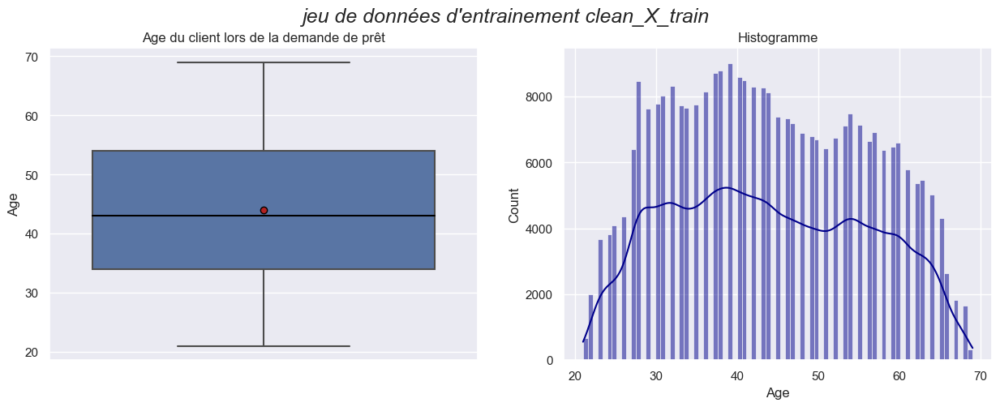

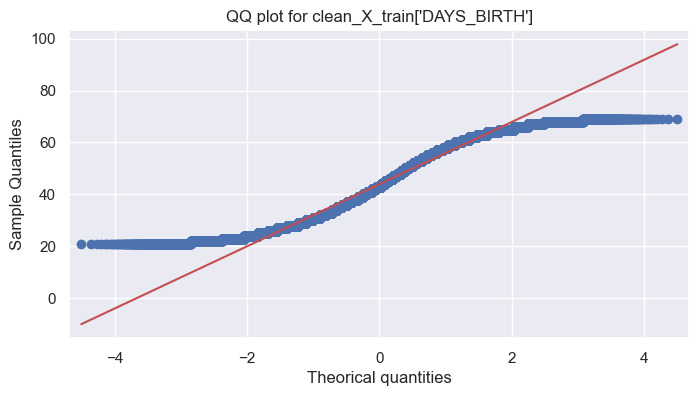

In [151]:
plt.figure(figsize = (15,5))
plt.suptitle("jeu de données d'entrainement clean_X_train", fontsize=18, fontstyle='italic')
plt.subplot(1,2,1)
# Propriétés graphiques     
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot( y=clean_X_train['DAYS_BIRTH'], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
plt.title('Age du client lors de la demande de prêt')
plt.ylabel('Age')

plt.subplot(1,2,2)
sns.histplot(clean_X_train['DAYS_BIRTH'], kde = True, color='Darkblue',discrete=False)
plt.title("Histogramme")
plt.xlabel('Age')
plt.show()

sm.qqplot(clean_X_train['DAYS_BIRTH'], line='s')
plt.title("QQ plot for clean_X_train['DAYS_BIRTH']")
plt.xlabel('Theorical quantities')


plt.show()

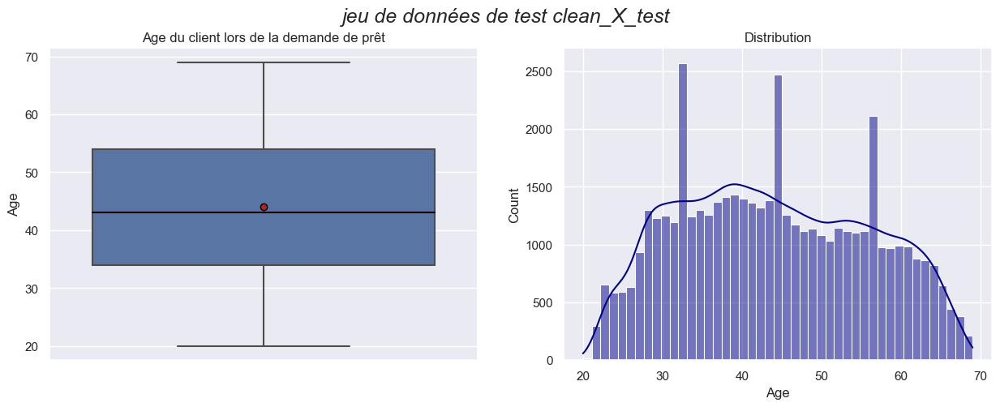

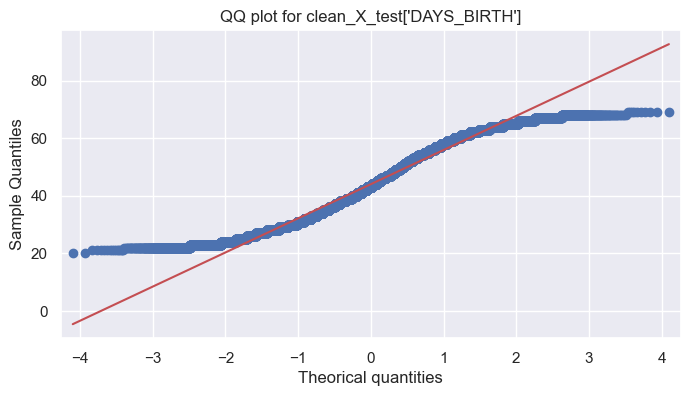

In [152]:

plt.figure(figsize = (15,5))
plt.suptitle("jeu de données de test clean_X_test", fontsize=18, fontstyle='italic')
plt.subplot(1,2,1)
# Propriétés graphiques     
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot( y=clean_X_test['DAYS_BIRTH'], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
plt.title('Age du client lors de la demande de prêt')
plt.ylabel('Age')
plt.subplot(1,2,2)
sns.histplot(clean_X_test['DAYS_BIRTH'], kde = True, color='Darkblue',discrete=False)
plt.title("Distribution")
plt.xlabel('Age')
plt.show()



sm.qqplot(clean_X_test['DAYS_BIRTH'], line='s')
plt.title("QQ plot for clean_X_test['DAYS_BIRTH']")
plt.xlabel('Theorical quantities')


plt.show()

La distribution ne suit pas une loi normale .Il n'y a pas de valeurs aberrantes. 
Je découpe en tranches d'âge avec un effectif à peu près identique pour chaque tranche.

In [153]:
pd.qcut(clean_X_train.DAYS_BIRTH, q=6).head(7)

0    (20.999, 31.0]
1      (43.0, 50.0]
2      (50.0, 58.0]
3      (50.0, 58.0]
4      (50.0, 58.0]
5      (43.0, 50.0]
6      (37.0, 43.0]
Name: DAYS_BIRTH, dtype: category
Categories (6, interval[float64, right]): [(20.999, 31.0] < (31.0, 37.0] < (37.0, 43.0] < (43.0, 50.0] < (50.0, 58.0] < (58.0, 69.0]]

In [154]:
clean_X_train['age_client'] = pd.qcut(clean_X_train.DAYS_BIRTH,
                                         q=6,
                                         labels=['31_ans_et_moins',
                                                 '32_à_37_ans',
                                                 '38_à_43_ans',
                                                 '44_à_50_ans',
                                                 '51_à_58_ans',
                                                 '59_à_69_ans'
                                                 ])
clean_X_test['age_client'] = pd.qcut(clean_X_test.DAYS_BIRTH,
                                         q=6,
                                         labels=['31_ans_et_moins',
                                                 '32_à_37_ans',
                                                 '38_à_43_ans',
                                                 '44_à_50_ans',
                                                 '51_à_58_ans',
                                                 '59_à_69_ans'
                                                 ])
clean_X_train['age_client'].value_counts()

31_ans_et_moins    56890
51_à_58_ans        54864
38_à_43_ans        51486
44_à_50_ans        50441
32_à_37_ans        48331
59_à_69_ans        45499
Name: age_client, dtype: int64

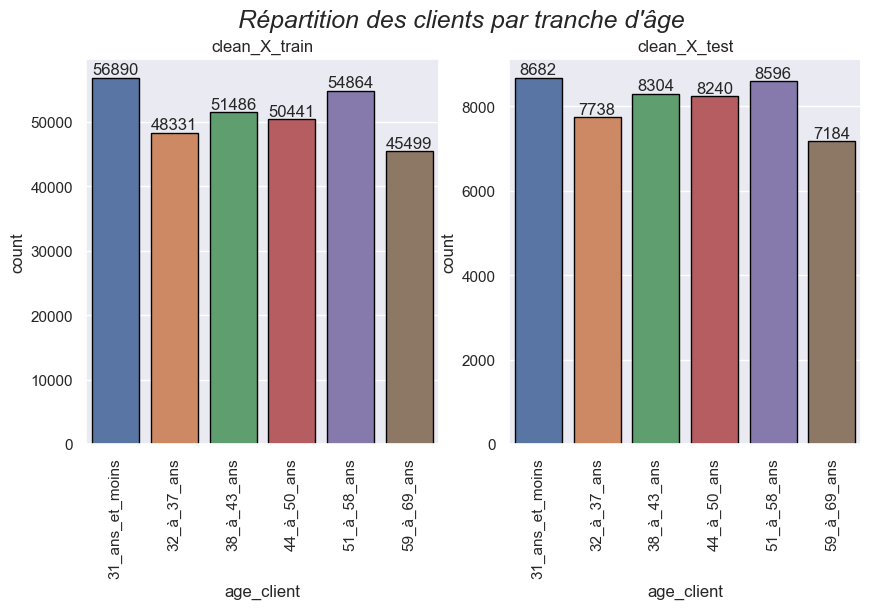

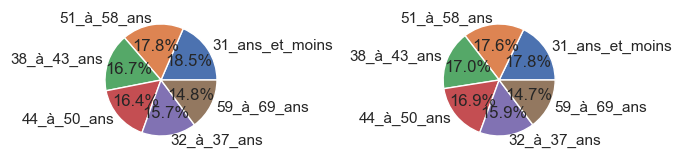

In [155]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Répartition des clients par tranche d'âge", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="age_client", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="age_client", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['age_client'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['age_client'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['age_client'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['age_client'], autopct='%.1f%%')


plt.show()

In [156]:
#On peut supprimer la variable DAYS_BIRTH dans X_Train et X_Test

clean_X_train.drop(labels='DAYS_BIRTH', 
                   axis=1, inplace=True)

clean_X_test.drop(labels='DAYS_BIRTH', 
                  axis=1, inplace=True)

In [157]:
clean_X_train.shape, clean_X_test.shape

((307511, 64), (48744, 63))

### Quelle est l'ancienneté du client dans son entreprise actuelle ?

In [158]:
clean_X_train['DAYS_EMPLOYED'].describe()

count   307,511.00
mean     63,815.05
std     141,275.77
min     -17,912.00
25%      -2,760.00
50%      -1,213.00
75%        -289.00
max     365,243.00
Name: DAYS_EMPLOYED, dtype: float64

In [159]:
# Calculer le nombre d'années en divisant par -365 
clean_X_train['DAYS_EMPLOYED'] = round(clean_X_train['DAYS_EMPLOYED'] / -365, 0)
clean_X_test['DAYS_EMPLOYED'] = round(clean_X_test['DAYS_EMPLOYED'] / -365, 0)

In [160]:
clean_X_train['DAYS_EMPLOYED'].describe()

count   307,511.00
mean       -174.90
std         387.19
min      -1,001.00
25%           1.00
50%           3.00
75%           8.00
max          49.00
Name: DAYS_EMPLOYED, dtype: float64

In [161]:
print("Nous avons vu plus haut qu'il y avait ", clean_X_train.loc[clean_X_train['NAME_INCOME_TYPE']==\
     'sans_emploi']['SK_ID_CURR'].count(),\
      "personnes qui ne travaillaient pas en entreprise(retraités,étudiants,chômeurs,\
      femmes au foyer)dans le jeu de donnees d'entrainement")

Nous avons vu plus haut qu'il y avait  55407 personnes qui ne travaillaient pas en entreprise(retraités,étudiants,chômeurs,      femmes au foyer)dans le jeu de donnees d'entrainement


Il faut les enlever temporairement avant de calculer l'ancienneté des clients qui travaillent.

In [162]:
# Suppression temporaire des clients retraités et des chômeurs pour calculer l'ancienneté des clients

modal_to_remove = ['sans emploi']

temp_X_train = clean_X_train.loc[~clean_X_train['NAME_INCOME_TYPE'].isin(modal_to_remove), :]
temp_X_test = clean_X_test.loc[~clean_X_test['NAME_INCOME_TYPE'].isin(modal_to_remove), :]

temp_X_train.shape,temp_X_test.shape

((307511, 64), (48744, 63))

In [163]:
#Calcul des tranches d'ancienneté

pd.qcut(temp_X_train.DAYS_EMPLOYED, q=4).head(10)

0          (1.0, 3.0]
1          (1.0, 3.0]
2    (-1001.001, 1.0]
3          (3.0, 8.0]
4          (3.0, 8.0]
5          (3.0, 8.0]
6         (8.0, 49.0]
7    (-1001.001, 1.0]
8    (-1001.001, 1.0]
9          (3.0, 8.0]
Name: DAYS_EMPLOYED, dtype: category
Categories (4, interval[float64, right]): [(-1001.001, 1.0] < (1.0, 3.0] < (3.0, 8.0] < (8.0, 49.0]]

In [164]:
clean_X_train['anciennete_entreprise'] = clean_X_train['DAYS_EMPLOYED']
clean_X_test['anciennete_entreprise'] = clean_X_train['DAYS_EMPLOYED']

clean_X_train['anciennete_entreprise'] = np.where(clean_X_train['DAYS_EMPLOYED'] <= 2, 
                                                  '2_ans_et_moins', clean_X_train['anciennete_entreprise'])
clean_X_test['anciennete_entreprise'] = np.where(clean_X_test['DAYS_EMPLOYED'] <= 2, 
                                                  '2_ans_et_moins', clean_X_test['anciennete_entreprise'])


clean_X_train['anciennete_entreprise'] = np.where((clean_X_train['DAYS_EMPLOYED'] > 2) & (clean_X_train['DAYS_EMPLOYED'] <= 5), 
                                                  '3_à_5_ans', clean_X_train['anciennete_entreprise'])
clean_X_test['anciennete_entreprise'] = np.where((clean_X_test['DAYS_EMPLOYED'] > 2) & (clean_X_test['DAYS_EMPLOYED'] <= 5), 
                                                  '3_à_5_ans', clean_X_test['anciennete_entreprise'])


clean_X_train['anciennete_entreprise'] = np.where((clean_X_train['DAYS_EMPLOYED'] > 5) & (clean_X_train['DAYS_EMPLOYED'] <= 9), 
                                                  '6_à_9_ans', clean_X_train['anciennete_entreprise'])
clean_X_test['anciennete_entreprise'] = np.where((clean_X_test['DAYS_EMPLOYED'] > 5) & (clean_X_test['DAYS_EMPLOYED'] <= 9), 
                                                  '6_à_9_ans', clean_X_test['anciennete_entreprise'])


clean_X_train['anciennete_entreprise'] = np.where(clean_X_train['DAYS_EMPLOYED'] > 9, 
                                                  '10_ans_et_plus', clean_X_train['anciennete_entreprise'])
clean_X_test['anciennete_entreprise'] = np.where(clean_X_test['DAYS_EMPLOYED'] > 9, 
                                                  '10_ans_et_plus', clean_X_test['anciennete_entreprise'])


clean_X_train['anciennete_entreprise'] = np.where(clean_X_train['NAME_INCOME_TYPE'].isin(modal_to_remove), 
                                                  'retraité_ou_sans_emploi', clean_X_train['anciennete_entreprise'])
clean_X_test['anciennete_entreprise'] = np.where(clean_X_test['NAME_INCOME_TYPE'].isin(modal_to_remove), 
                                                  'retraité_ou_sans_emploi', clean_X_test['anciennete_entreprise'])


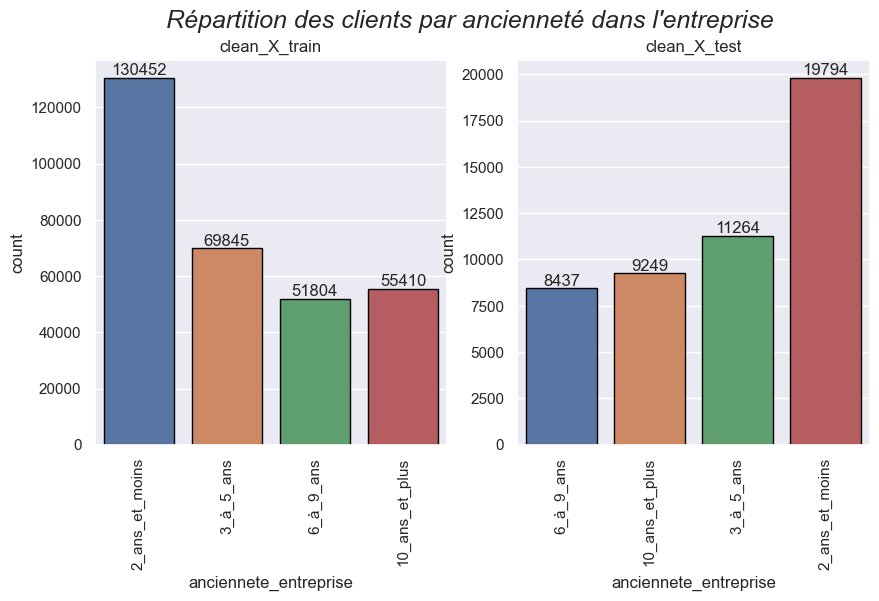

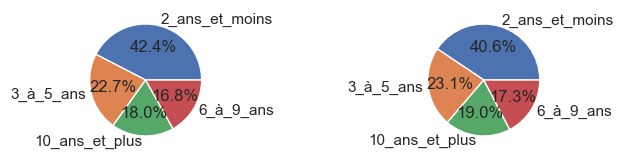

In [165]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Répartition des clients par ancienneté dans l'entreprise", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="anciennete_entreprise", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="anciennete_entreprise", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['anciennete_entreprise'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['anciennete_entreprise'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['anciennete_entreprise'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['anciennete_entreprise'], autopct='%.1f%%')


plt.show()

In [166]:
# Suppression de la variable DAYS_EMPLOYED dans X_Train et X_Test

clean_X_train.drop(labels='DAYS_EMPLOYED', 
                   axis=1, inplace=True)

clean_X_test.drop(labels='DAYS_EMPLOYED', 
                  axis=1, inplace=True)

 ### Combien de jours avant la demande le client a-t-il modifié son inscription ? 

In [167]:
# Calculé en jours depuis le jour de la demande (d'où le négatif) 
clean_X_train['DAYS_REGISTRATION'].describe()


count   307,511.00
mean     -4,986.12
std       3,522.89
min     -24,672.00
25%      -7,479.50
50%      -4,504.00
75%      -2,010.00
max           0.00
Name: DAYS_REGISTRATION, dtype: float64

In [168]:
# Calcul du nombre d'années (idem âge)
clean_X_train['DAYS_REGISTRATION'] = round(clean_X_train['DAYS_REGISTRATION'] / -365, 0)
clean_X_test['DAYS_REGISTRATION'] = round(clean_X_test['DAYS_REGISTRATION'] /-365, 0)

clean_X_train['DAYS_REGISTRATION'].describe()

count   307,511.00
mean         13.66
std           9.66
min           0.00
25%           6.00
50%          12.00
75%          20.00
max          68.00
Name: DAYS_REGISTRATION, dtype: float64

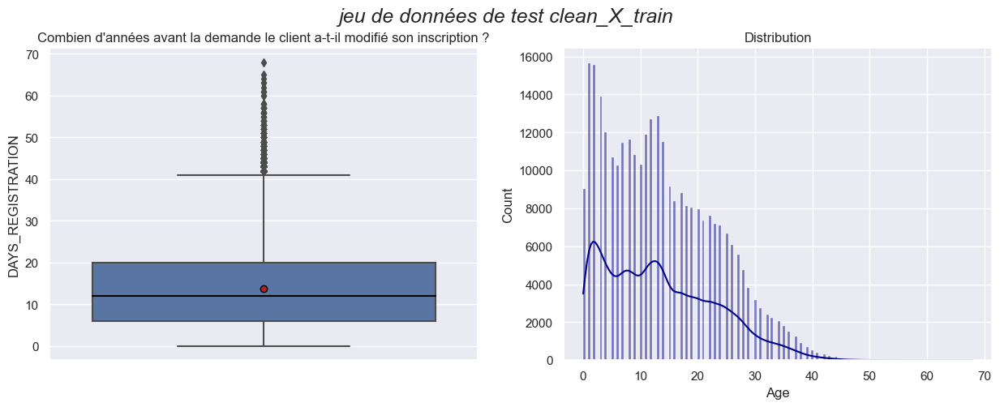

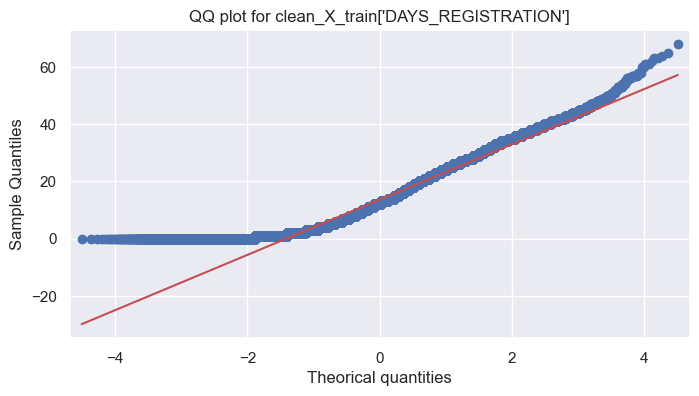

In [169]:
plt.figure(figsize = (15,5))
plt.suptitle("jeu de données de test clean_X_train", fontsize=18, fontstyle='italic')
plt.subplot(1,2,1)
# Propriétés graphiques     
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot( y=clean_X_train['DAYS_REGISTRATION'], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
plt.title("Combien d'années avant la demande le client a-t-il modifié son inscription ?")
plt.ylabel('DAYS_REGISTRATION')
plt.subplot(1,2,2)
sns.histplot(clean_X_train['DAYS_REGISTRATION'], kde = True, color='Darkblue',discrete=False)
plt.title("Distribution")
plt.xlabel('Age')
plt.show()



sm.qqplot(clean_X_train['DAYS_REGISTRATION'], line='s')
plt.title("QQ plot for clean_X_train['DAYS_REGISTRATION']")
plt.xlabel('Theorical quantities')


plt.show()

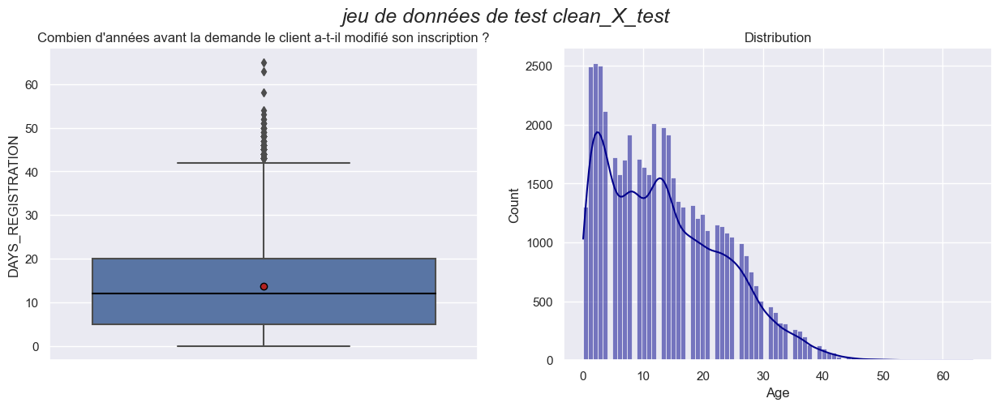

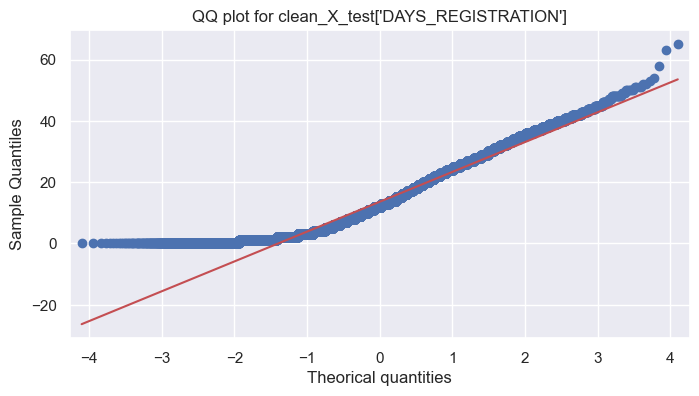

In [170]:
plt.figure(figsize = (15,5))
plt.suptitle("jeu de données de test clean_X_test", fontsize=18, fontstyle='italic')
plt.subplot(1,2,1)
# Propriétés graphiques     
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot( y=clean_X_test['DAYS_REGISTRATION'], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
plt.title("Combien d'années avant la demande le client a-t-il modifié son inscription ?")
plt.ylabel('DAYS_REGISTRATION')
plt.subplot(1,2,2)
sns.histplot(clean_X_test['DAYS_REGISTRATION'], kde = True, color='Darkblue',discrete=False)
plt.title("Distribution")
plt.xlabel('Age')
plt.show()



sm.qqplot(clean_X_test['DAYS_REGISTRATION'], line='s')
plt.title("QQ plot for clean_X_test['DAYS_REGISTRATION']")
plt.xlabel('Theorical quantities')


plt.show()

In [171]:
pd.qcut(clean_X_train.DAYS_REGISTRATION, q=4).head(7)

0      (6.0, 12.0]
1    (-0.001, 6.0]
2      (6.0, 12.0]
3     (20.0, 68.0]
4      (6.0, 12.0]
5     (12.0, 20.0]
6    (-0.001, 6.0]
Name: DAYS_REGISTRATION, dtype: category
Categories (4, interval[float64, right]): [(-0.001, 6.0] < (6.0, 12.0] < (12.0, 20.0] < (20.0, 68.0]]

In [172]:
clean_X_train['year_registration'] = pd.qcut(clean_X_train.DAYS_REGISTRATION,
                                             q=4,
                                             labels=['6_ans_et_moins',
                                                     '7_à_12_ans',
                                                     '13_à_20_ans',
                                                     '21_ans_et_plus']) 
clean_X_test['year_registration'] = pd.qcut(clean_X_test.DAYS_REGISTRATION,
                                             q=4,
                                             labels=['6_ans_et_moins',
                                                     '7_à_12_ans',
                                                     '13_à_20_ans',
                                                     '21_ans_et_plus']) 

clean_X_train['year_registration'].value_counts()

6_ans_et_moins    87086
21_ans_et_plus    76814
13_à_20_ans       74845
7_à_12_ans        68766
Name: year_registration, dtype: int64

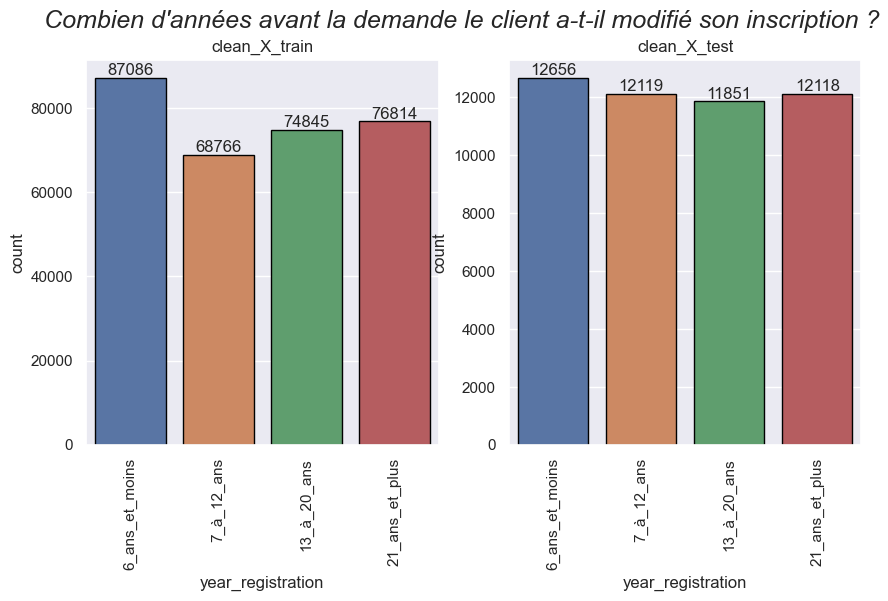

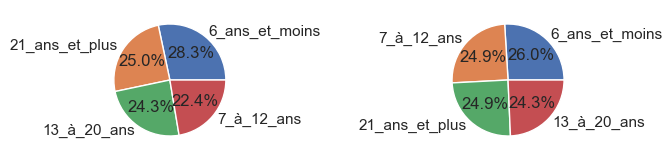

In [173]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Combien d'années avant la demande le client a-t-il modifié son inscription ?", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="year_registration", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="year_registration", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['year_registration'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['year_registration'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['year_registration'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['year_registration'], autopct='%.1f%%')


plt.show()

In [174]:
# Suppression de la variable DAYS_REGISTRATION dans X_Train et X_Test

clean_X_train.drop(labels='DAYS_REGISTRATION', 
                   axis=1, inplace=True)

clean_X_test.drop(labels='DAYS_REGISTRATION', 
                  axis=1, inplace=True)

### Quelle est la date d'émission de la carte d'identité utilisée pour la demande de crédit ?

In [175]:
# Calculé en jours depuis le jour de la demande (d'où le négatif) idem ancienneté_entreprise et ancienneté demande de crédit
clean_X_train['DAYS_ID_PUBLISH'].describe()

count   307,511.00
mean     -2,994.20
std       1,509.45
min      -7,197.00
25%      -4,299.00
50%      -3,254.00
75%      -1,720.00
max           0.00
Name: DAYS_ID_PUBLISH, dtype: float64

In [176]:
# Calcul du nombre d'années' (même principe que pour l'âge)
clean_X_train['DAYS_ID_PUBLISH'] = round(clean_X_train['DAYS_ID_PUBLISH'] / -365, 0)

clean_X_train['DAYS_ID_PUBLISH'].describe()

count   307,511.00
mean          8.20
std           4.15
min           0.00
25%           5.00
50%           9.00
75%          12.00
max          20.00
Name: DAYS_ID_PUBLISH, dtype: float64

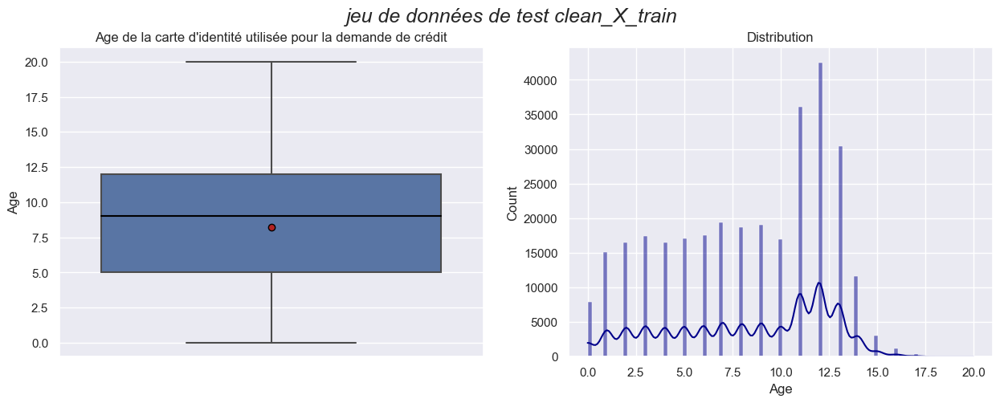

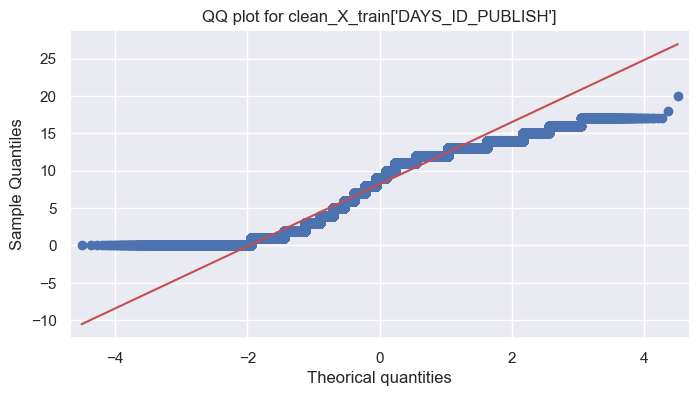

In [177]:
plt.figure(figsize = (15,5))
plt.suptitle("jeu de données de test clean_X_train", fontsize=18, fontstyle='italic')
plt.subplot(1,2,1)
# Propriétés graphiques     
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot( y=clean_X_train['DAYS_ID_PUBLISH'], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
plt.title("Age de la carte d'identité utilisée pour la demande de crédit")
plt.ylabel('Age')
plt.subplot(1,2,2)
sns.histplot(clean_X_train['DAYS_ID_PUBLISH'], kde = True, color='Darkblue',discrete=False)
plt.title("Distribution")
plt.xlabel('Age')
plt.show()



sm.qqplot(clean_X_train['DAYS_ID_PUBLISH'], line='s')
plt.title("QQ plot for clean_X_train['DAYS_ID_PUBLISH']")
plt.xlabel('Theorical quantities')


plt.show()

La distribution ne suit pas une loi normale .Il n'y a pas de valeurs aberrantes. 
Je découpe en tranches d'âge avec un effectif à peu près identique pour chaque tranche.

In [178]:
pd.qcut(clean_X_train.DAYS_ID_PUBLISH, q=3).head(5)

0    (-0.001, 6.0]
1    (-0.001, 6.0]
2      (6.0, 11.0]
3      (6.0, 11.0]
4      (6.0, 11.0]
Name: DAYS_ID_PUBLISH, dtype: category
Categories (3, interval[float64, right]): [(-0.001, 6.0] < (6.0, 11.0] < (11.0, 20.0]]

In [179]:
clean_X_train['anciennete_cid'] = pd.qcut(clean_X_train.DAYS_ID_PUBLISH,
                                          q=3,
                                          labels=['6_ans_et_moins',
                                                  '7_à_11_ans',
                                                  '11_et_plus'
                                                  ])
clean_X_test['anciennete_cid'] = pd.qcut(clean_X_test.DAYS_ID_PUBLISH,
                                          q=3,
                                          labels=['6_ans_et_moins',
                                                  '7_à_11_ans',
                                                  '11_et_plus'
                                                  ])




clean_X_train['anciennete_cid'].value_counts()

7_à_11_ans        110236
6_ans_et_moins    108049
11_et_plus         89226
Name: anciennete_cid, dtype: int64

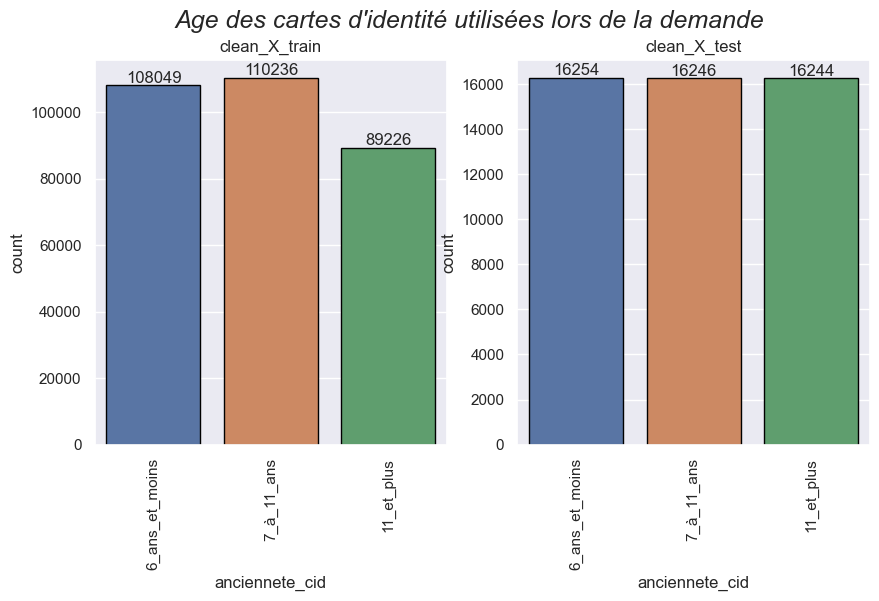

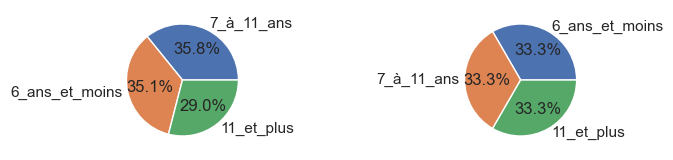

In [180]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Age des cartes d'identité utilisées lors de la demande", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="anciennete_cid", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="anciennete_cid", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['anciennete_cid'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['anciennete_cid'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['anciennete_cid'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['anciennete_cid'], autopct='%.1f%%')


plt.show()

In [181]:
# Suppression de la variable DAYS_ID_PUBLISH dans X_Train et X_Test

clean_X_train.drop(labels='DAYS_ID_PUBLISH', 
                   axis=1, inplace=True)

clean_X_test.drop(labels='DAYS_ID_PUBLISH', 
                  axis=1, inplace=True)

### Les numéros de  téléphone et adresses email des clients

In [182]:
# transformation des variables binaires en variables qualitatives

liste_phone = ['FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL']

flag_map = {1 : "Oui",
            0 : "Non"}

for var in liste_phone:
    clean_X_train[var] = clean_X_train[var].map(flag_map)
    clean_X_test[var] = clean_X_test[var].map(flag_map)

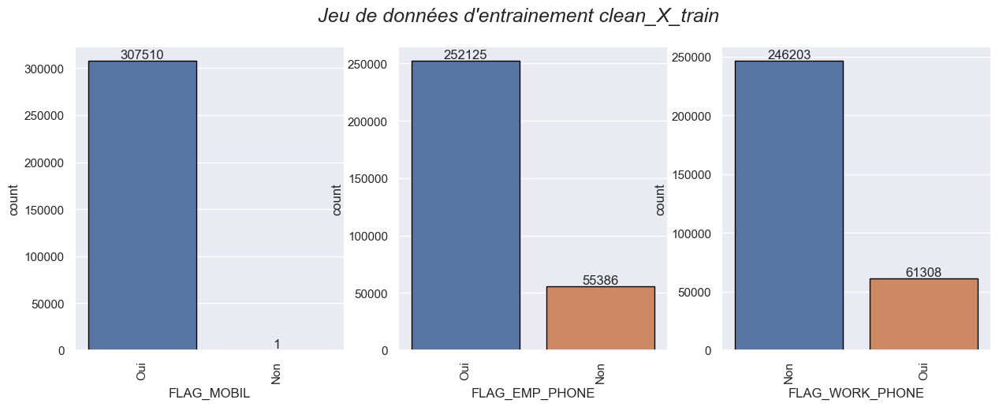

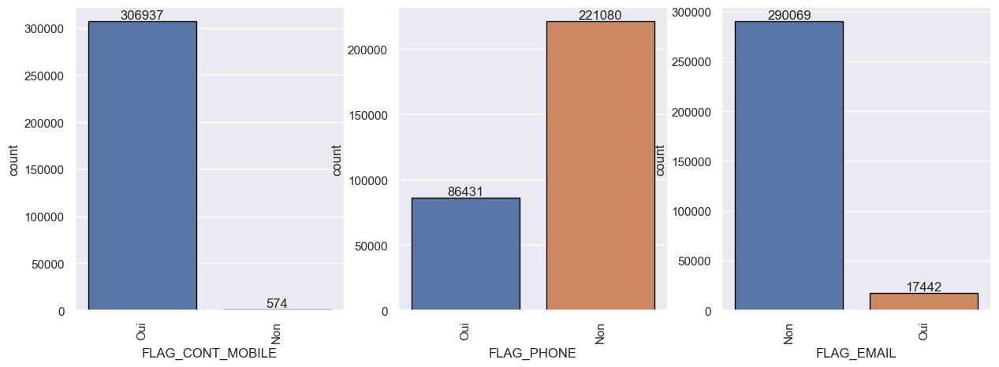

In [183]:
plt.figure(figsize = (15, 5))

plt.suptitle("Jeu de données d'entrainement clean_X_train", fontsize=18, fontstyle='italic')
plt.subplot(1,3,1)
ax=sns.countplot(data=clean_X_train, x="FLAG_MOBIL", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
#plt.title('FLAG_MOBIL')

plt.subplot(1,3,2)

ax=sns.countplot(data=clean_X_train, x="FLAG_EMP_PHONE", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
#plt.title('FLAG_EMP_PHONE')

plt.subplot(1,3,3)
ax=sns.countplot(data=clean_X_train, x="FLAG_WORK_PHONE", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
#plt.title('FLAG_WORK_PHONE')

plt.show()

plt.figure(figsize = (15, 5))

plt.subplot(1,3,1)
ax=sns.countplot(data=clean_X_train, x="FLAG_CONT_MOBILE", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
#plt.title('FLAG_CONT_MOBILE')

plt.subplot(1,3,2)

ax=sns.countplot(data=clean_X_train, x="FLAG_PHONE", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
#plt.title('FLAG_PHONE')

plt.subplot(1,3,3)
ax=sns.countplot(data=clean_X_train, x="FLAG_EMAIL", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
#plt.title('FLAG_EMAIL')

plt.show()

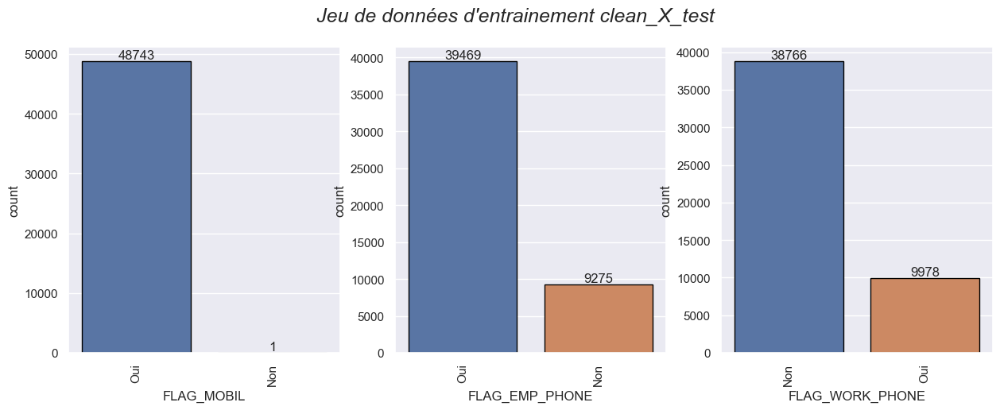

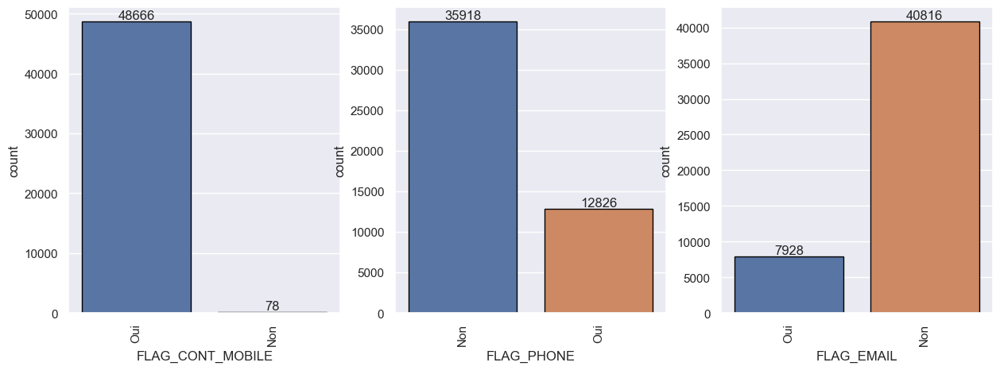

In [184]:
plt.figure(figsize = (15, 5))

plt.suptitle("Jeu de données d'entrainement clean_X_test", fontsize=18, fontstyle='italic')
plt.subplot(1,3,1)
ax=sns.countplot(data=clean_X_test, x="FLAG_MOBIL", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
#plt.title('FLAG_MOBIL')

plt.subplot(1,3,2)

ax=sns.countplot(data=clean_X_test, x="FLAG_EMP_PHONE", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
#plt.title('FLAG_EMP_PHONE')

plt.subplot(1,3,3)
ax=sns.countplot(data=clean_X_test, x="FLAG_WORK_PHONE", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
#plt.title('FLAG_WORK_PHONE')

plt.show()

plt.figure(figsize = (15, 5))

plt.subplot(1,3,1)
ax=sns.countplot(data=clean_X_test, x="FLAG_CONT_MOBILE", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
#plt.title('FLAG_CONT_MOBILE')

plt.subplot(1,3,2)

ax=sns.countplot(data=clean_X_test, x="FLAG_PHONE", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
#plt.title('FLAG_PHONE')

plt.subplot(1,3,3)
ax=sns.countplot(data=clean_X_test, x="FLAG_EMAIL", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
#plt.title('FLAG_EMAIL')

plt.show()

### De combien de personnes se compose la famille ?

In [185]:
clean_X_train['CNT_FAM_MEMBERS'].value_counts()

2.00     158357
1.00      67847
3.00      52601
4.00      24697
5.00       3478
6.00        408
7.00         81
8.00         20
9.00          6
10.00         3
14.00         2
12.00         2
20.00         2
16.00         2
13.00         1
2.40          1
15.00         1
2.20          1
11.00         1
Name: CNT_FAM_MEMBERS, dtype: int64

Je traite les 2 valeurs abérrantes en les convertissant en entier

In [186]:
clean_X_train['CNT_FAM_MEMBERS']=clean_X_train['CNT_FAM_MEMBERS'].astype(int)
clean_X_train['CNT_FAM_MEMBERS'].value_counts()


2     158359
1      67847
3      52601
4      24697
5       3478
6        408
7         81
8         20
9          6
10         3
14         2
12         2
20         2
16         2
13         1
15         1
11         1
Name: CNT_FAM_MEMBERS, dtype: int64

In [187]:
# Transformation de  'CNT_FAM_MEMBERS' en variable qualitative de l'ensemble entrainement de test
clean_X_train['nb_famille'] = clean_X_train['CNT_FAM_MEMBERS'] 
clean_X_test['nb_famille'] = clean_X_test['CNT_FAM_MEMBERS'] 

clean_X_train['nb_famille'] = np.where(clean_X_train['CNT_FAM_MEMBERS'] == 1, '1_personne', clean_X_train['nb_famille'])
clean_X_test['nb_famille'] = np.where(clean_X_test['CNT_FAM_MEMBERS'] == 1, '1_personne', clean_X_test['nb_famille'])

clean_X_train['nb_famille'] = np.where(clean_X_train['CNT_FAM_MEMBERS'] == 2, '2_personnes', clean_X_train['nb_famille'])
clean_X_test['nb_famille'] = np.where(clean_X_test['CNT_FAM_MEMBERS'] == 2, '2_personnes', clean_X_test['nb_famille'])

clean_X_train['nb_famille'] = np.where(clean_X_train['CNT_FAM_MEMBERS'] == 3, '3_personnes', clean_X_train['nb_famille'])
clean_X_test['nb_famille'] = np.where(clean_X_test['CNT_FAM_MEMBERS'] == 3, '3_personnes', clean_X_test['nb_famille'])

clean_X_train['nb_famille'] = np.where(clean_X_train['CNT_FAM_MEMBERS'] == 4, '4_personnes', clean_X_train['nb_famille'])
clean_X_test['nb_famille'] = np.where(clean_X_test['CNT_FAM_MEMBERS'] == 4, '4_personnes', clean_X_test['nb_famille'])
                                      
clean_X_train['nb_famille'] = np.where(clean_X_train['CNT_FAM_MEMBERS'] == 5, '5_personnes', clean_X_train['nb_famille'])
clean_X_test['nb_famille'] = np.where(clean_X_test['CNT_FAM_MEMBERS'] == 5, '5_personnes', clean_X_test['nb_famille'])
                                                                            
clean_X_train['nb_famille'] = np.where(clean_X_train['CNT_FAM_MEMBERS'] >= 6, '6_personnes_et_plus', clean_X_train['nb_famille'])
clean_X_test['nb_famille'] = np.where(clean_X_test['CNT_FAM_MEMBERS'] >= 6, '6_personnes_et_plus', clean_X_test['nb_famille'])
                                                                            
                               

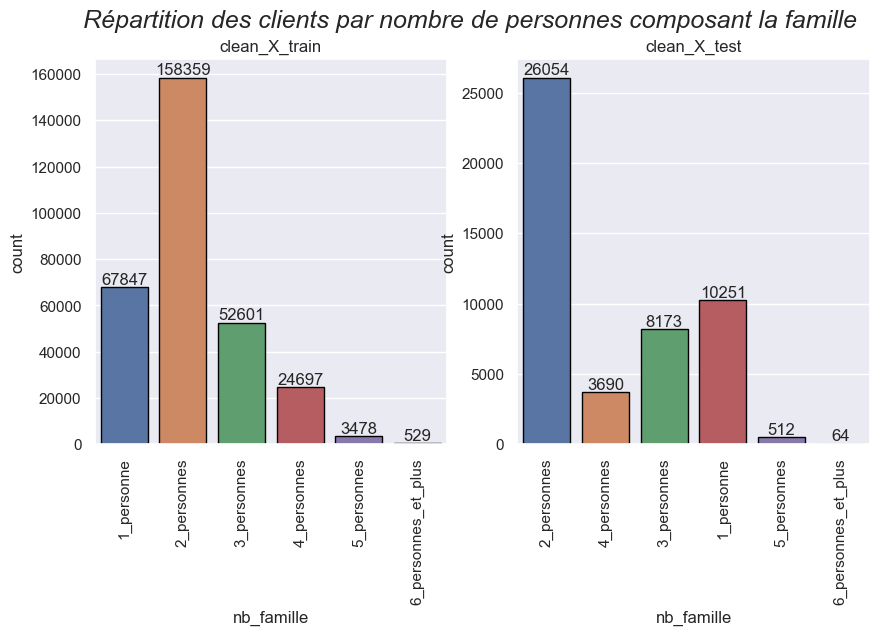

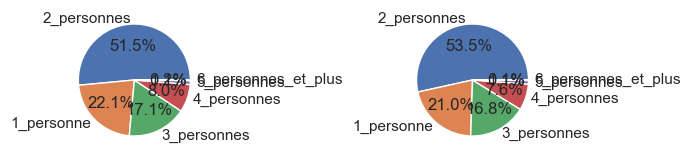

In [188]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Répartition des clients par nombre de personnes composant la famille", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="nb_famille", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="nb_famille", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['nb_famille'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['nb_famille'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['nb_famille'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['nb_famille'], autopct='%.1f%%')


plt.show()

In [189]:
#Suppression de la variable CNT_FAM_MEMBERS

clean_X_train.drop(labels='CNT_FAM_MEMBERS', axis=1, inplace=True)
clean_X_test.drop(labels='CNT_FAM_MEMBERS', axis=1, inplace=True)

### Quelle est l'évaluation de la société " Prêt à Dépenser"  dans la région et dans la ville où habite le client ?

In [190]:
liste_rating = ['REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY']

flag_map = {1 : "note_de_1",
            2 : "note_de_2",
            3 : "notede_3"}

for var in liste_rating:
    clean_X_train[var] = clean_X_train[var].map(flag_map)
    clean_X_test[var] = clean_X_test[var].map(flag_map)

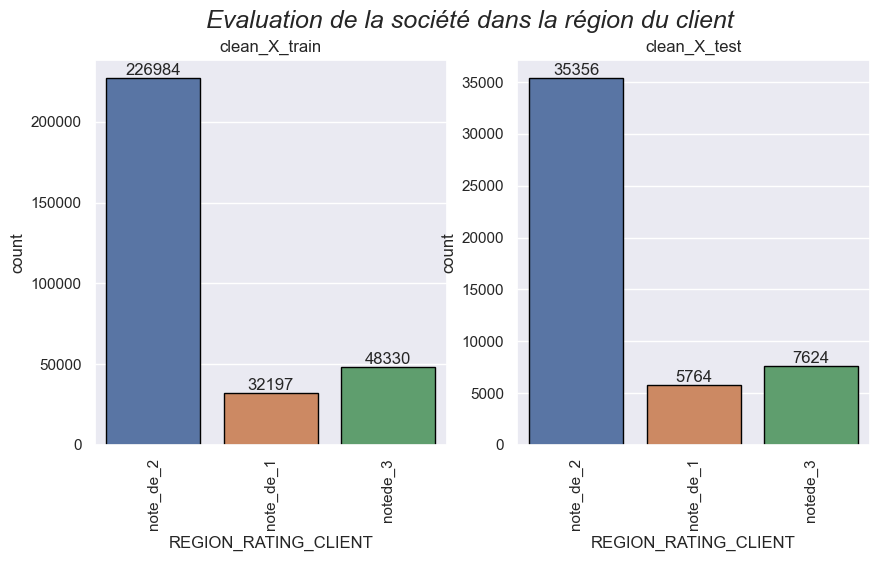

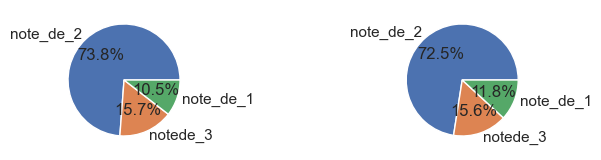

In [191]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Evaluation de la société dans la région du client", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="REGION_RATING_CLIENT", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="REGION_RATING_CLIENT", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['REGION_RATING_CLIENT'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['REGION_RATING_CLIENT'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['REGION_RATING_CLIENT'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['REGION_RATING_CLIENT'], autopct='%.1f%%')


plt.show()

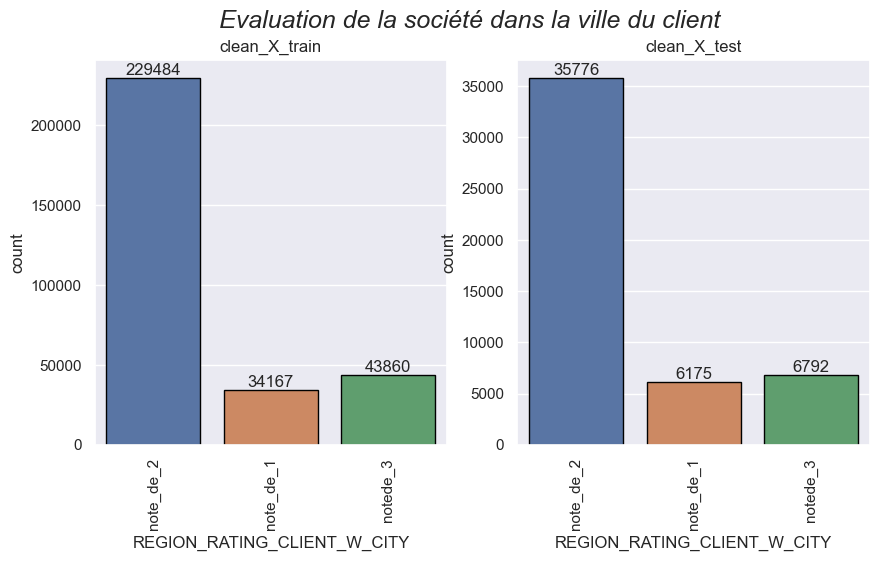

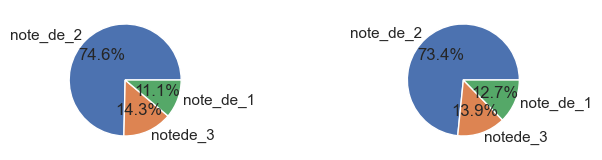

In [192]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Evaluation de la société dans la ville du client", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="REGION_RATING_CLIENT_W_CITY", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="REGION_RATING_CLIENT_W_CITY", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['REGION_RATING_CLIENT_W_CITY'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['REGION_RATING_CLIENT_W_CITY'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['REGION_RATING_CLIENT_W_CITY'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['REGION_RATING_CLIENT_W_CITY'], autopct='%.1f%%')


plt.show()

### A quelle heure de la journée, le client a demandé son prêt ?

In [193]:
clean_X_train['HOUR_APPR_PROCESS_START'].describe()

count   307,511.00
mean         12.06
std           3.27
min           0.00
25%          10.00
50%          12.00
75%          14.00
max          23.00
Name: HOUR_APPR_PROCESS_START, dtype: float64

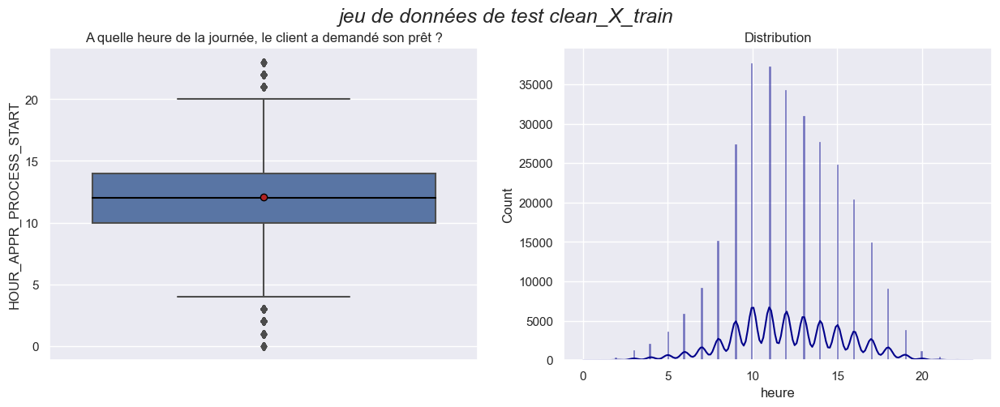

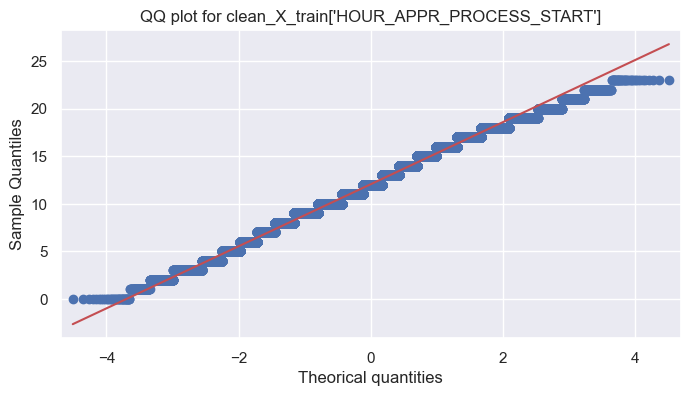

In [194]:
plt.figure(figsize = (15,5))
plt.suptitle("jeu de données de test clean_X_train", fontsize=18, fontstyle='italic')
plt.subplot(1,2,1)
# Propriétés graphiques     
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot( y=clean_X_train['HOUR_APPR_PROCESS_START'], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
plt.title("A quelle heure de la journée, le client a demandé son prêt ?")
plt.ylabel('HOUR_APPR_PROCESS_START')
plt.subplot(1,2,2)
sns.histplot(clean_X_train['HOUR_APPR_PROCESS_START'], kde = True, color='Darkblue',discrete=False)
plt.title("Distribution")
plt.xlabel('heure')
plt.show()



sm.qqplot(clean_X_train['HOUR_APPR_PROCESS_START'], line='s')
plt.title("QQ plot for clean_X_train['HOUR_APPR_PROCESS_START']")
plt.xlabel('Theorical quantities')


plt.show()

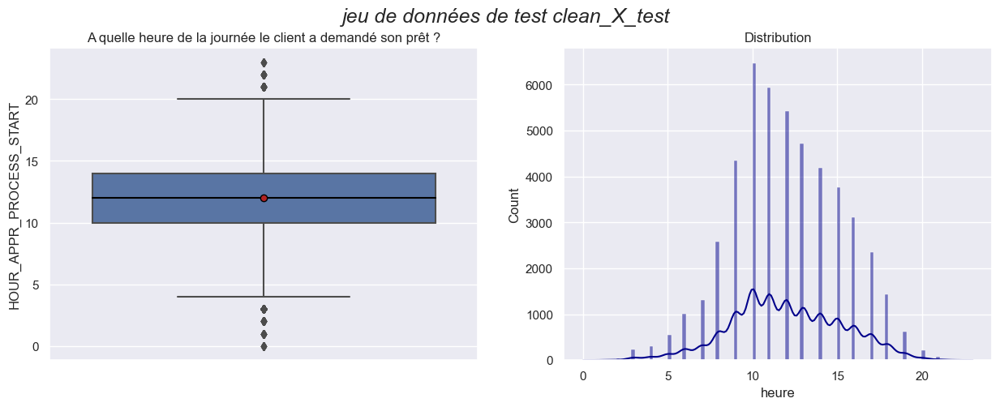

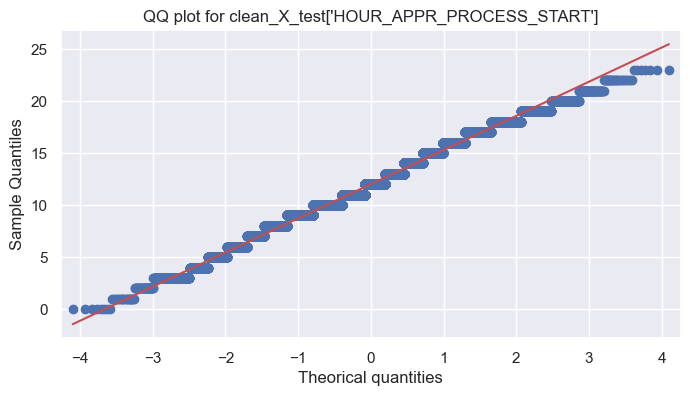

In [195]:
plt.figure(figsize = (15,5))
plt.suptitle("jeu de données de test clean_X_test", fontsize=18, fontstyle='italic')
plt.subplot(1,2,1)
# Propriétés graphiques     
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot( y=clean_X_test['HOUR_APPR_PROCESS_START'], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
plt.title("A quelle heure de la journée le client a demandé son prêt ?")
plt.ylabel('HOUR_APPR_PROCESS_START')
plt.subplot(1,2,2)
sns.histplot(clean_X_test['HOUR_APPR_PROCESS_START'], kde = True, color='Darkblue',discrete=False)
plt.title("Distribution")
plt.xlabel('heure')
plt.show()



sm.qqplot(clean_X_test['HOUR_APPR_PROCESS_START'], line='s')
plt.title("QQ plot for clean_X_test['HOUR_APPR_PROCESS_START']")
plt.xlabel('Theorical quantities')


plt.show()

In [196]:
clean_X_train['heure_demande_pret'] = clean_X_train['HOUR_APPR_PROCESS_START'] 

clean_X_train['heure_demande_pret'] = np.where((clean_X_train['HOUR_APPR_PROCESS_START'] <= 6)|(clean_X_train['HOUR_APPR_PROCESS_START'] >= 19),\
                                               'de_19h_à_6h', clean_X_train['heure_demande_pret'])


clean_X_train['heure_demande_pret'] = np.where((clean_X_train['HOUR_APPR_PROCESS_START'] > 6) & (clean_X_train['HOUR_APPR_PROCESS_START'] <= 12), 
                                                  'de_7h_à_12h', clean_X_train['heure_demande_pret'])

clean_X_train['heure_demande_pret'] = np.where((clean_X_train['HOUR_APPR_PROCESS_START'] > 12) & (clean_X_train['HOUR_APPR_PROCESS_START'] <= 18), 
                                                  'de_13h_à_18h', clean_X_train['heure_demande_pret'])
# idem pour clear_X_test
clean_X_test['heure_demande_pret'] = clean_X_test['HOUR_APPR_PROCESS_START'] 

clean_X_test['heure_demande_pret'] = np.where((clean_X_test['HOUR_APPR_PROCESS_START'] <= 6)|(clean_X_test['HOUR_APPR_PROCESS_START'] >= 19),\
                                               'de_19h_à_6h', clean_X_test['heure_demande_pret'])


clean_X_test['heure_demande_pret'] = np.where((clean_X_test['HOUR_APPR_PROCESS_START'] > 6) & (clean_X_test['HOUR_APPR_PROCESS_START'] <= 12), 
                                                  'de_7h_à_12h', clean_X_test['heure_demande_pret'])

clean_X_test['heure_demande_pret'] = np.where((clean_X_test['HOUR_APPR_PROCESS_START'] > 12) & (clean_X_test['HOUR_APPR_PROCESS_START'] <= 18), 
                                                  'de_13h_à_18h', clean_X_test['heure_demande_pret'])

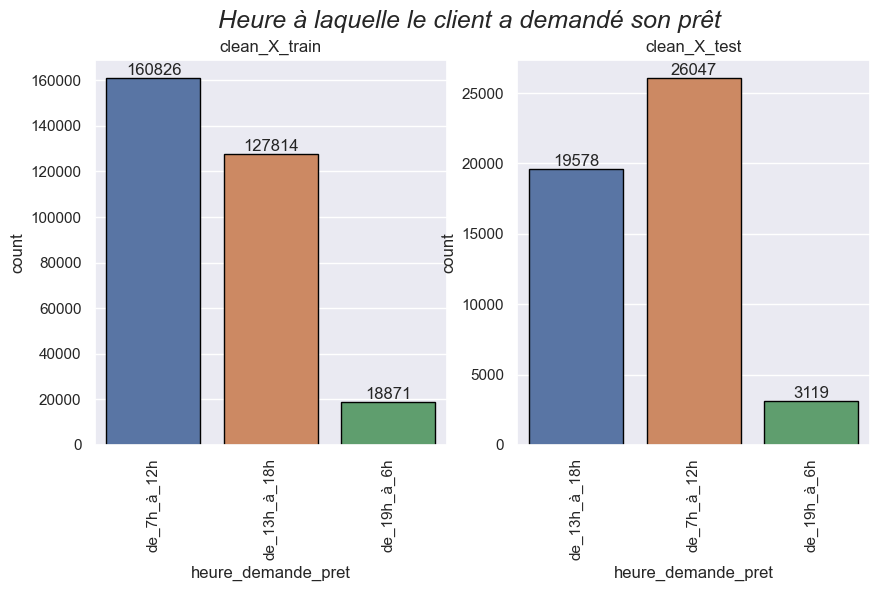

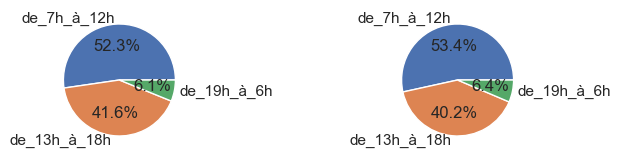

In [197]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Heure à laquelle le client a demandé son prêt", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="heure_demande_pret", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="heure_demande_pret", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['heure_demande_pret'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['heure_demande_pret'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['heure_demande_pret'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['heure_demande_pret'], autopct='%.1f%%')


plt.show()

In [198]:
# Suppression de la variable HOUR_APPR_PROCESS_START dans X_Train et X_Test

clean_X_train.drop(labels='HOUR_APPR_PROCESS_START', 
                   axis=1, inplace=True)

clean_X_test.drop(labels='HOUR_APPR_PROCESS_START', 
                  axis=1, inplace=True)

clean_X_train.shape, clean_X_test.shape

((307511, 64), (48744, 63))

### Les adresses client (domicile,contact et travail) sont -elles identiques ou différentes ?
    REG_REGION_NOT_LIVE_REGION  :client's permanent address Vs contact address (1=different, 0=same, at region level)  	
    REG_REGION_NOT_WORK_REGION  :client's permanent address Vs work address (1=different, 0=same, at region level)  
    LIVE_REGION_NOT_WORK_REGION :client's contact address Vs work address (1=different, 0=same, at region level)  
    REG_CITY_NOT_LIVE_CITY	    :client's permanent address Vs contact address (1=different, 0=same, at city level)    	
    REG_CITY_NOT_WORK_CITY	    :client's permanent address Vs work address (1=different, 0=same, at city level)  	
    LIVE_CITY_NOT_WORK_CITY	    :client's contact address Vs work address (1=different, 0=same, at city level)  	

In [199]:
clean_X_train['REG_REGION_NOT_LIVE_REGION'].value_counts()

0    302854
1      4657
Name: REG_REGION_NOT_LIVE_REGION, dtype: int64

In [200]:
# transformation des variables binaires en variables qualitatives

liste1 = ['REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY']

flag_map = {1 : "adresse differente",
            0 : "adresse identique"}

for var in liste1:
    clean_X_train[var] = clean_X_train[var].map(flag_map)
    clean_X_test[var] = clean_X_test[var].map(flag_map)

In [201]:
clean_X_train['REG_REGION_NOT_LIVE_REGION'].head(5)

0    adresse identique
1    adresse identique
2    adresse identique
3    adresse identique
4    adresse identique
Name: REG_REGION_NOT_LIVE_REGION, dtype: object

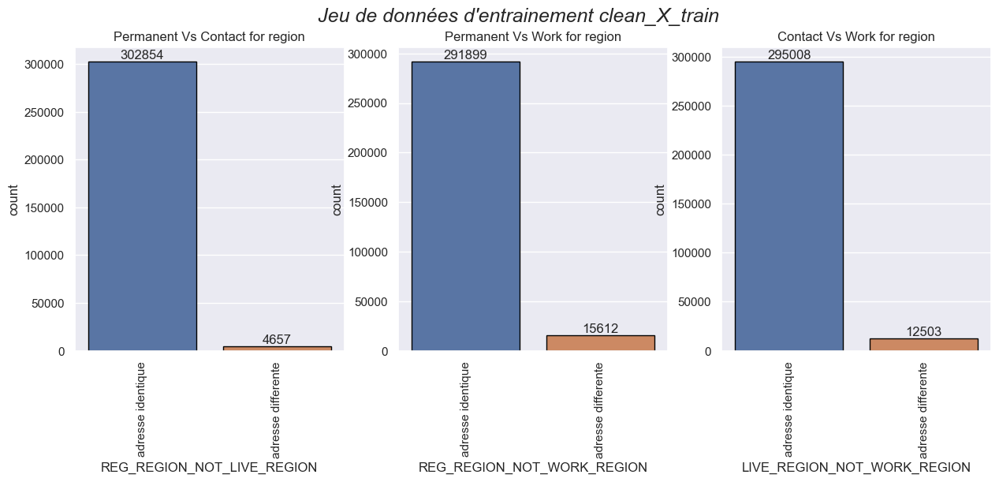

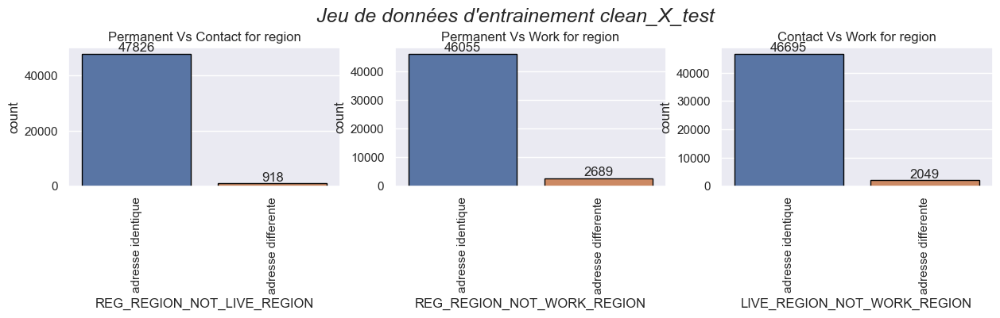

In [202]:
plt.figure(figsize = (15, 5))

plt.suptitle("Jeu de données d'entrainement clean_X_train", fontsize=18, fontstyle='italic')
plt.subplot(1,3,1)
ax=sns.countplot(data=clean_X_train, x="REG_REGION_NOT_LIVE_REGION", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Permanent Vs Contact for region')

plt.subplot(1,3,2)

ax=sns.countplot(data=clean_X_train, x="REG_REGION_NOT_WORK_REGION", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Permanent Vs Work for region')

plt.subplot(1,3,3)
ax=sns.countplot(data=clean_X_train, x="LIVE_REGION_NOT_WORK_REGION", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Contact Vs Work for region')
plt.show()

plt.figure(figsize = (15, 5))

plt.suptitle("Jeu de données d'entrainement clean_X_test", fontsize=18, fontstyle='italic')
plt.subplot(2,3,1)
ax=sns.countplot(data=clean_X_test, x="REG_REGION_NOT_LIVE_REGION", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Permanent Vs Contact for region')

plt.subplot(2,3,2)

ax=sns.countplot(data=clean_X_test, x="REG_REGION_NOT_WORK_REGION", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Permanent Vs Work for region')

plt.subplot(2,3,3)
ax=sns.countplot(data=clean_X_test, x="LIVE_REGION_NOT_WORK_REGION", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Contact Vs Work for region')

plt.show()


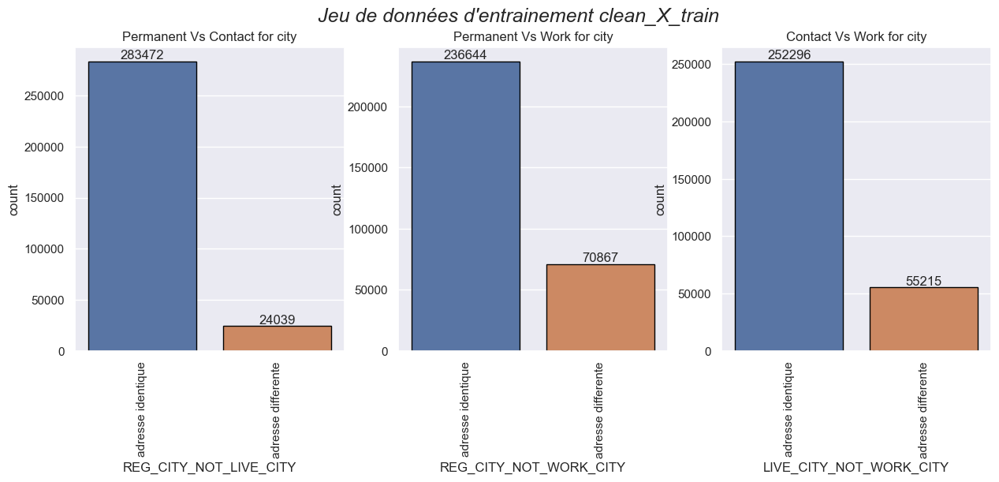

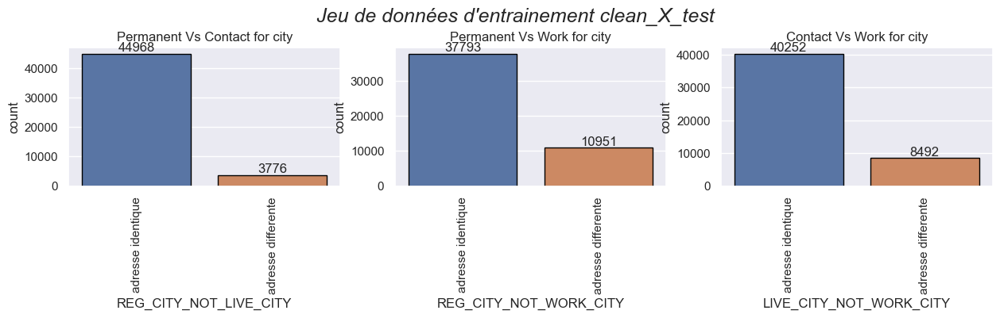

In [203]:
plt.figure(figsize = (15, 5))

plt.suptitle("Jeu de données d'entrainement clean_X_train", fontsize=18, fontstyle='italic')
plt.subplot(1,3,1)
ax=sns.countplot(data=clean_X_train, x="REG_CITY_NOT_LIVE_CITY", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Permanent Vs Contact for city')

plt.subplot(1,3,2)

ax=sns.countplot(data=clean_X_train, x="REG_CITY_NOT_WORK_CITY", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Permanent Vs Work for city')

plt.subplot(1,3,3)
ax=sns.countplot(data=clean_X_train, x="LIVE_CITY_NOT_WORK_CITY", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Contact Vs Work for city')

plt.show()

plt.figure(figsize = (15, 5))

plt.suptitle("Jeu de données d'entrainement clean_X_test", fontsize=18, fontstyle='italic')
plt.subplot(2,3,1)
ax=sns.countplot(data=clean_X_test, x="REG_CITY_NOT_LIVE_CITY", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Permanent Vs Contact for city')

plt.subplot(2,3,2)

ax=sns.countplot(data=clean_X_test, x="REG_CITY_NOT_WORK_CITY", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Permanent Vs Work for city')

plt.subplot(2,3,3)
ax=sns.countplot(data=clean_X_test, x="LIVE_CITY_NOT_WORK_CITY", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('Contact Vs Work for city')

plt.show()



### Les variables " CNT_SOCIAL_CIRCLE "

In [204]:
liste_cnt_soc=['OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE']
clean_X_train[liste_cnt_soc].describe()

,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE
count,"307,511.00","307,511.00","307,511.00","307,511.00"
mean,1.42,0.14,1.40,0.10
std,2.40,0.45,2.38,0.36
min,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,0.00
50%,0.00,0.00,0.00,0.00
75%,2.00,0.00,2.00,0.00
max,348.00,34.00,344.00,24.00


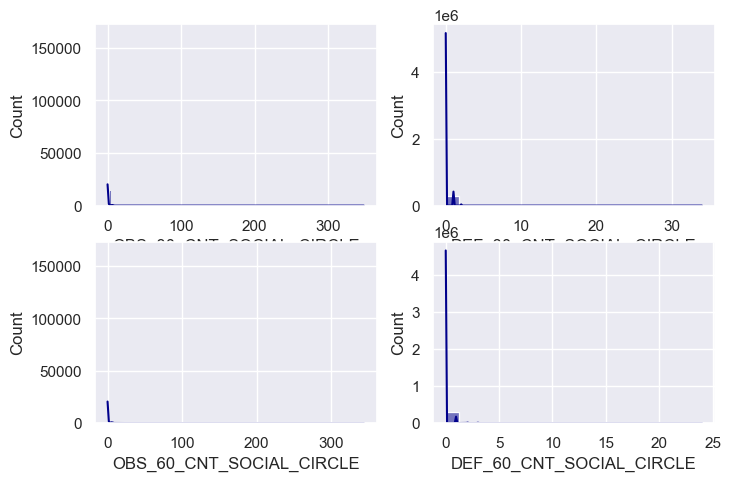

In [205]:
fig = plt.figure(figsize=(8,8))
for i in enumerate(clean_X_train[liste_cnt_soc]):
    fig.add_subplot(3,2,i[0]+1)
    sns.histplot(clean_X_train[i[1]], kde = True, color='Darkblue',discrete=False)
    
    

Je ne conserve pas ces variables car i ly a trop de valeurs nulles.

In [206]:
clean_X_train.drop(labels=liste_cnt_soc, 
                   axis=1, inplace=True)

clean_X_test.drop(labels=liste_cnt_soc, 
                  axis=1, inplace=True)

### Quel est l'âge du téléphone portable du client ?

In [207]:
# Calculé en jours depuis le jour de la demande (d'où le négatif) 
clean_X_train['DAYS_LAST_PHONE_CHANGE'].describe()

count   307,511.00
mean       -962.86
std         826.81
min      -4,292.00
25%      -1,570.00
50%        -757.00
75%        -274.00
max           0.00
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

In [208]:
# Calcul du nombre de mois d'ancienneté (même principe que pour l'âge)
clean_X_train['DAYS_LAST_PHONE_CHANGE'] = round(clean_X_train['DAYS_LAST_PHONE_CHANGE'] / -12, 0)

clean_X_train['DAYS_LAST_PHONE_CHANGE'].describe()

count   307,511.00
mean         80.23
std          68.91
min          -0.00
25%          23.00
50%          63.00
75%         131.00
max         358.00
Name: DAYS_LAST_PHONE_CHANGE, dtype: float64

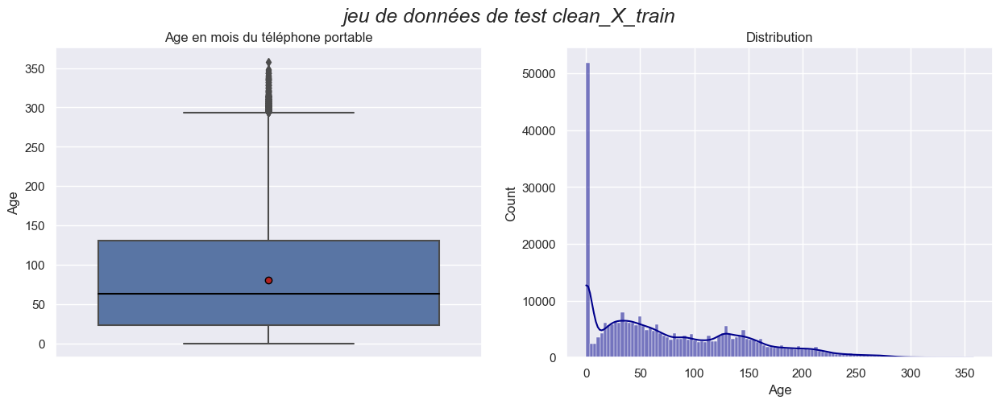

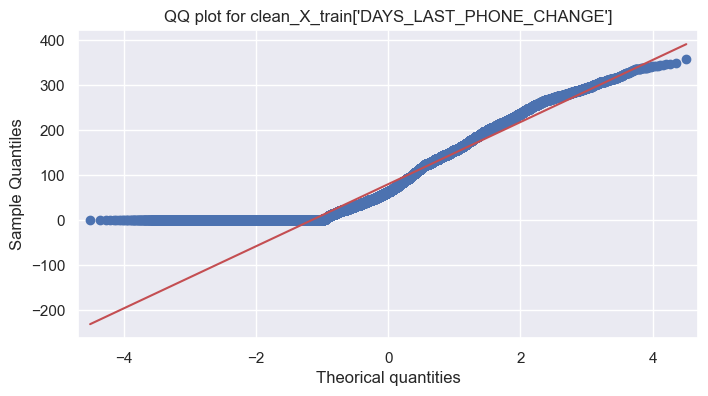

In [209]:
plt.figure(figsize = (15,5))
plt.suptitle("jeu de données de test clean_X_train", fontsize=18, fontstyle='italic')
plt.subplot(1,2,1)
# Propriétés graphiques     
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot( y=clean_X_train['DAYS_LAST_PHONE_CHANGE'], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
plt.title("Age en mois du téléphone portable")
plt.ylabel('Age')
plt.subplot(1,2,2)
sns.histplot(clean_X_train['DAYS_LAST_PHONE_CHANGE'], kde = True, color='Darkblue',discrete=False)
plt.title("Distribution")
plt.xlabel('Age')
plt.show()



sm.qqplot(clean_X_train['DAYS_LAST_PHONE_CHANGE'], line='s')
plt.title("QQ plot for clean_X_train['DAYS_LAST_PHONE_CHANGE']")
plt.xlabel('Theorical quantities')


plt.show()

 la distribution est non gaussienne et asymétrique avec la moyenne supérieure à la médiane. 

In [210]:
pd.qcut(clean_X_train.DAYS_LAST_PHONE_CHANGE, q=4).head(5)

0    (63.0, 131.0]
1    (63.0, 131.0]
2    (63.0, 131.0]
3     (23.0, 63.0]
4    (63.0, 131.0]
Name: DAYS_LAST_PHONE_CHANGE, dtype: category
Categories (4, interval[float64, right]): [(-0.001, 23.0] < (23.0, 63.0] < (63.0, 131.0] < (131.0, 358.0]]

In [211]:
clean_X_train['anciennete_portable'] = pd.qcut(clean_X_train.DAYS_LAST_PHONE_CHANGE,
                                               q=4,
                                               labels=['23_mois_et_moins',
                                                       '24_à_63_mois',
                                                       '64_à_131_mois',
                                                       '132_mois_et_plus'
                                                       ])
clean_X_test['anciennete_portable'] = pd.qcut(clean_X_test.DAYS_LAST_PHONE_CHANGE,
                                               q=4,
                                               labels=['23_mois_et_moins',
                                                       '24_à_63_mois',
                                                       '64_à_131_mois',
                                                       '132_mois_et_plus'
                                                       ])



clean_X_train['anciennete_portable'].value_counts()

23_mois_et_moins    78127
64_à_131_mois       77187
24_à_63_mois        76196
132_mois_et_plus    76001
Name: anciennete_portable, dtype: int64

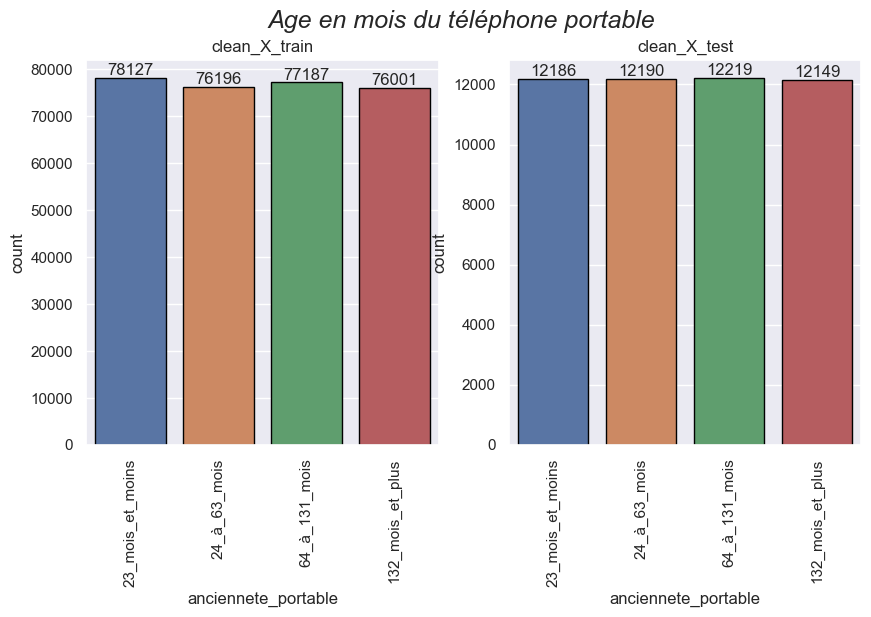

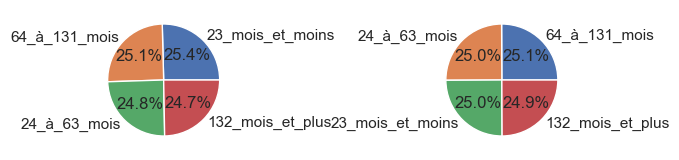

In [212]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Age en mois du téléphone portable", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=clean_X_train, x="anciennete_portable", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('clean_X_train')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=clean_X_test, x="anciennete_portable", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('clean_X_test')
plt.show()
plt.subplot(2,2,1)

type_count = clean_X_train['anciennete_portable'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['anciennete_portable'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = clean_X_test['anciennete_portable'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['anciennete_portable'], autopct='%.1f%%')


plt.show()

In [213]:
# Suppression de la variable DAYS_LAST_PHONE_CHANGE dans X_Train et X_Test

clean_X_train.drop(labels='DAYS_LAST_PHONE_CHANGE', 
                   axis=1, inplace=True)

clean_X_test.drop(labels='DAYS_LAST_PHONE_CHANGE', 
                  axis=1, inplace=True)

### Quels sont les documents fournis par le client ?

In [214]:
liste_doc = ['FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 
          'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 
          'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 
          'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21']

flag_map = {1 : "Oui",
            0 : "Non"}

for var in liste_doc:
    clean_X_train[var] = clean_X_train[var].map(flag_map)
    clean_X_test[var] = clean_X_test[var].map(flag_map)

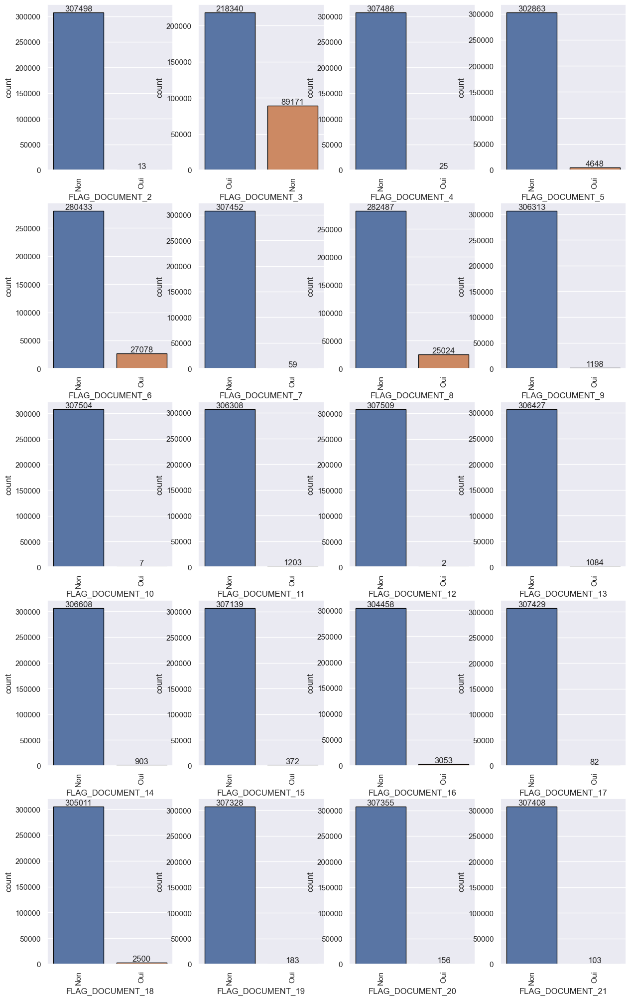

In [215]:

 fig = plt.figure(figsize=(15,25))   
for i in enumerate(liste_doc):
    #print(i)
    fig.add_subplot(5,4,i[0]+1)
    ax=sns.countplot(data=clean_X_train, x=liste_doc[i[0]], edgecolor="black") 
    ax.bar_label(ax.containers[0])
    plt.xticks(rotation=90)
    
    

au vu des graphiques ci-dessus ,je conserve uniquement les documents 3 , 6 et 8


In [216]:
liste_doc_remove = liste_doc
liste_doc_remove.remove('FLAG_DOCUMENT_3')
liste_doc_remove.remove('FLAG_DOCUMENT_6')
liste_doc_remove.remove('FLAG_DOCUMENT_8')
clean_X_train.drop(labels=liste_doc_remove, 
                  axis=1, inplace=True)
clean_X_test.drop(labels=liste_doc_remove, 
                  axis=1, inplace=True)


In [217]:
clean_X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 43 columns):
 #   Column                       Non-Null Count   Dtype   
---  ------                       --------------   -----   
 0   SK_ID_CURR                   307511 non-null  int64   
 1   NAME_CONTRACT_TYPE           307511 non-null  object  
 2   CODE_GENDER                  307511 non-null  object  
 3   FLAG_OWN_CAR                 307511 non-null  object  
 4   FLAG_OWN_REALTY              307511 non-null  object  
 5   NAME_TYPE_SUITE              307511 non-null  object  
 6   NAME_INCOME_TYPE             307511 non-null  object  
 7   NAME_EDUCATION_TYPE          307511 non-null  object  
 8   NAME_FAMILY_STATUS           307511 non-null  object  
 9   NAME_HOUSING_TYPE            307511 non-null  object  
 10  FLAG_MOBIL                   307511 non-null  object  
 11  FLAG_EMP_PHONE               307511 non-null  object  
 12  FLAG_WORK_PHONE              307511 non-null

In [218]:
clean_X_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Data columns (total 42 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   SK_ID_CURR                   48744 non-null  int64   
 1   NAME_CONTRACT_TYPE           48744 non-null  object  
 2   CODE_GENDER                  48744 non-null  object  
 3   FLAG_OWN_CAR                 48744 non-null  object  
 4   FLAG_OWN_REALTY              48744 non-null  object  
 5   NAME_TYPE_SUITE              48744 non-null  object  
 6   NAME_INCOME_TYPE             48744 non-null  object  
 7   NAME_EDUCATION_TYPE          48744 non-null  object  
 8   NAME_FAMILY_STATUS           48744 non-null  object  
 9   NAME_HOUSING_TYPE            48744 non-null  object  
 10  FLAG_MOBIL                   48744 non-null  object  
 11  FLAG_EMP_PHONE               48744 non-null  object  
 12  FLAG_WORK_PHONE              48744 non-null  object  
 13  F

### Conclusion sur le data Cleaning des ensembles d'entraînement et de test

Nous avons conservé 41 variables après le nettoyage du dataset initial.

## previous_application



In [219]:
previous_application.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

### Les demandes antérieures de crédit des clients

Ce fichier regroupe toutes les demandes précédentes de prêts immobiliers des clients qui ont des prêts dans notre échantillon. Il y a une ligne pour chaque demande précédente liée aux prêts dans notre échantillon de données.

Un prêt de l'échantillon principal peut avoir 0, 1, 2 demandes de prêt précédentes ou plus dans Home Credit, une demande précédente pourrait, mais pas nécessairement, conduire à un crédit.

In [220]:
previous_application.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [221]:
# % de valeurs manquantes par variable
missing_values(previous_application)

,Total,%
RATE_INTEREST_PRIVILEGED,1664263,99.64
RATE_INTEREST_PRIMARY,1664263,99.64
RATE_DOWN_PAYMENT,895844,53.64
AMT_DOWN_PAYMENT,895844,53.64
NAME_TYPE_SUITE,820405,49.12
NFLAG_INSURED_ON_APPROVAL,673065,40.30
DAYS_FIRST_DRAWING,673065,40.30
DAYS_FIRST_DUE,673065,40.30
DAYS_LAST_DUE_1ST_VERSION,673065,40.30
DAYS_LAST_DUE,673065,40.30


In [222]:
# Suppression des variables avec valeurs manquantes dont % > 10 %
var_to_drop = [var for var in previous_application.columns if previous_application[var].isnull().mean() > 0.1]
print(var_to_drop)

['AMT_ANNUITY', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'NAME_TYPE_SUITE', 'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL']


In [223]:
previous_application.drop(labels=var_to_drop, axis=1, inplace=True)

### Les variables numériques

In [224]:
# Les variables numériques
var_num = previous_application.drop(labels=['SK_ID_CURR', 'SK_ID_PREV'], axis=1).select_dtypes(include=[np.number]).columns.to_list()
print(var_num)

['AMT_APPLICATION', 'AMT_CREDIT', 'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY', 'DAYS_DECISION', 'SELLERPLACE_AREA']


In [225]:
previous_application.drop(labels=['SK_ID_CURR', 'SK_ID_PREV'], axis=1).select_dtypes(include=[np.number]).describe()

,AMT_APPLICATION,AMT_CREDIT,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,SELLERPLACE_AREA
count,"1,670,214.00","1,670,213.00","1,670,214.00","1,670,214.00","1,670,214.00","1,670,214.00"
mean,"175,233.86","196,114.02",12.48,1.00,-880.68,313.95
std,"292,779.76","318,574.62",3.33,0.06,779.10,"7,127.44"
min,0.00,0.00,0.00,0.00,"-2,922.00",-1.00
25%,"18,720.00","24,160.50",10.00,1.00,"-1,300.00",-1.00
50%,"71,046.00","80,541.00",12.00,1.00,-581.00,3.00
75%,"180,360.00","216,418.50",15.00,1.00,-280.00,82.00
max,"6,905,160.00","6,905,160.00",23.00,1.00,-1.00,"4,000,000.00"


In [226]:
# Indique si l'application était la dernière application par jour du client. 
# Parfois, les clients demandent plus d'applications par jour. 
# Rarement, il peut également s'agir d'une erreur du système 
# selon laquelle une application se trouve deux fois dans la base de données

previous_application['NFLAG_LAST_APPL_IN_DAY'].value_counts()

1    1664314
0       5900
Name: NFLAG_LAST_APPL_IN_DAY, dtype: int64

In [227]:
previous_application.query('NFLAG_LAST_APPL_IN_DAY == 1', inplace=True)

previous_application.drop(labels='NFLAG_LAST_APPL_IN_DAY', axis=1, inplace=True)

previous_application.shape

(1664314, 22)

In [228]:
# Suppression de la zone de ventes des demandes précédentes !! 

previous_application.drop(labels='SELLERPLACE_AREA', axis=1, inplace=True)

previous_application.shape

(1664314, 21)

In [229]:
# Calcul nb_jours_depuis_demande_precedente
previous_application['DAYS_DECISION'] = round(previous_application['DAYS_DECISION'] / -365, 0)

In [230]:
var_num.remove('NFLAG_LAST_APPL_IN_DAY')
var_num.remove('SELLERPLACE_AREA')


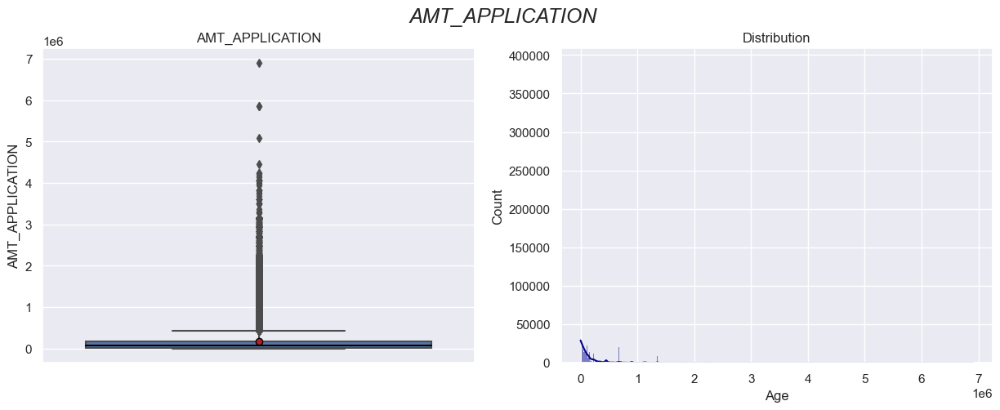

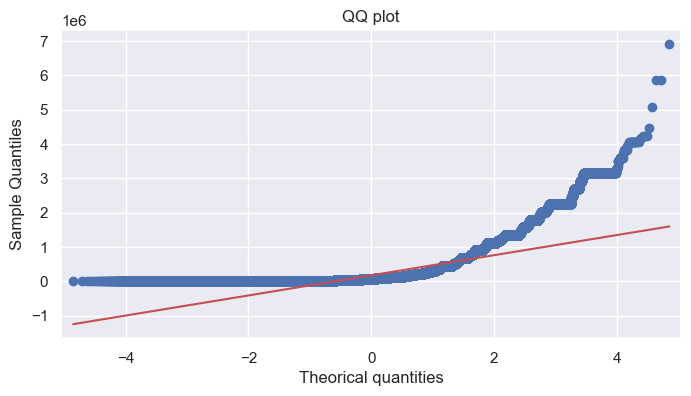

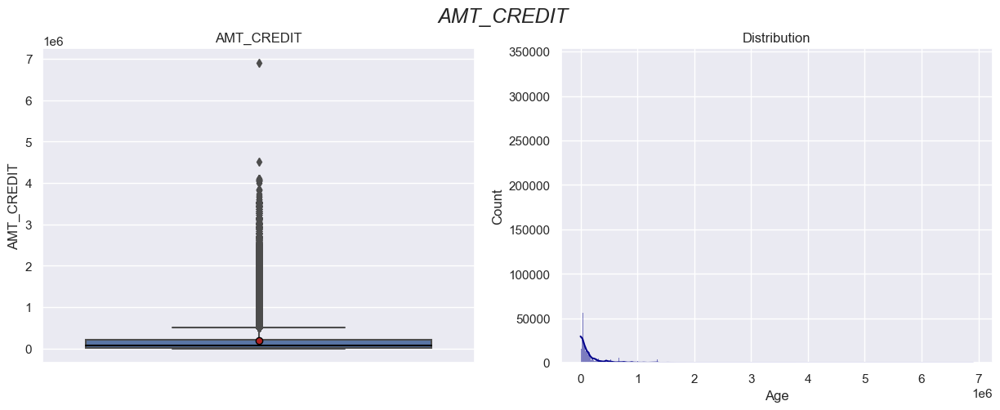

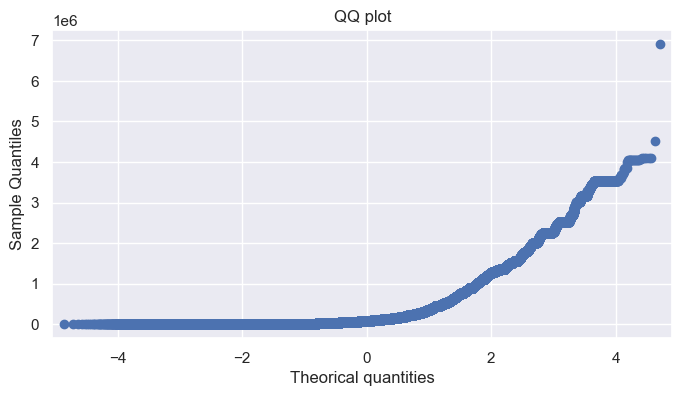

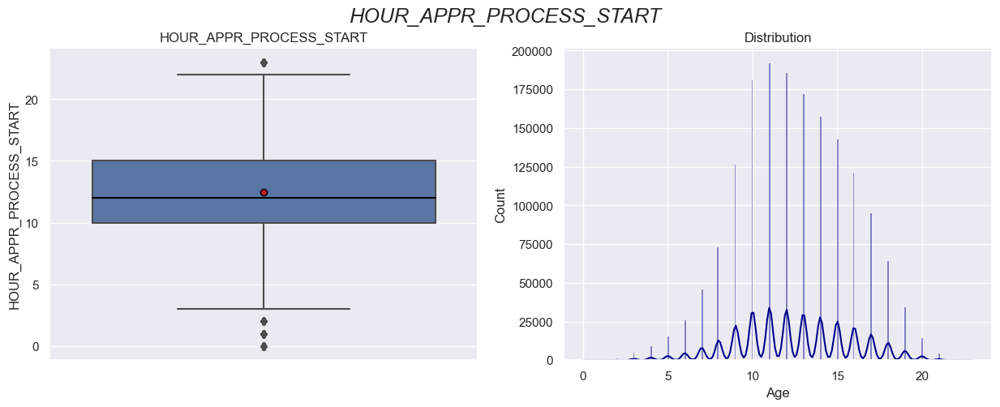

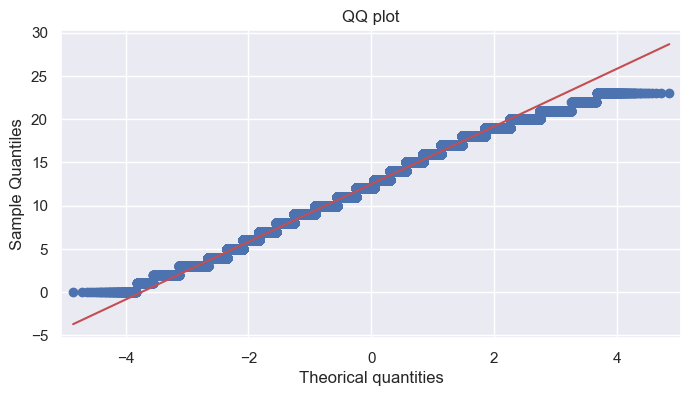

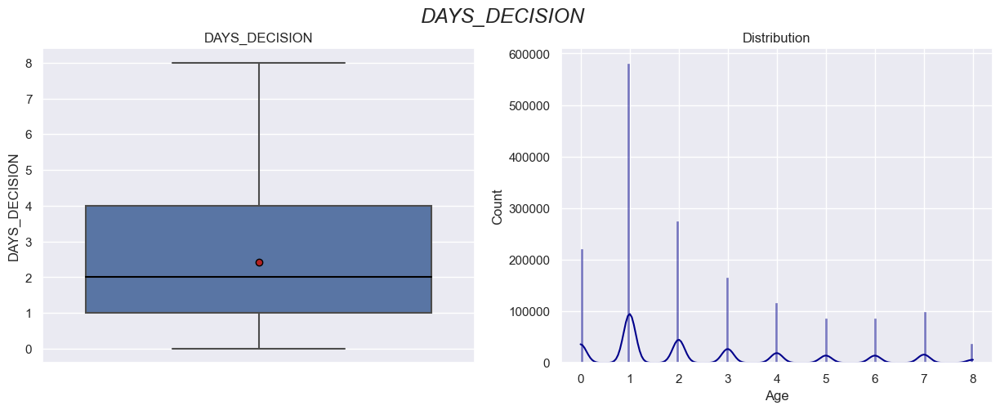

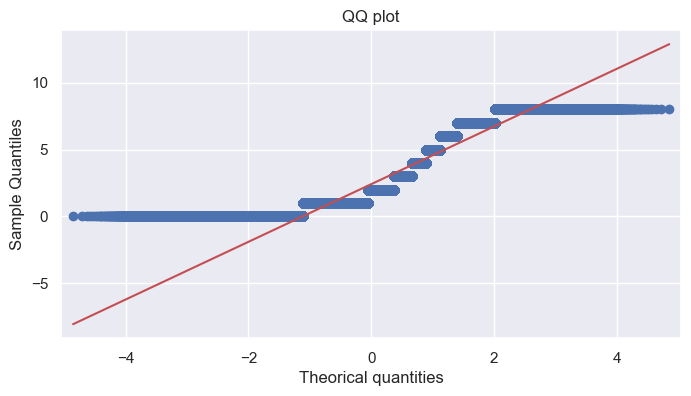

In [231]:
 
for i in var_num:
    plt.figure(figsize = (15,5))
    plt.suptitle(i, fontsize=18, fontstyle='italic')
    plt.subplot(1,2,1)
    # Propriétés graphiques     
    medianprops = {'color':"black"}
    meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    sns.boxplot( y=previous_application[i], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
    plt.title(i)
    plt.ylabel(i)
    plt.subplot(1,2,2)
    sns.histplot(previous_application[i], kde = True, color='Darkblue',discrete=False)
    plt.title("Distribution")
    plt.xlabel('Age')
    plt.show()



    sm.qqplot(previous_application[i], line='s')
    plt.title("QQ plot")
    plt.xlabel('Theorical quantities')


    plt.show()
    

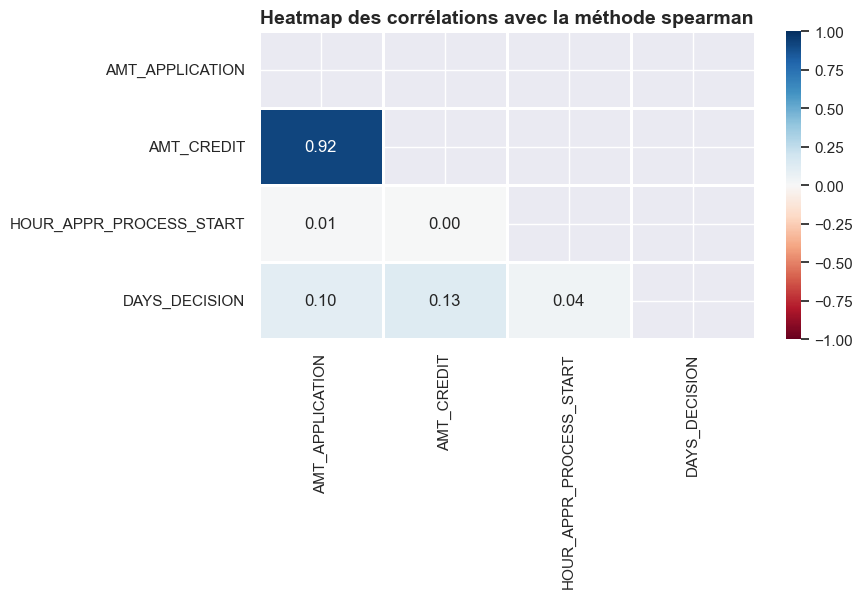

In [232]:
df = previous_application.drop(labels=['SK_ID_CURR', 'SK_ID_PREV'], axis=1).select_dtypes(include=[np.number])

# On centre et on réduit les colonnes
df_stand = (df-df.mean(axis=0))/df.std(axis=0)

correlation_matrice(df_stand,'spearman')

Il y a une corrélation importante (0.92) On supprime 'AMT_APPLICATION'

In [233]:
prev_appli_1 = previous_application.groupby(['SK_ID_CURR'], as_index=False).agg({'SK_ID_PREV': 'count',
                                                                                 'AMT_CREDIT': 'mean',
                                                                                 'HOUR_APPR_PROCESS_START': 'mean',
                                                                                 'DAYS_DECISION': 'mean'})
prev_appli_1.drop(labels=['SK_ID_CURR'], axis=1).describe()

,SK_ID_PREV,AMT_CREDIT,HOUR_APPR_PROCESS_START,DAYS_DECISION
count,"338,810.00","338,810.00","338,810.00","338,810.00"
mean,4.91,"170,062.88",12.67,2.52
std,4.20,"164,996.61",2.78,1.59
min,1.00,0.00,0.00,0.00
25%,2.00,"67,255.71",11.00,1.25
50%,4.00,"117,845.16",12.77,2.06
75%,7.00,"215,889.32",14.50,3.40
max,77.00,"4,050,000.00",23.00,8.00


In [234]:
prev_appli_1 = prev_appli_1.rename(columns={'SK_ID_PREV': 'nb_demande_pret_precedent',
                                            'AMT_CREDIT': 'montant_demande_pret_precedent',
                                            'HOUR_APPR_PROCESS_START': 'heure_demande_pret_precedent',
                                            'DAYS_DECISION': 'nb_year_depuis_decision_precedente'})
#Fusion avec clean_X_train

clean_X_train_join1 = clean_X_train.merge(prev_appli_1, how='left', on='SK_ID_CURR')
clean_X_test_join1 = clean_X_test.merge(prev_appli_1, how='left', on='SK_ID_CURR')
clean_X_train_join1.shape

(307511, 47)

In [235]:
clean_X_train_join1.isna().mean() *100

SK_ID_CURR                           0.00
NAME_CONTRACT_TYPE                   0.00
CODE_GENDER                          0.00
FLAG_OWN_CAR                         0.00
FLAG_OWN_REALTY                      0.00
NAME_TYPE_SUITE                      0.00
NAME_INCOME_TYPE                     0.00
NAME_EDUCATION_TYPE                  0.00
NAME_FAMILY_STATUS                   0.00
NAME_HOUSING_TYPE                    0.00
FLAG_MOBIL                           0.00
FLAG_EMP_PHONE                       0.00
FLAG_WORK_PHONE                      0.00
FLAG_CONT_MOBILE                     0.00
FLAG_PHONE                           0.00
FLAG_EMAIL                           0.00
REGION_RATING_CLIENT                 0.00
REGION_RATING_CLIENT_W_CITY          0.00
WEEKDAY_APPR_PROCESS_START           0.00
REG_REGION_NOT_LIVE_REGION           0.00
REG_REGION_NOT_WORK_REGION           0.00
LIVE_REGION_NOT_WORK_REGION          0.00
REG_CITY_NOT_LIVE_CITY               0.00
REG_CITY_NOT_WORK_CITY            

In [236]:
clean_X_test_join1.isna().mean() *100

SK_ID_CURR                           0.00
NAME_CONTRACT_TYPE                   0.00
CODE_GENDER                          0.00
FLAG_OWN_CAR                         0.00
FLAG_OWN_REALTY                      0.00
NAME_TYPE_SUITE                      0.00
NAME_INCOME_TYPE                     0.00
NAME_EDUCATION_TYPE                  0.00
NAME_FAMILY_STATUS                   0.00
NAME_HOUSING_TYPE                    0.00
FLAG_MOBIL                           0.00
FLAG_EMP_PHONE                       0.00
FLAG_WORK_PHONE                      0.00
FLAG_CONT_MOBILE                     0.00
FLAG_PHONE                           0.00
FLAG_EMAIL                           0.00
REGION_RATING_CLIENT                 0.00
REGION_RATING_CLIENT_W_CITY          0.00
WEEKDAY_APPR_PROCESS_START           0.00
REG_REGION_NOT_LIVE_REGION           0.00
REG_REGION_NOT_WORK_REGION           0.00
LIVE_REGION_NOT_WORK_REGION          0.00
REG_CITY_NOT_LIVE_CITY               0.00
REG_CITY_NOT_WORK_CITY            

Il y a des clients qui n'ont pas fait de demande de prêt auparavant.. On affecte la valeur à 0

In [237]:
var_num = ['nb_demande_pret_precedent', 'montant_demande_pret_precedent', 'heure_demande_pret_precedent', 'nb_year_depuis_decision_precedente']

for var in var_num:
    clean_X_train_join1[var].fillna(0, inplace=True)
    clean_X_test_join1[var].fillna(0, inplace=True)

In [238]:
clean_X_test_join1[var_num].isna().mean() *100, clean_X_train_join1[var_num].isna().mean() *100

(nb_demande_pret_precedent            0.00
 montant_demande_pret_precedent       0.00
 heure_demande_pret_precedent         0.00
 nb_year_depuis_decision_precedente   0.00
 dtype: float64,
 nb_demande_pret_precedent            0.00
 montant_demande_pret_precedent       0.00
 heure_demande_pret_precedent         0.00
 nb_year_depuis_decision_precedente   0.00
 dtype: float64)

### les variables qualitatives

In [239]:
cat_var = previous_application.select_dtypes(exclude=[np.number]).columns.to_list()
print(cat_var)

['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']


In [240]:
# Categorical Variables
def cat_analyzer(dataframe, variable):
    print(variable)
    print(pd.DataFrame({
            "COUNT": dataframe[variable].value_counts(),
            "RATIO": dataframe[variable].value_counts() / len(dataframe) *100}), end="\n\n\n")
    

for i in cat_var:
    cat_analyzer(previous_application, i)

NAME_CONTRACT_TYPE
                  COUNT  RATIO
Cash loans       747147  44.89
Consumer loans   728870  43.79
Revolving loans  187951  11.29
XNA                 346   0.02


WEEKDAY_APPR_PROCESS_START
            COUNT  RATIO
TUESDAY    254289  15.28
WEDNESDAY  253363  15.22
MONDAY     252780  15.19
FRIDAY     251190  15.09
THURSDAY   248311  14.92
SATURDAY   239993  14.42
SUNDAY     164388   9.88


FLAG_LAST_APPL_PER_CONTRACT
     COUNT  RATIO
Y  1660953  99.80
N     3361   0.20


NAME_CASH_LOAN_PURPOSE
                                   COUNT  RATIO
XAP                               917167  55.11
XNA                               677576  40.71
Repairs                            23750   1.43
Other                              15589   0.94
Urgent needs                        8400   0.50
Buying a used car                   2888   0.17
Building a house or an annex        2693   0.16
Everyday expenses                   2412   0.14
Medicine                            2174   0.13
Payments

Toutes les variables qui ont des valeurs manquantes (XNA) sont écartées.
Seules 2 variables semblent interessantes pour la suite : NAME_CONTRACT_STATUS et NAME_CONTRACT_TYPE.

#### Statut du contrat (actif signé,...) de crédit précédent

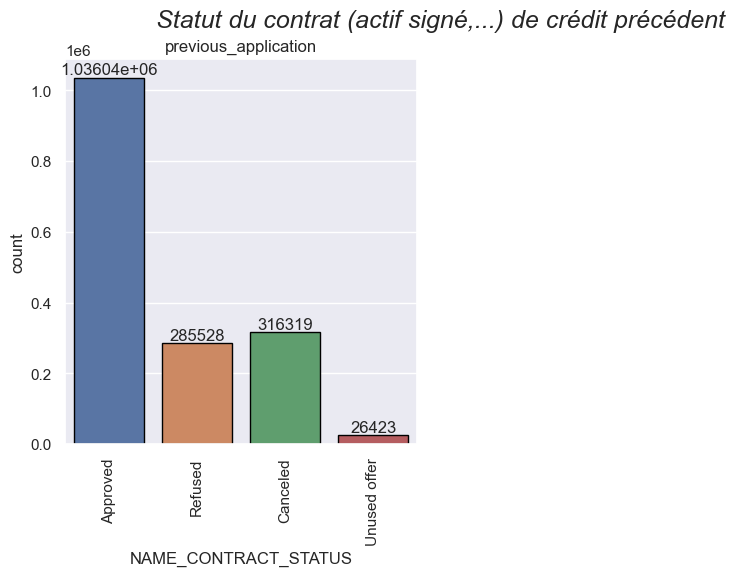

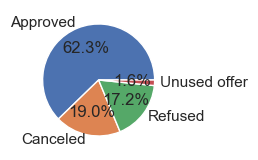

In [241]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Statut du contrat (actif signé,...) de crédit précédent", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=previous_application, x="NAME_CONTRACT_STATUS", edgecolor="black")
ax.bar_label(ax.containers[0])
plt.title('previous_application')
plt.xticks(rotation=90)

plt.show()
plt.subplot(2,2,1)

type_count = previous_application['NAME_CONTRACT_STATUS'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['NAME_CONTRACT_STATUS'], autopct='%.1f%%')

plt.show()

#### Type de contrat de crédit (Prêt de trésorerie, prêt à la consommation [POS],...) de la demande précédente

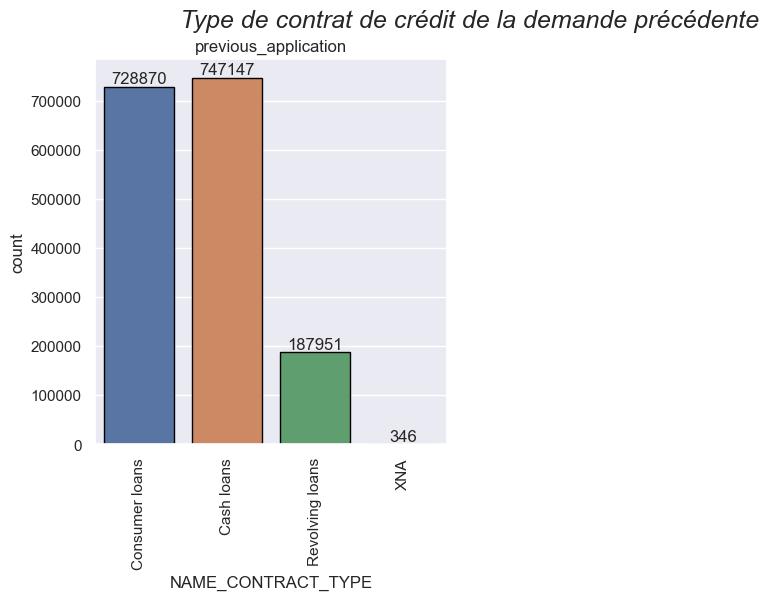

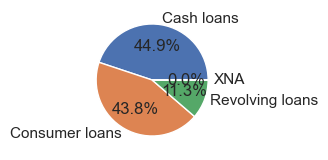

In [242]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Type de contrat de crédit de la demande précédente", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=previous_application, x="NAME_CONTRACT_TYPE", edgecolor="black")
ax.bar_label(ax.containers[0])
plt.title('previous_application')
plt.xticks(rotation=90)

plt.show()
plt.subplot(2,2,1)

type_count = previous_application['NAME_CONTRACT_TYPE'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['NAME_CONTRACT_TYPE'], autopct='%.1f%%')

plt.show()

In [243]:
map_contrat_type = {'Cash loans': 'cash_loans',
                    'Consumer loans': 'consumer_loans',
                    'Revolving loans': 'revolving_loans',
                    'XNA': 'revolving_loans'}

previous_application['NAME_CONTRACT_TYPE'] = previous_application['NAME_CONTRACT_TYPE'].map(map_contrat_type)

In [244]:
prev_appli_2 = previous_application[['SK_ID_CURR', 'NAME_CONTRACT_TYPE','NAME_CONTRACT_STATUS']]
prev_appli_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1664314 entries, 0 to 1670213
Data columns (total 3 columns):
 #   Column                Non-Null Count    Dtype 
---  ------                --------------    ----- 
 0   SK_ID_CURR            1664314 non-null  int64 
 1   NAME_CONTRACT_TYPE    1664314 non-null  object
 2   NAME_CONTRACT_STATUS  1664314 non-null  object
dtypes: int64(1), object(2)
memory usage: 50.8+ MB


### Quantification des variables catégorielles

Les données catégorielles ne sont pas utilisables avec tous les algotithmes de Machine Learning. C'est la raison pour laquelle nous devons donc les quantifier.

Les variables catégorielles ordinales, peuvent être remplacées par une valeur chiffrée. Ce sont des variables catégorielles dont les valeurs suivent un ordre naturel.

Pour les variables catégorielles nominales  Pour ces variables non ordonnées, on va utiliser la "dummification" qui va créer des dummy variables. La variable initiale est alors remplacée par un ensemble de nouvelles variables dites fictives (ou indicatrices) prenant les valeurs 0 ou 1 pour indiquer l'absence ou la présence de la modalité. Néanmoins, pour éviter la multicolinéarité qui se produit lorsque un ensemble exhaustif de variables fictives et le terme constant sont présents, ce qu'on appelle le piège à variable fictive, il est impératif de supprimer soit le terme constant, soit l'une des indicatrices incriminées. La variable fictive retirée devient alors la catégorie de base à laquelle les autres catégories sont comparées.

In [245]:
prev_appli_2 = pd.get_dummies(prev_appli_2,
                              columns=["NAME_CONTRACT_STATUS",
                                       "NAME_CONTRACT_TYPE"],
                              prefix={'NAME_CONTRACT_STATUS': 'prev_contrat_statut',
                                      'NAME_CONTRACT_TYPE': 'prev_contrat_type'},
                              drop_first=True)

In [246]:
prev_appli_2.head()

,SK_ID_CURR,prev_contrat_statut_Canceled,prev_contrat_statut_Refused,prev_contrat_statut_Unused offer,prev_contrat_type_consumer_loans,prev_contrat_type_revolving_loans
0,271877,0,0,0,1,0
1,108129,0,0,0,0,0
2,122040,0,0,0,0,0
3,176158,0,0,0,0,0
4,202054,0,1,0,0,0


In [247]:
prev_appli_2 = prev_appli_2.groupby(['SK_ID_CURR'], as_index=False).sum()

In [248]:
prev_appli_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 338810 entries, 0 to 338809
Data columns (total 6 columns):
 #   Column                             Non-Null Count   Dtype
---  ------                             --------------   -----
 0   SK_ID_CURR                         338810 non-null  int64
 1   prev_contrat_statut_Canceled       338810 non-null  uint8
 2   prev_contrat_statut_Refused        338810 non-null  uint8
 3   prev_contrat_statut_Unused offer   338810 non-null  uint8
 4   prev_contrat_type_consumer_loans   338810 non-null  uint8
 5   prev_contrat_type_revolving_loans  338810 non-null  uint8
dtypes: int64(1), uint8(5)
memory usage: 4.2 MB


In [249]:
liste_var = prev_appli_2.drop(labels='SK_ID_CURR', axis=1).columns.to_list()
print(liste_var)

['prev_contrat_statut_Canceled', 'prev_contrat_statut_Refused', 'prev_contrat_statut_Unused offer', 'prev_contrat_type_consumer_loans', 'prev_contrat_type_revolving_loans']


In [250]:
#Fusion avec clean_X_train_join1

clean_X_train_join2 = clean_X_train_join1.merge(prev_appli_2, how='left', on='SK_ID_CURR')
#Fusion avec clean_X_test_join1

clean_X_test_join2 = clean_X_test_join1.merge(prev_appli_2, how='left', on='SK_ID_CURR')

clean_X_train_join2.shape

(307511, 52)

In [251]:
clean_X_train_join2[liste_var].isna().mean() *100

prev_contrat_statut_Canceled        5.36
prev_contrat_statut_Refused         5.36
prev_contrat_statut_Unused offer    5.36
prev_contrat_type_consumer_loans    5.36
prev_contrat_type_revolving_loans   5.36
dtype: float64

In [252]:
for var in liste_var:
    clean_X_train_join2[var].fillna(0, inplace=True)
    clean_X_test_join2[var].fillna(0, inplace=True)

In [253]:
clean_X_train_join2.shape, clean_X_test_join2.shape

((307511, 52), (48744, 51))

## installments_payments

### Historique de remboursement des crédits précédents

In [254]:
installments_payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB


In [255]:
missing_values(installments_payments)

,Total,%
DAYS_ENTRY_PAYMENT,2905,0.02
AMT_PAYMENT,2905,0.02
SK_ID_PREV,0,0.00
SK_ID_CURR,0,0.00
NUM_INSTALMENT_VERSION,0,0.00
NUM_INSTALMENT_NUMBER,0,0.00
DAYS_INSTALMENT,0,0.00
AMT_INSTALMENT,0,0.00


Je remplace les valeurs manquantes par 0

In [256]:
liste_var = ['DAYS_ENTRY_PAYMENT', 'AMT_PAYMENT']

for var in liste_var:
    installments_payments[var].fillna(0, inplace=True)

In [257]:
installments_payments.drop(labels=['SK_ID_CURR', 'SK_ID_PREV'], axis=1).describe()

,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,"13,605,401.00","13,605,401.00","13,605,401.00","13,605,401.00","13,605,401.00","13,605,401.00"
mean,0.86,18.87,"-1,042.27","-1,050.89","17,050.91","17,234.54"
std,1.04,26.66,800.95,800.65,"50,570.25","54,730.52"
min,0.00,1.00,"-2,922.00","-4,921.00",0.00,0.00
25%,0.00,4.00,"-1,654.00","-1,662.00","4,226.09","3,394.17"
50%,1.00,8.00,-818.00,-827.00,"8,884.08","8,122.19"
75%,1.00,19.00,-361.00,-370.00,"16,710.21","16,105.91"
max,178.00,277.00,-1.00,0.00,"3,771,487.85","3,771,487.85"


In [258]:
# transformation en années
installments_payments['DAYS_INSTALMENT'] = round(installments_payments['DAYS_INSTALMENT'] / -365, 0)
installments_payments['DAYS_ENTRY_PAYMENT'] = round(installments_payments['DAYS_ENTRY_PAYMENT'] / -365, 0)

In [259]:
# aggregation 

ins_payments = installments_payments.groupby(['SK_ID_CURR'], as_index=False).agg({'NUM_INSTALMENT_VERSION': 'nunique',
                                                                                  'NUM_INSTALMENT_NUMBER': 'sum', 
                                                                                  'DAYS_INSTALMENT': 'mean', 
                                                                                  'DAYS_ENTRY_PAYMENT': 'mean',
                                                                                  'AMT_INSTALMENT': 'sum',
                                                                                  'AMT_PAYMENT': 'sum'})
ins_payments.drop(labels='SK_ID_CURR', axis=1).describe()

,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,"339,587.00","339,587.00","339,587.00","339,587.00","339,587.00","339,587.00"
mean,2.30,756.05,2.48,2.51,"683,136.95","690,494.23"
std,1.87,"1,892.40",1.66,1.65,"893,380.54","930,897.69"
min,1.00,1.00,0.00,0.00,0.00,0.00
25%,1.00,62.00,1.10,1.14,"136,683.36","133,200.74"
50%,2.00,156.00,2.16,2.19,"334,395.22","324,803.52"
75%,3.00,440.50,3.56,3.59,"857,772.74","849,730.91"
max,59.00,"43,919.00",8.00,8.00,"32,479,781.27","32,689,281.51"


In [260]:
# Montant payé vs Montant attendu
# Le client a-t-il réglé toutes ces mensualités attendues des crédits précédents ?


ins_payments['montant_paye_vs_du'] = np.where(ins_payments['AMT_INSTALMENT'] != 0,
                                                   ins_payments['AMT_PAYMENT'] / ins_payments['AMT_INSTALMENT'] * 100, 0)

ins_payments['montant_paye_vs_du'].describe()

count   339,587.00
mean         99.34
std          13.71
min           0.00
25%          96.24
50%         100.00
75%         100.00
max         548.51
Name: montant_paye_vs_du, dtype: float64

In [261]:
ins_payments[ins_payments['montant_paye_vs_du'] > 100]

,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT,montant_paye_vs_du
11,100012,4,434,1.77,1.83,"460,056.15","501,661.71",109.04
18,100019,3,34,2.00,2.00,"120,723.75","165,093.03",136.75
31,100034,4,26,1.10,1.20,"252,855.76","311,355.77",123.14
36,100039,8,74,3.38,3.48,"1,715,314.50","2,305,501.79",134.41
56,100060,4,17,1.00,1.00,"218,546.55","308,546.55",141.18
...,...,...,...,...,...,...,...,...
339533,456201,5,19,0.78,0.78,"240,004.17","352,504.17",146.87
339534,456202,5,112,0.76,0.80,"436,163.67","491,657.67",112.72
339539,456207,3,11,0.00,0.00,"147,171.46","187,671.46",127.52
339559,456227,3,286,3.76,3.80,"552,528.85","583,354.93",105.58


In [262]:
# Days past due and days before due (no negative values)
ins_payments['days_past_due'] = ins_payments['DAYS_ENTRY_PAYMENT'] - ins_payments['DAYS_INSTALMENT']
ins_payments['days_before_due'] = ins_payments['DAYS_INSTALMENT'] - ins_payments['DAYS_ENTRY_PAYMENT']
ins_payments['days_past_due'] = ins_payments['days_past_due'].apply(lambda x: x if x > 0 else 0)
ins_payments['days_before_due'] = ins_payments['days_before_due'].apply(lambda x: x if x > 0 else 0)

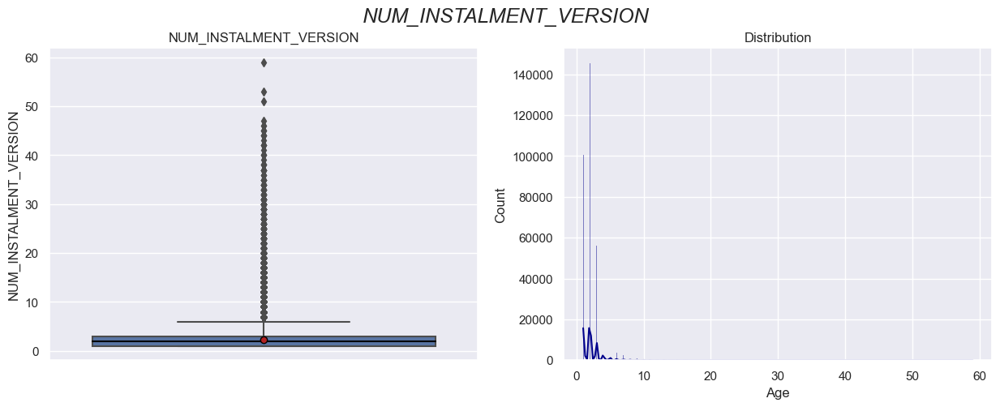

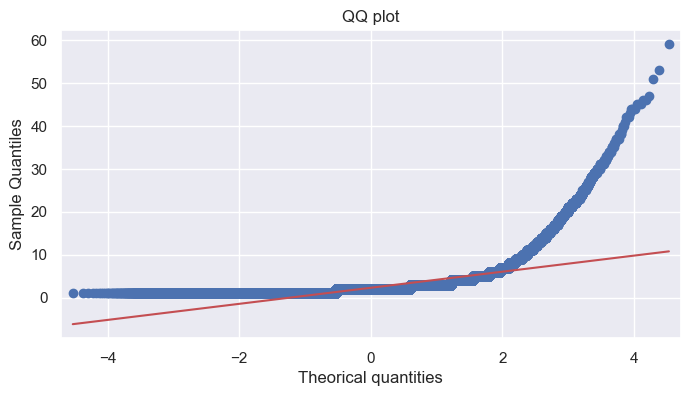

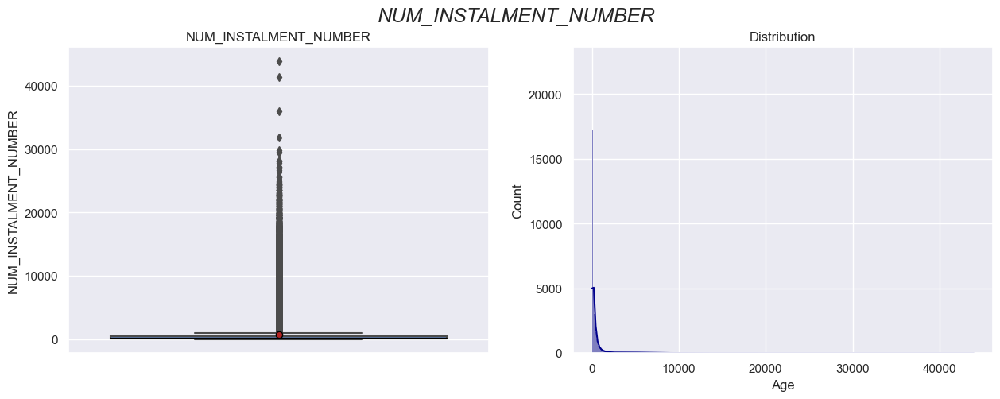

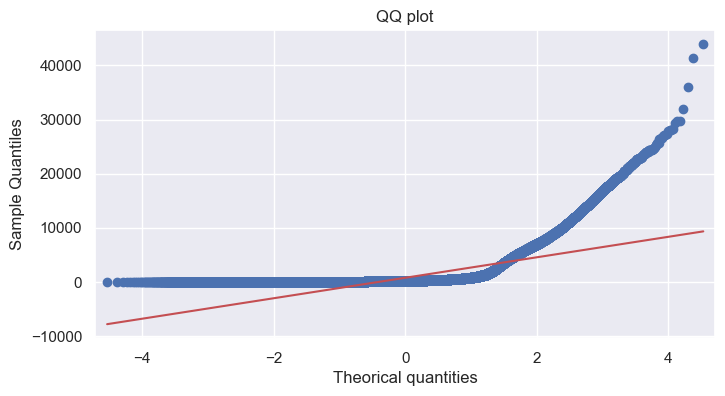

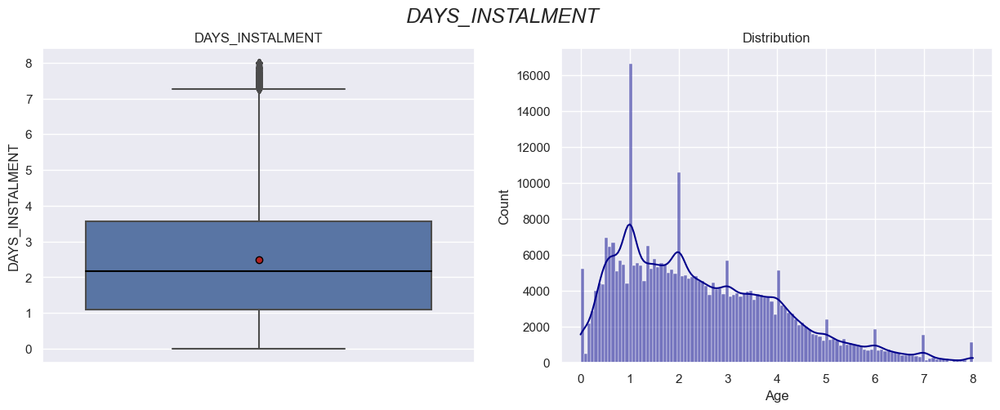

...

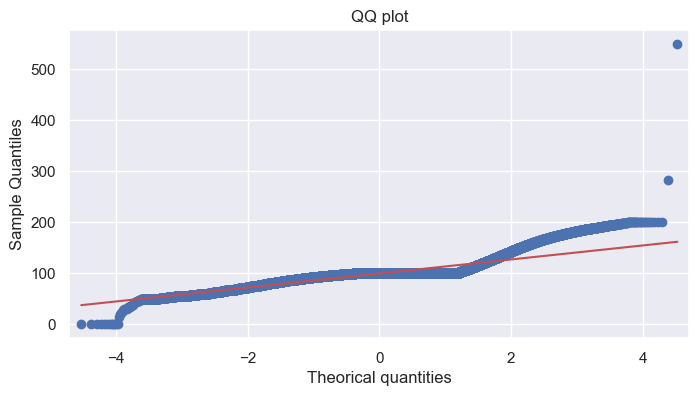

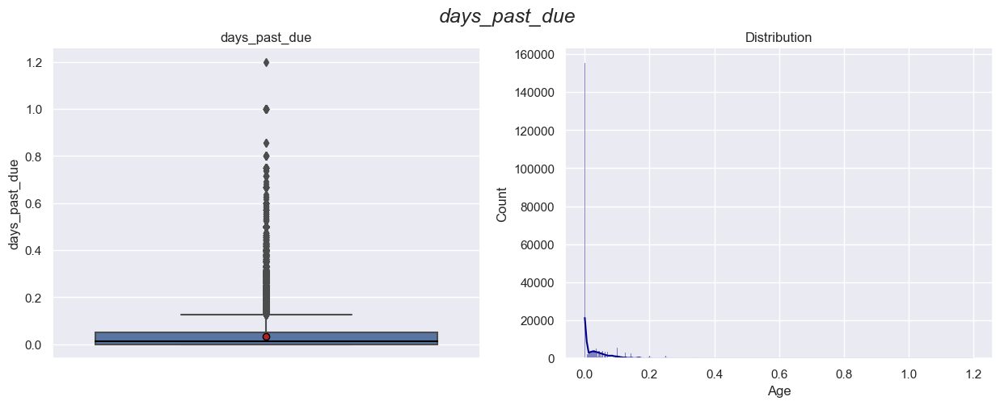

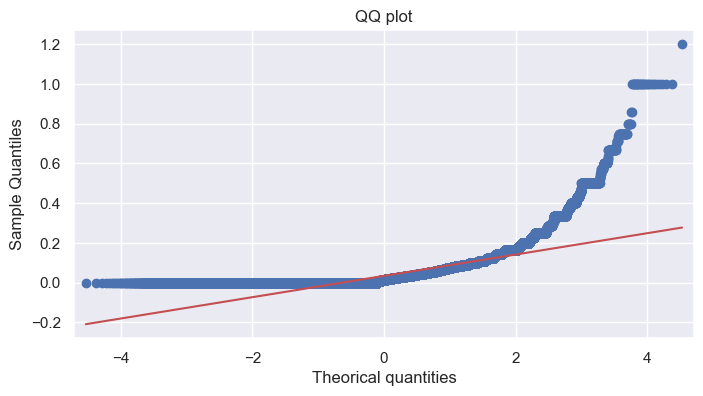

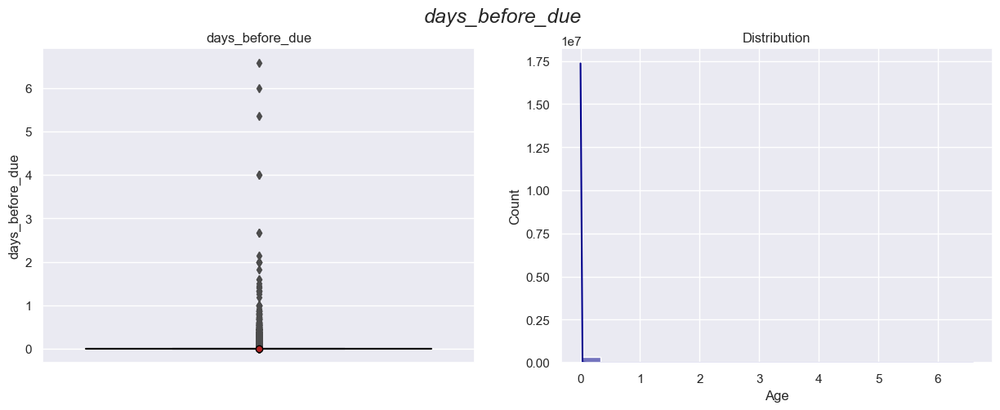

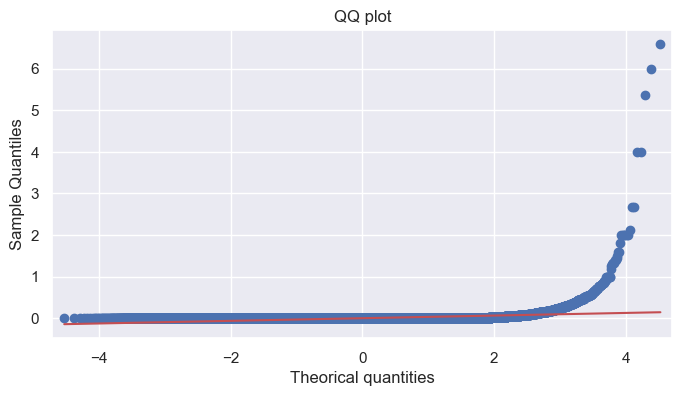

In [263]:
var_num = ['NUM_INSTALMENT_VERSION', 'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 
           'DAYS_ENTRY_PAYMENT', 'AMT_INSTALMENT','AMT_PAYMENT', 'montant_paye_vs_du',
           'days_past_due', 'days_before_due']
for i in var_num:
    plt.figure(figsize = (15,5))
    plt.suptitle(i, fontsize=18, fontstyle='italic')
    plt.subplot(1,2,1)
    # Propriétés graphiques     
    medianprops = {'color':"black"}
    meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    sns.boxplot( y=ins_payments[i], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
    plt.title(i)
    plt.ylabel(i)
    plt.subplot(1,2,2)
    sns.histplot(ins_payments[i], kde = True, color='Darkblue',discrete=False)
    plt.title("Distribution")
    plt.xlabel('Age')
    plt.show()


    sm.qqplot(ins_payments[i], line='s')
    plt.title("QQ plot")
    plt.xlabel('Theorical quantities')


    plt.show()
    

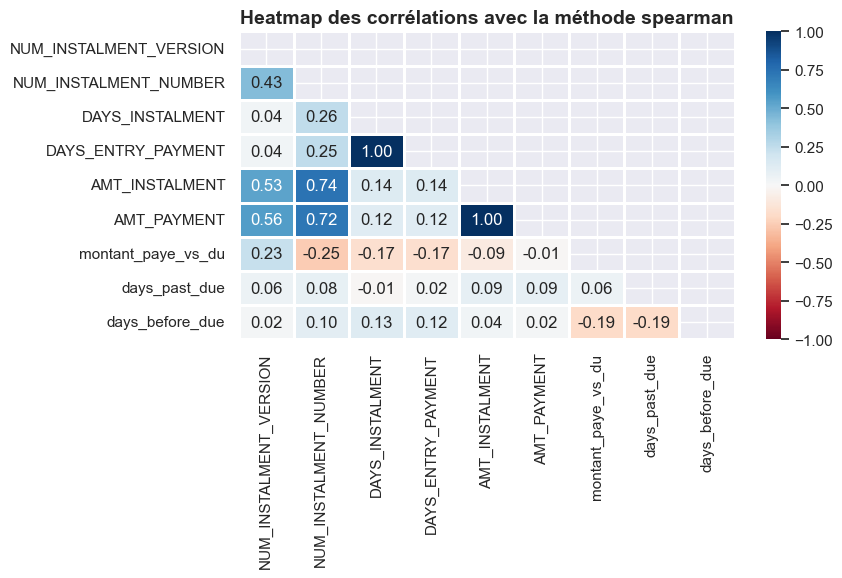

In [264]:
df = ins_payments.drop(labels=['SK_ID_CURR'], axis=1).select_dtypes(include=[np.number])

# On centre et on réduit les colonnes
df_stand = (df-df.mean(axis=0))/df.std(axis=0)

correlation_matrice(df_stand,'spearman')

In [265]:
ins_payments.drop(columns=['DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT', 'AMT_INSTALMENT'], axis=1, inplace=True)

In [266]:
ins_payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 339587 entries, 0 to 339586
Data columns (total 7 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   SK_ID_CURR              339587 non-null  int64  
 1   NUM_INSTALMENT_VERSION  339587 non-null  int64  
 2   NUM_INSTALMENT_NUMBER   339587 non-null  int64  
 3   AMT_PAYMENT             339587 non-null  float64
 4   montant_paye_vs_du      339587 non-null  float64
 5   days_past_due           339587 non-null  float64
 6   days_before_due         339587 non-null  float64
dtypes: float64(4), int64(3)
memory usage: 18.1 MB


In [267]:
#Fusion avec clean_X_train_join2

clean_X_train_join3 = clean_X_train_join2.merge(ins_payments, how='left', on='SK_ID_CURR')

#Fusion avec clean_X_test_join2

clean_X_test_join3 = clean_X_test_join2.merge(ins_payments, how='left', on='SK_ID_CURR')


In [268]:
missing_values(clean_X_train_join3)

,Total,%
days_before_due,15868,5.16
days_past_due,15868,5.16
montant_paye_vs_du,15868,5.16
AMT_PAYMENT,15868,5.16
NUM_INSTALMENT_NUMBER,15868,5.16
NUM_INSTALMENT_VERSION,15868,5.16
population_region,0,0.00
anciennete_cid,0,0.00
year_registration,0,0.00
anciennete_entreprise,0,0.00


In [269]:
 clean_X_train_join3.fillna(0, inplace=True)

In [270]:
# vérification
clean_X_train_join3.isna().sum().sum()

0

In [271]:
# idem pour clean_X_test_join3

missing_values(clean_X_test_join3)

,Total,%
days_before_due,800,1.64
days_past_due,800,1.64
montant_paye_vs_du,800,1.64
AMT_PAYMENT,800,1.64
NUM_INSTALMENT_NUMBER,800,1.64
NUM_INSTALMENT_VERSION,800,1.64
heure_demande_pret,0,0.00
nb_mensualites,0,0.00
total_revenus,0,0.00
montant_credit,0,0.00


In [272]:
 clean_X_test_join3.fillna(0, inplace=True)

In [273]:
clean_X_test_join3.isna().sum().sum()

0

In [274]:
clean_X_train_join3.shape, clean_X_test_join3.shape

((307511, 58), (48744, 57))

## bureau

### Les Crédits antérieurs enregistrés au bureau du crédit


Il s'agit d'informations concernant les crédits antérieurs du client fournis par d'autres institutions financières et signalés au bureau de crédit

In [275]:
bureau.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB


In [276]:
missing_values(bureau)

,Total,%
AMT_ANNUITY,1226791,71.47
AMT_CREDIT_MAX_OVERDUE,1124488,65.51
DAYS_ENDDATE_FACT,633653,36.92
AMT_CREDIT_SUM_LIMIT,591780,34.48
AMT_CREDIT_SUM_DEBT,257669,15.01
DAYS_CREDIT_ENDDATE,105553,6.15
CREDIT_ACTIVE,0,0.00
CREDIT_CURRENCY,0,0.00
DAYS_CREDIT,0,0.00
CREDIT_DAY_OVERDUE,0,0.00


In [277]:
# Suppression des variables avec valeurs manquantes

var_to_drop=['DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE',
             'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT', 'AMT_ANNUITY']

bureau.drop(labels=var_to_drop, axis=1, inplace= True)

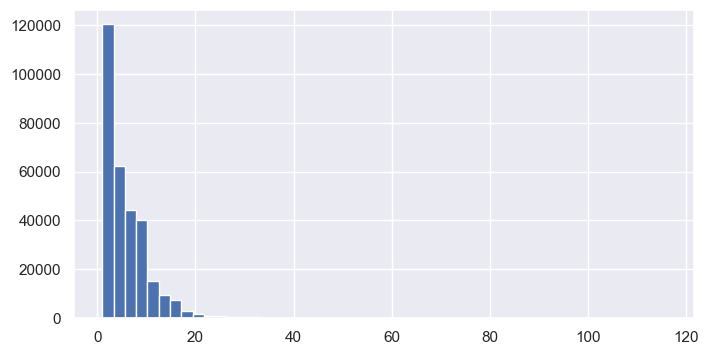

median     4.00
mean       5.61
max      116.00
min        1.00
std        4.43
Name: SK_ID_BUREAU, dtype: float64

In [278]:
# Nombre de prêts des clients enregistrés au bureau du crédit
bureau.groupby("SK_ID_CURR").SK_ID_BUREAU.count().hist(bins=50), plt.show()
bureau.groupby("SK_ID_CURR").SK_ID_BUREAU.count().agg({"min", "max", "mean", "median", "std"})

### Les variables qualitatives

In [279]:
cat_var = bureau.select_dtypes(exclude=[np.number]).columns.to_list()
print(cat_var)

['CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'CREDIT_TYPE']


In [280]:
# Categorical Variables
def cat_analyzer(dataframe, variable):
    print(variable)
    print(pd.DataFrame({
            "COUNT": dataframe[variable].value_counts(),
            "RATIO": dataframe[variable].value_counts() / len(dataframe) *100}), end="\n\n\n")
    

for i in cat_var:
    cat_analyzer(bureau, i)

CREDIT_ACTIVE
            COUNT  RATIO
Closed    1079273  62.88
Active     630607  36.74
Sold         6527   0.38
Bad debt       21   0.00


CREDIT_CURRENCY
              COUNT  RATIO
currency 1  1715020  99.92
currency 2     1224   0.07
currency 3      174   0.01
currency 4       10   0.00


CREDIT_TYPE
                                                COUNT  RATIO
Consumer credit                               1251615  72.92
Credit card                                    402195  23.43
Car loan                                        27690   1.61
Mortgage                                        18391   1.07
Microloan                                       12413   0.72
Loan for business development                    1975   0.12
Another type of loan                             1017   0.06
Unknown type of loan                              555   0.03
Loan for working capital replenishment            469   0.03
Cash loan (non-earmarked)                          56   0.00
Real estate loan       

CREDIT_CURRENCY est inutile pour la modélisation. Presque toutes les lignes sont de catégorie devise 1.  
CREDIT_ACTIVE est conservé. Il y a deux catégories rares dans cette colonne : sold (la créance a été vendue) et Bad debt (la créance est irrécouvrable).
    Nous pouvons combiner ces deux catégories afin d'attribuer une nouvelle catégorie en tant que Sold_BadDebt.
    
La variable CREDIT_ACTIVE comprend 3 catégories comme Actif, Fermé et Sold_BadDebt.  


CREDIT_TYPE est conservé , mais faut réduire le nombre de catégories en regroupant toutes les modalités à faible effectif dans une modalité "autres".

In [281]:
bureau.drop(columns=['CREDIT_CURRENCY'], axis=1, inplace=True)

In [282]:
map_credit_active = {'Closed': 'closed',
                     'Active': 'active',
                     'Sold': 'sold_bad_debt',
                     'Bad debt': 'sold_bad_debt'}

bureau['CREDIT_ACTIVE'] = bureau['CREDIT_ACTIVE'].map(map_credit_active)

In [283]:
map_credit_type = {"Consumer credit": "consumer_credit",
                   "Credit card": "credit_card",
                   "Car loan" : "other_credit",
                   "Mortgage" : "other_credit",
                   "Microloan" : "other_credit",
                   "Loan for business development" : "other_credit",
                   "Another type of loan" : "other_credit",
                   "Unknown type of loan" : "other_credit",
                   "Loan for working capital replenishment" : "other_credit",
                   "Cash loan (non-earmarked)" : "other_credit",
                   "Real estate loan" : "other_credit",
                   "Loan for the purchase of equipment" : "other_credit",
                   "Loan for purchase of shares (margin lending)" : "other_credit",
                   "Mobile operator loan" : "other_credit",
                   "Interbank credit" : "other_credit"}

bureau['CREDIT_TYPE'] = bureau['CREDIT_TYPE'].map(map_credit_type)

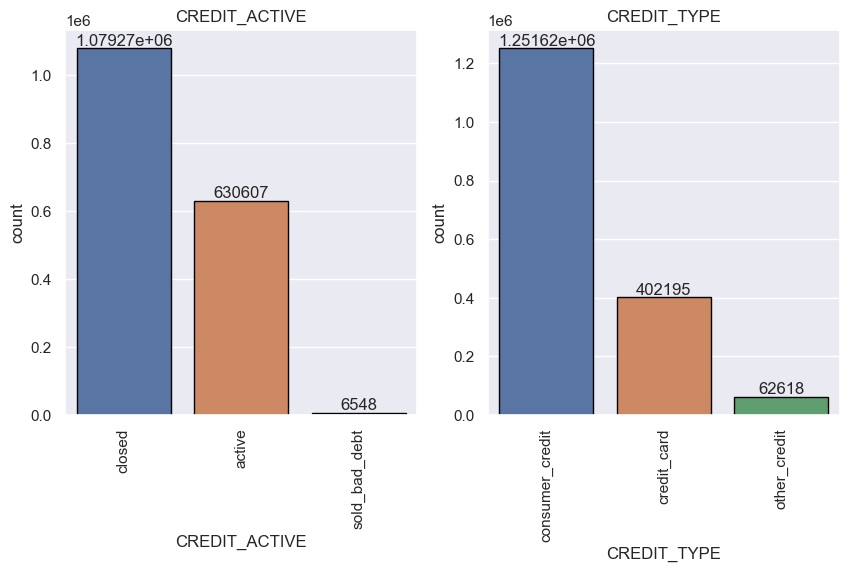

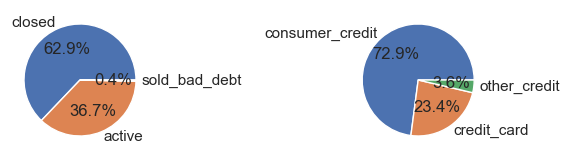

In [284]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)

ax=sns.countplot(data=bureau, x="CREDIT_ACTIVE", edgecolor="black")

ax.bar_label(ax.containers[0])
plt.title('CREDIT_ACTIVE')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
ax=sns.countplot(data=bureau, x="CREDIT_TYPE", edgecolor="black") 
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title('CREDIT_TYPE')
plt.show()
plt.subplot(2,2,1)

type_count = bureau['CREDIT_ACTIVE'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['CREDIT_ACTIVE'], autopct='%.1f%%')
plt.subplot(2,2,2)

type_count = bureau['CREDIT_TYPE'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['CREDIT_TYPE'], autopct='%.1f%%')


plt.show()

In [285]:
bureau = pd.get_dummies(bureau,
                        columns=["CREDIT_ACTIVE",
                                 "CREDIT_TYPE"],
                        prefix={'CREDIT_ACTIVE': 'bureau_credit_actif',
                                'CREDIT_TYPE': 'bureau_credit_type'},
                       drop_first=True)

In [286]:
bureau.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 12 columns):
 #   Column                             Dtype  
---  ------                             -----  
 0   SK_ID_CURR                         int64  
 1   SK_ID_BUREAU                       int64  
 2   DAYS_CREDIT                        int64  
 3   CREDIT_DAY_OVERDUE                 int64  
 4   CNT_CREDIT_PROLONG                 int64  
 5   AMT_CREDIT_SUM                     float64
 6   AMT_CREDIT_SUM_OVERDUE             float64
 7   DAYS_CREDIT_UPDATE                 int64  
 8   bureau_credit_actif_closed         uint8  
 9   bureau_credit_actif_sold_bad_debt  uint8  
 10  bureau_credit_type_credit_card     uint8  
 11  bureau_credit_type_other_credit    uint8  
dtypes: float64(2), int64(6), uint8(4)
memory usage: 111.3 MB


### Les variables numériques

AMT_CREDIT_SUM : Montant actuel du crédit enregistré au bureau de crédit
CREDIT_DAY_OVERDUE  :Nombre de jours d'impayés sur crédit CB  pendant le crédit en cours
AMT_CREDIT_SUM_OVERDUE : Montant actuel en souffrance sur le crédit du bureau de crédit 
CNT_CREDIT_PROLONG : Combien de fois le crédit a été prolongé ?
DAYS_CREDIT_UPDATE : Combien de  jours d'attente avant l'arrivée de la dernière information du bureau des crédits

In [287]:
# Les variables numériques
var_num = bureau.drop(labels=['SK_ID_CURR', 'SK_ID_BUREAU'], axis=1).select_dtypes(include=[np.number]).columns.to_list()
print(var_num)

['DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_OVERDUE', 'DAYS_CREDIT_UPDATE', 'bureau_credit_actif_closed', 'bureau_credit_actif_sold_bad_debt', 'bureau_credit_type_credit_card', 'bureau_credit_type_other_credit']


In [288]:
var_num = ['DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_OVERDUE', 'DAYS_CREDIT_UPDATE']

bureau[var_num].describe([.01, .1, .25, .5, .75, .8, .9, .95, .99])[1:].T

,mean,std,min,1%,10%,25%,50%,75%,80%,90%,95%,99%,max
DAYS_CREDIT,"-1,142.11",795.16,"-2,922.00","-2,867.00","-2,443.00","-1,666.00",-987.00,-474.00,-385.00,-215.00,-125.00,-38.00,0.00
CREDIT_DAY_OVERDUE,0.82,36.54,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,"2,792.00"
CNT_CREDIT_PROLONG,0.01,0.10,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,9.00
AMT_CREDIT_SUM,"354,994.59","1,149,811.34",0.00,0.00,"22,500.00","51,300.00","125,518.50","315,000.00","423,000.00","778,754.74","1,350,000.00","3,700,916.10","585,000,000.00"
AMT_CREDIT_SUM_OVERDUE,37.91,"5,937.65",0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,"3,756,681.00"
DAYS_CREDIT_UPDATE,-593.75,720.75,"-41,947.00","-2,531.00","-1,561.00",-908.00,-395.00,-33.00,-25.00,-13.00,-8.00,-3.00,372.00


In [289]:
bureau[var_num].describe().T

,count,mean,std,min,25%,50%,75%,max
DAYS_CREDIT,"1,716,428.00","-1,142.11",795.16,"-2,922.00","-1,666.00",-987.00,-474.00,0.00
CREDIT_DAY_OVERDUE,"1,716,428.00",0.82,36.54,0.00,0.00,0.00,0.00,"2,792.00"
CNT_CREDIT_PROLONG,"1,716,428.00",0.01,0.10,0.00,0.00,0.00,0.00,9.00
AMT_CREDIT_SUM,"1,716,415.00","354,994.59","1,149,811.34",0.00,"51,300.00","125,518.50","315,000.00","585,000,000.00"
AMT_CREDIT_SUM_OVERDUE,"1,716,428.00",37.91,"5,937.65",0.00,0.00,0.00,0.00,"3,756,681.00"
DAYS_CREDIT_UPDATE,"1,716,428.00",-593.75,720.75,"-41,947.00",-908.00,-395.00,-33.00,372.00


Il y a beaucoup de valeurs nulles dans certaines variables. Je ne les garde pas pour la suite.

In [290]:
var_to_drop = ['CREDIT_DAY_OVERDUE', 'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM_OVERDUE']

bureau.drop(labels=var_to_drop, axis=1, inplace= True)

bureau.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 9 columns):
 #   Column                             Dtype  
---  ------                             -----  
 0   SK_ID_CURR                         int64  
 1   SK_ID_BUREAU                       int64  
 2   DAYS_CREDIT                        int64  
 3   AMT_CREDIT_SUM                     float64
 4   DAYS_CREDIT_UPDATE                 int64  
 5   bureau_credit_actif_closed         uint8  
 6   bureau_credit_actif_sold_bad_debt  uint8  
 7   bureau_credit_type_credit_card     uint8  
 8   bureau_credit_type_other_credit    uint8  
dtypes: float64(1), int64(4), uint8(4)
memory usage: 72.0 MB


In [291]:
# passe en années
bureau['DAYS_CREDIT'] = round(bureau['DAYS_CREDIT'] / -365, 0)
bureau['DAYS_CREDIT_UPDATE'] = round(bureau['DAYS_CREDIT_UPDATE'] / -365, 0)

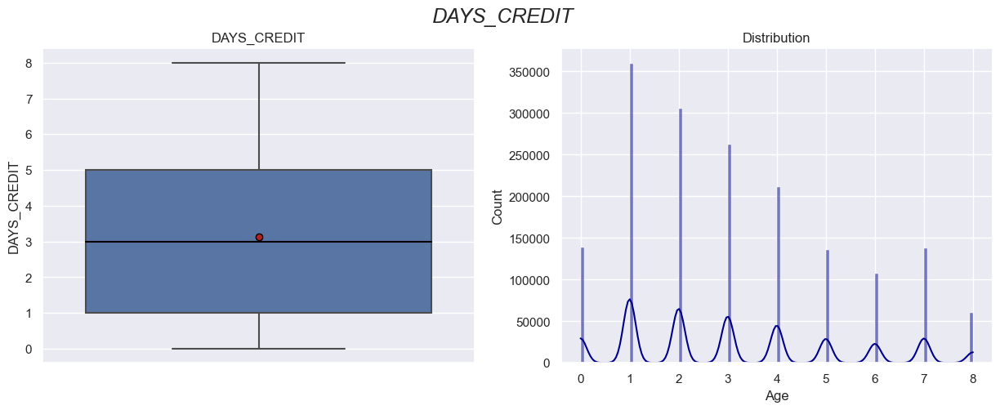

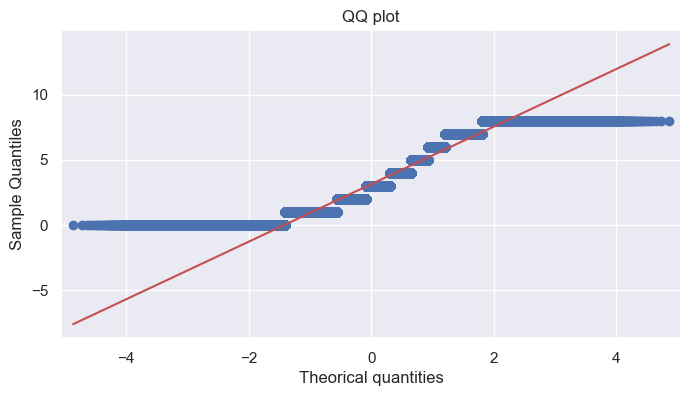

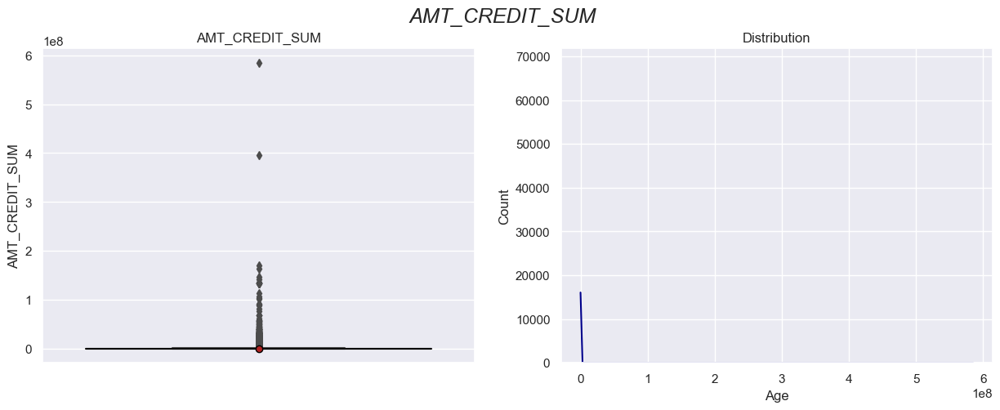

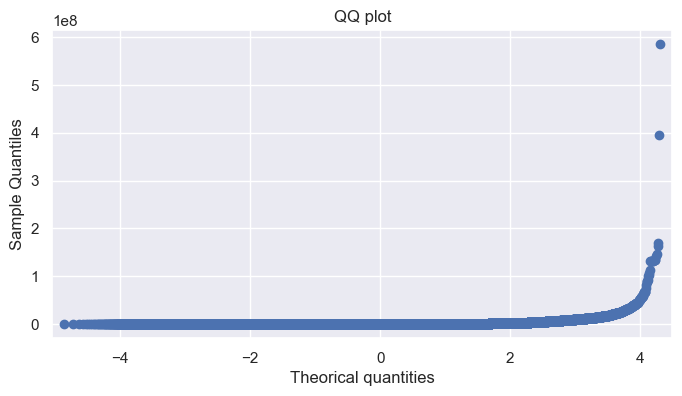

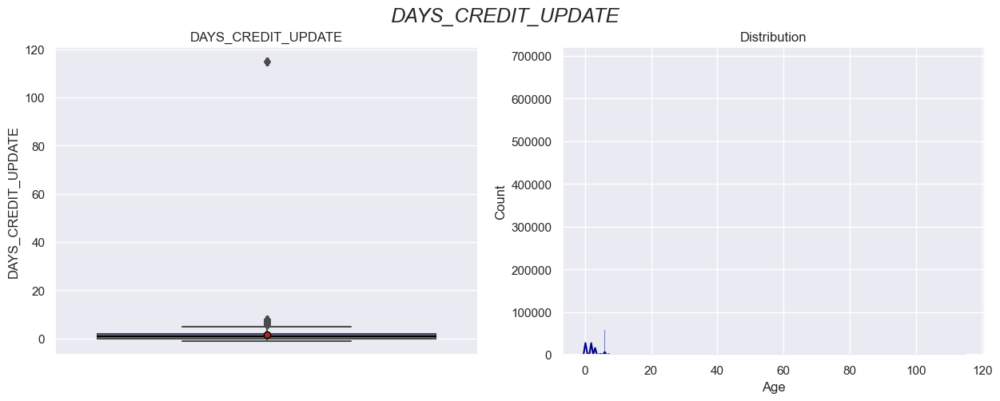

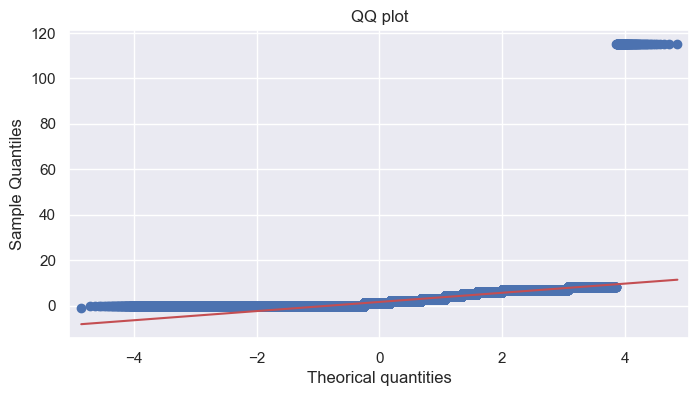

In [292]:
var_num = ['DAYS_CREDIT', 'AMT_CREDIT_SUM', 'DAYS_CREDIT_UPDATE']


for i in var_num:
    plt.figure(figsize = (15,5))
    plt.suptitle(i, fontsize=18, fontstyle='italic')
    plt.subplot(1,2,1)
    # Propriétés graphiques     
    medianprops = {'color':"black"}
    meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    sns.boxplot( y=bureau[i], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
    plt.title(i)
    plt.ylabel(i)
    plt.subplot(1,2,2)
    sns.histplot(bureau[i], kde = True, color='Darkblue',discrete=False)
    plt.title("Distribution")
    plt.xlabel('Age')
    plt.show()


    sm.qqplot(bureau[i], line='s')
    plt.title("QQ plot")
    plt.xlabel('Theorical quantities')


    plt.show()
    

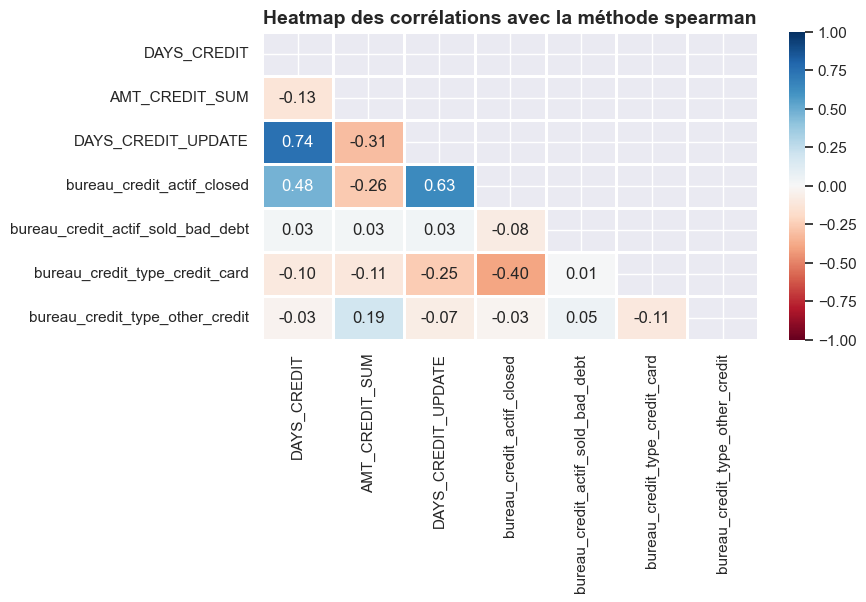

In [293]:
df = bureau.drop(labels=['SK_ID_CURR','SK_ID_BUREAU'], axis=1).select_dtypes(include=[np.number])

# On centre et on réduit les colonnes
df_stand = (df-df.mean(axis=0))/df.std(axis=0)

correlation_matrice(df_stand,'spearman')

DAYS_CREDIT et DAYS_CREDIT_UPDATE sont très liés, nous conservons la première : Quel est le nombre de jours entre la demande actuelle du client et sa demande précédente enregistrée au bureau de crédit.

In [294]:
bureau.drop(labels=['DAYS_CREDIT_UPDATE'], axis=1, inplace=True)

bureau.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 8 columns):
 #   Column                             Dtype  
---  ------                             -----  
 0   SK_ID_CURR                         int64  
 1   SK_ID_BUREAU                       int64  
 2   DAYS_CREDIT                        float64
 3   AMT_CREDIT_SUM                     float64
 4   bureau_credit_actif_closed         uint8  
 5   bureau_credit_actif_sold_bad_debt  uint8  
 6   bureau_credit_type_credit_card     uint8  
 7   bureau_credit_type_other_credit    uint8  
dtypes: float64(2), int64(2), uint8(4)
memory usage: 58.9 MB


## bureau_balance

### Quels sont les soldes mensuels des crédits antérieurs au bureau de crédit

In [295]:
bureau_balance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB


In [296]:
missing_values(bureau_balance)

,Total,%
SK_ID_BUREAU,0,0.00
MONTHS_BALANCE,0,0.00
STATUS,0,0.00


In [297]:
bureau_balance.describe()


,SK_ID_BUREAU,MONTHS_BALANCE
count,"27,299,925.00","27,299,925.00"
mean,"6,036,297.33",-30.74
std,"492,348.86",23.86
min,"5,001,709.00",-96.00
25%,"5,730,933.00",-46.00
50%,"6,070,821.00",-25.00
75%,"6,431,951.00",-11.00
max,"6,842,888.00",0.00


In [298]:
bureau_balance['MONTHS_BALANCE'].describe([.01, .1, .25, .5, .75, .8, .9, .95, .99])

count   27,299,925.00
mean           -30.74
std             23.86
min            -96.00
1%             -91.00
10%            -68.00
25%            -46.00
50%            -25.00
75%            -11.00
80%             -9.00
90%             -4.00
95%             -2.00
99%              0.00
max              0.00
Name: MONTHS_BALANCE, dtype: float64

la valeur MONTHS_BALANCE (mois de solde par rapport à la date d'application). 
C'est un compte à rebours (-1 est la date du mois de solde la plus récente)

In [299]:
# valeurs de STATUS
bureau_balance['STATUS'].unique()

array(['C', '0', 'X', '1', '2', '3', '5', '4'], dtype=object)

STATUT : Statut du prêt du bureau de crédit au cours du mois (actif, fermé, DPD0-30,…

C signifie fermé,
X signifie état inconnu,
0 signifie pas de DPD (jours de retard),
1 signifie que le maximum a été fait pendant le mois entre 1 et 30,
2 signifie DPD 31-60,
… 5 signifie DPD 120+ ou vendu ou radié)"

In [300]:
# Categorical Variables
def cat_analyzer(dataframe, variable):
    print(variable)
    print(pd.DataFrame({
            "COUNT": dataframe[variable].value_counts(),
            "RATIO": dataframe[variable].value_counts() / len(dataframe) *100}), end="\n\n\n")
    
cat_analyzer(bureau_balance, 'STATUS')

STATUS
      COUNT  RATIO
C  13646993  49.99
0   7499507  27.47
X   5810482  21.28
1    242347   0.89
5     62406   0.23
2     23419   0.09
3      8924   0.03
4      5847   0.02




In [301]:
map_statut_bureau = {'C': 'closed',
                     '0': 'actif_sans_jour_retard',
                     '1': 'actif_avec_jours_retard',
                     '2': 'actif_avec_jours_retard',
                     '3': 'actif_avec_jours_retard',
                     '4': 'actif_avec_jours_retard',
                     '5': 'actif_avec_jours_retard',
                     'X': 'inconnu'}

bureau_balance['solde_CB_statut'] = bureau_balance['STATUS'].map(map_statut_bureau)

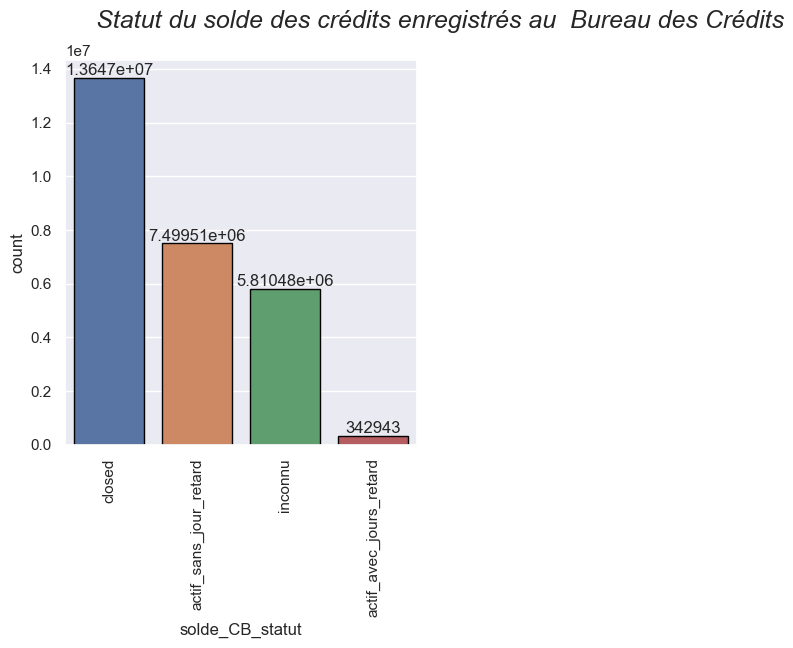

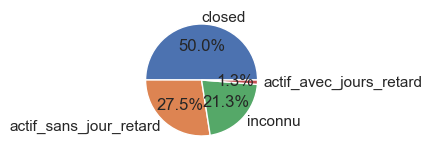

In [302]:
plt.figure(figsize = (10,5))

plt.subplot(1,2,1)
plt.suptitle("Statut du solde des crédits enregistrés au  Bureau des Crédits", fontsize=18, fontstyle='italic')
ax=sns.countplot(data=bureau_balance, x="solde_CB_statut", edgecolor="black")
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)

plt.show()
plt.subplot(2,2,1)

type_count = bureau_balance['solde_CB_statut'].value_counts().reset_index()
plt.pie(labels=type_count['index'], x=type_count['solde_CB_statut'], autopct='%.1f%%')

plt.show()

In [303]:
bureau_balance = pd.get_dummies(bureau_balance,
                                columns=["solde_CB_statut"],
                                prefix={'solde_CB_statut': 'solde_CB_statut'})
bureau_balance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 7 columns):
 #   Column                                   Dtype 
---  ------                                   ----- 
 0   SK_ID_BUREAU                             int64 
 1   MONTHS_BALANCE                           int64 
 2   STATUS                                   object
 3   solde_CB_statut_actif_avec_jours_retard  uint8 
 4   solde_CB_statut_actif_sans_jour_retard   uint8 
 5   solde_CB_statut_closed                   uint8 
 6   solde_CB_statut_inconnu                  uint8 
dtypes: int64(2), object(1), uint8(4)
memory usage: 729.0+ MB


In [304]:
# Non prise en compte de solde_credit_bureau_statut_inconnu pour éviter la fuite des variables fictives

solde_bureau_balance = bureau_balance.groupby(['SK_ID_BUREAU'], as_index=False).agg({'MONTHS_BALANCE': 'mean',
                                                                                     'solde_CB_statut_actif_avec_jours_retard': 'sum',
                                                                                     'solde_CB_statut_actif_sans_jour_retard': 'sum',
                                                                                     'solde_CB_statut_closed': 'sum'
                                                                                     })

solde_bureau_balance.drop(labels='SK_ID_BUREAU', axis=1).describe()

,MONTHS_BALANCE,solde_CB_statut_actif_avec_jours_retard,solde_CB_statut_actif_sans_jour_retard,solde_CB_statut_closed
count,"817,395.00","817,395.00","817,395.00","817,395.00"
mean,-23.23,0.42,9.17,16.70
std,19.35,2.28,10.31,23.27
min,-96.00,0.00,0.00,0.00
25%,-33.50,0.00,2.00,0.00
50%,-18.00,0.00,6.00,5.00
75%,-8.00,0.00,12.00,27.00
max,0.00,97.00,97.00,97.00


In [305]:
solde_bureau_balance.sample(2)

,SK_ID_BUREAU,MONTHS_BALANCE,solde_CB_statut_actif_avec_jours_retard,solde_CB_statut_actif_sans_jour_retard,solde_CB_statut_closed
696553,6593585,-3.00,0,0,0
417161,6075048,-48.00,0,1,92


In [306]:
#jointure avec bureau
bureau = bureau.merge(solde_bureau_balance, how='left', on='SK_ID_BUREAU')
bureau.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1716428 entries, 0 to 1716427
Data columns (total 12 columns):
 #   Column                                   Dtype  
---  ------                                   -----  
 0   SK_ID_CURR                               int64  
 1   SK_ID_BUREAU                             int64  
 2   DAYS_CREDIT                              float64
 3   AMT_CREDIT_SUM                           float64
 4   bureau_credit_actif_closed               uint8  
 5   bureau_credit_actif_sold_bad_debt        uint8  
 6   bureau_credit_type_credit_card           uint8  
 7   bureau_credit_type_other_credit          uint8  
 8   MONTHS_BALANCE                           float64
 9   solde_CB_statut_actif_avec_jours_retard  float64
 10  solde_CB_statut_actif_sans_jour_retard   float64
 11  solde_CB_statut_closed                   float64
dtypes: float64(6), int64(2), uint8(4)
memory usage: 124.4 MB


In [307]:
missing_values(bureau)

,Total,%
MONTHS_BALANCE,942074,54.89
solde_CB_statut_actif_avec_jours_retard,942074,54.89
solde_CB_statut_actif_sans_jour_retard,942074,54.89
solde_CB_statut_closed,942074,54.89
SK_ID_CURR,0,0.00
SK_ID_BUREAU,0,0.00
DAYS_CREDIT,0,0.00
AMT_CREDIT_SUM,13,0.00
bureau_credit_actif_closed,0,0.00
bureau_credit_actif_sold_bad_debt,0,0.00


je vais affecter la valeur 0 aux valeurs manquantes

In [308]:
bureau.fillna(0,inplace=True)

In [309]:
#vérification
bureau.isna().sum().sum()

0

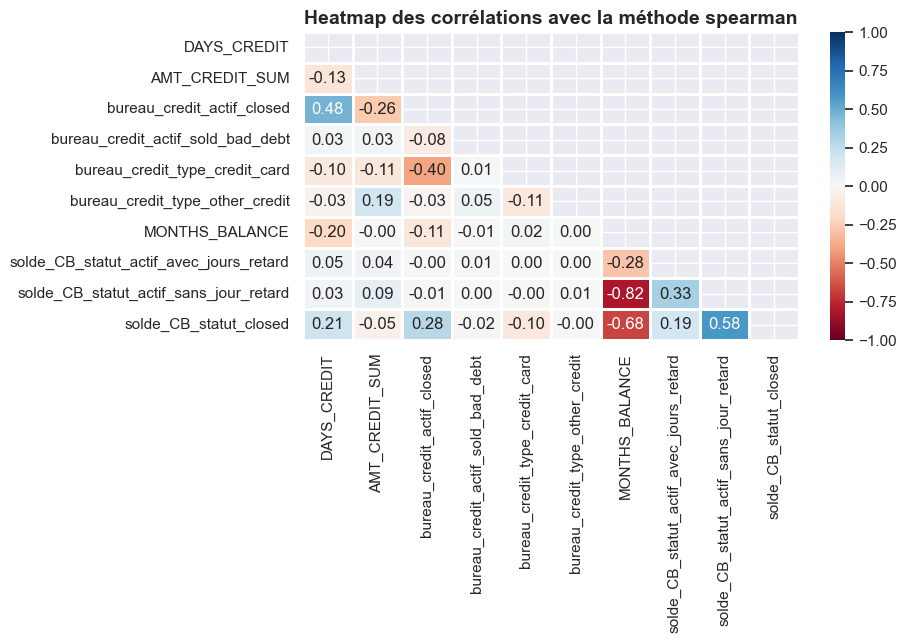

In [310]:
df = bureau.drop(labels=['SK_ID_CURR','SK_ID_BUREAU'], axis=1).select_dtypes(include=[np.number])

# On centre et on réduit les colonnes
df_stand = (df-df.mean(axis=0))/df.std(axis=0)

correlation_matrice(df_stand,'spearman')

les variables solde_CB_statut_closed et MONTHS_BALANCE sont fortement anti-corrélées .
Je supprime MONTHS_BALANCE

In [311]:
# Suppression de Months_Balance

bureau.drop(labels='MONTHS_BALANCE', axis=1, inplace=True)

In [312]:
bureau.info(verbose = True, null_counts = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1716428 entries, 0 to 1716427
Data columns (total 11 columns):
 #   Column                                   Non-Null Count    Dtype  
---  ------                                   --------------    -----  
 0   SK_ID_CURR                               1716428 non-null  int64  
 1   SK_ID_BUREAU                             1716428 non-null  int64  
 2   DAYS_CREDIT                              1716428 non-null  float64
 3   AMT_CREDIT_SUM                           1716428 non-null  float64
 4   bureau_credit_actif_closed               1716428 non-null  uint8  
 5   bureau_credit_actif_sold_bad_debt        1716428 non-null  uint8  
 6   bureau_credit_type_credit_card           1716428 non-null  uint8  
 7   bureau_credit_type_other_credit          1716428 non-null  uint8  
 8   solde_CB_statut_actif_avec_jours_retard  1716428 non-null  float64
 9   solde_CB_statut_actif_sans_jour_retard   1716428 non-null  float64
 10  solde_CB_statut_cl

In [313]:
client_bureau = bureau.groupby(['SK_ID_CURR'], as_index=False).agg({'SK_ID_BUREAU': 'count',
                                                                    'DAYS_CREDIT': 'mean',
                                                                    'AMT_CREDIT_SUM': 'sum',
                                                                    'bureau_credit_actif_closed': 'sum',
                                                                    'bureau_credit_actif_sold_bad_debt': 'sum',
                                                                    'bureau_credit_type_credit_card': 'sum',
                                                                    'bureau_credit_type_other_credit': 'sum',
                                                                    'solde_CB_statut_actif_avec_jours_retard': 'sum',
                                                                    'solde_CB_statut_actif_sans_jour_retard': 'sum',
                                                                    'solde_CB_statut_closed': 'sum'
                                                                    })

client_bureau.drop(labels='SK_ID_CURR', axis=1).describe()


,SK_ID_BUREAU,DAYS_CREDIT,AMT_CREDIT_SUM,bureau_credit_actif_closed,bureau_credit_actif_sold_bad_debt,bureau_credit_type_credit_card,bureau_credit_type_other_credit,solde_CB_statut_actif_avec_jours_retard,solde_CB_statut_actif_sans_jour_retard,solde_CB_statut_closed
count,"305,811.00","305,811.00","305,811.00","305,811.00","305,811.00","305,811.00","305,811.00","305,811.00","305,811.00","305,811.00"
mean,5.61,2.96,"1,992,466.07",3.53,0.02,1.32,0.20,1.03,23.53,37.79
std,4.43,1.55,"4,165,820.02",3.43,0.16,1.51,0.72,5.25,44.87,84.40
min,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,2.00,2.00,"346,967.64",1.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,4.00,3.00,"978,820.74",3.00,0.00,1.00,0.00,0.00,0.00,0.00
75%,8.00,4.00,"2,345,121.00",5.00,0.00,2.00,0.00,0.00,30.00,35.00
max,116.00,8.00,"1,017,957,917.38",108.00,9.00,22.00,79.00,396.00,696.00,"1,981.00"


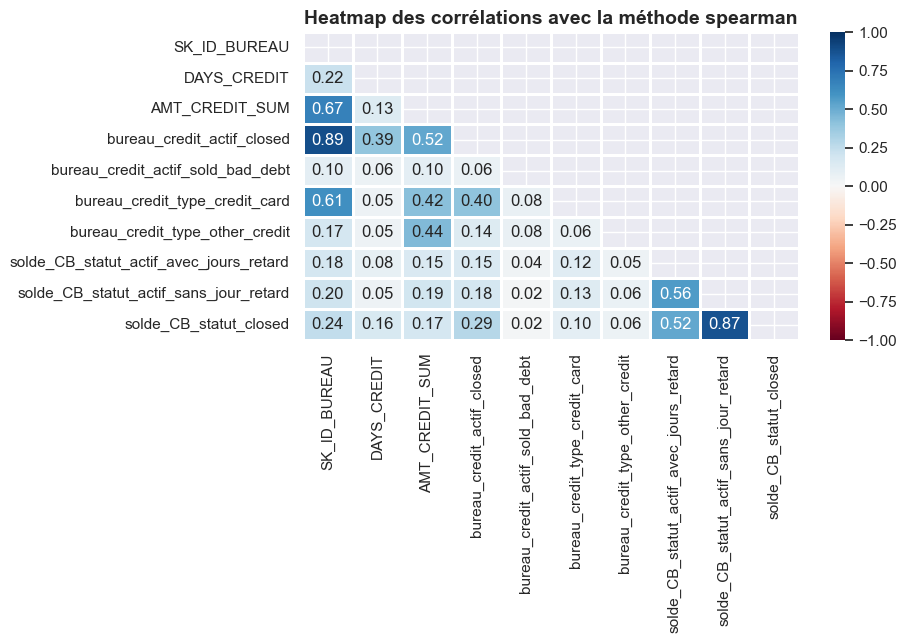

In [314]:
df = client_bureau.drop(labels=['SK_ID_CURR'], axis=1).select_dtypes(include=[np.number])

# On centre et on réduit les colonnes
df_stand = (df-df.mean(axis=0))/df.std(axis=0)

correlation_matrice(df_stand,'spearman')

Nous avons 2 corrélations importantes.
Le nombre de crédits enregistré au bureau du crédit est très lié au type de crédit "crédit à la consommation". Nous supprimons donc la variable SK_ID_BUREAU.

concernant le statut du solde du crédit, je supprime la variable solde_CB_statut_actif_sans_jours_retard puisqu'elle est liée aux status fermés.

In [315]:
vars_to_drop = ['SK_ID_BUREAU', 'solde_CB_statut_actif_sans_jour_retard']

client_bureau.drop(labels=vars_to_drop, axis=1, inplace=True)

In [316]:
client_bureau.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 305811 entries, 0 to 305810
Data columns (total 9 columns):
 #   Column                                   Non-Null Count   Dtype  
---  ------                                   --------------   -----  
 0   SK_ID_CURR                               305811 non-null  int64  
 1   DAYS_CREDIT                              305811 non-null  float64
 2   AMT_CREDIT_SUM                           305811 non-null  float64
 3   bureau_credit_actif_closed               305811 non-null  uint8  
 4   bureau_credit_actif_sold_bad_debt        305811 non-null  uint8  
 5   bureau_credit_type_credit_card           305811 non-null  uint8  
 6   bureau_credit_type_other_credit          305811 non-null  uint8  
 7   solde_CB_statut_actif_avec_jours_retard  305811 non-null  float64
 8   solde_CB_statut_closed                   305811 non-null  float64
dtypes: float64(4), int64(1), uint8(4)
memory usage: 12.8 MB


In [317]:
# pour rappel : les fusions précédentes
clean_X_train_join3.shape, clean_X_test_join3.shape

((307511, 58), (48744, 57))

In [318]:
# jointure avec X_train_join3 

clean_X_train_join4 = clean_X_train_join3.merge(client_bureau, how='left', on='SK_ID_CURR')

#jointure avec clean_X_test_join3

clean_X_test_join4 = clean_X_test_join3.merge(client_bureau, how='left', on='SK_ID_CURR')


clean_X_train_join4.shape,clean_X_test_join4.shape

((307511, 66), (48744, 65))

In [319]:
missing_values(clean_X_train_join4)

,Total,%
solde_CB_statut_closed,44020,14.31
solde_CB_statut_actif_avec_jours_retard,44020,14.31
bureau_credit_type_other_credit,44020,14.31
bureau_credit_type_credit_card,44020,14.31
bureau_credit_actif_sold_bad_debt,44020,14.31
bureau_credit_actif_closed,44020,14.31
AMT_CREDIT_SUM,44020,14.31
DAYS_CREDIT,44020,14.31
nb_famille,0,0.00
montant_demande_pret_precedent,0,0.00


In [320]:
missing_values(clean_X_test_join4)

,Total,%
solde_CB_statut_closed,6424,13.18
solde_CB_statut_actif_avec_jours_retard,6424,13.18
bureau_credit_type_other_credit,6424,13.18
bureau_credit_type_credit_card,6424,13.18
bureau_credit_actif_sold_bad_debt,6424,13.18
bureau_credit_actif_closed,6424,13.18
AMT_CREDIT_SUM,6424,13.18
DAYS_CREDIT,6424,13.18
nb_famille,0,0.00
montant_demande_pret_precedent,0,0.00


In [321]:
liste_var3 = ['DAYS_CREDIT',
              'AMT_CREDIT_SUM',
              'bureau_credit_actif_closed',
              'bureau_credit_actif_sold_bad_debt',
              'bureau_credit_type_credit_card',
              'bureau_credit_type_other_credit',
              'solde_CB_statut_actif_avec_jours_retard',
              'solde_CB_statut_closed']

In [322]:
for var in liste_var3:
    clean_X_train_join4[var].fillna(0, inplace=True)
    clean_X_test_join4[var].fillna(0, inplace=True)

In [323]:
#vérification
clean_X_train_join4.isna().sum().sum()
clean_X_test_join4.isna().sum().sum()

0

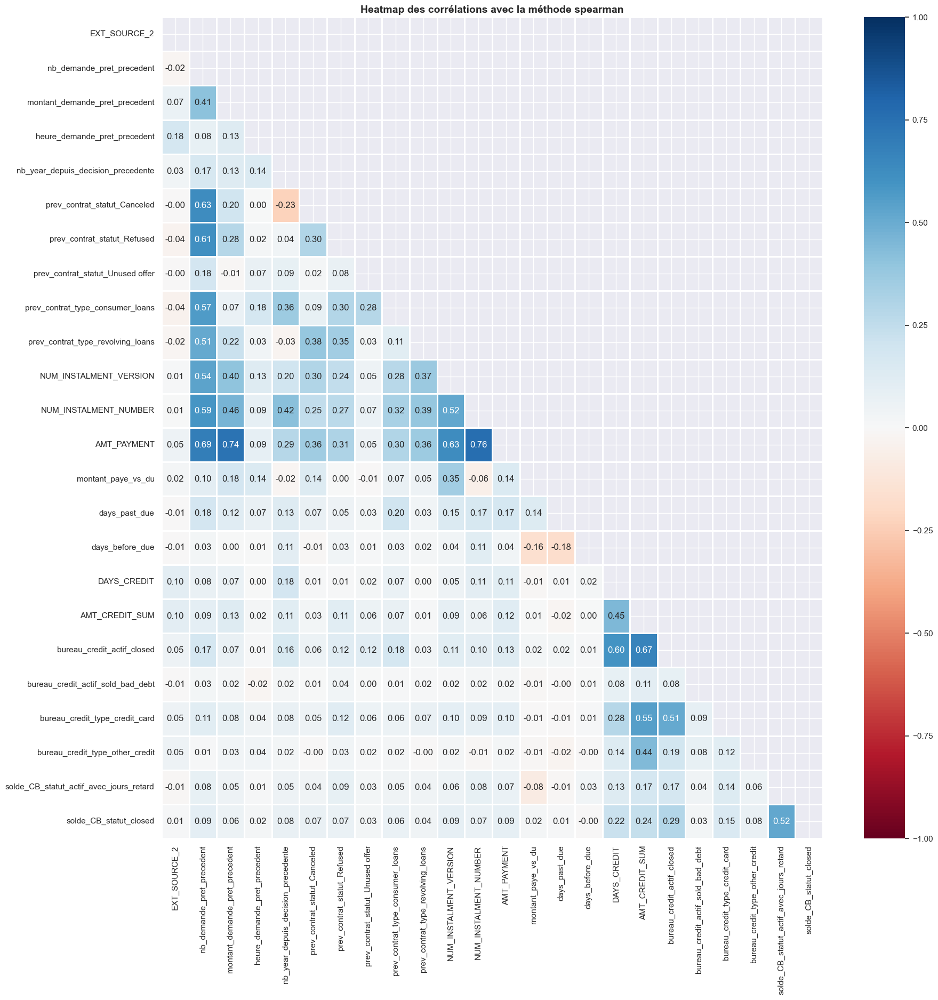

In [324]:
df = clean_X_train_join4.drop(labels=['SK_ID_CURR', 'TARGET'], axis=1).select_dtypes(include=[np.number])

# On centre et on réduit les colonnes
df_stand = (df-df.mean(axis=0))/df.std(axis=0)

plt.figure(figsize = (20,20))

mat=correlation_matrice(df_stand,'spearman')



AMT_PAYMENT est corrélé fortement avec plusieurs variables. Je vais le supprimer pour la suite.

In [325]:
# Suppression des variables très liées entre elles

vars_to_drop2 = ['AMT_PAYMENT']

clean_X_train_join4.drop(labels=vars_to_drop2, axis=1, inplace=True)
clean_X_test_join4.drop(labels=vars_to_drop2, axis=1, inplace=True)

clean_X_train_join4.shape

(307511, 65)

In [326]:
clean_X_train_join4.shape, clean_X_test_join4.shape


((307511, 65), (48744, 64))

## pos_cash

### POS CASH balance

Snapshot mensuel des précédents prêts des clients avec Home Crédit
une ligne par mois par crédit précédent dans Home Crédit

In [327]:
pos_cash.info(verbose = True, null_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Non-Null Count     Dtype  
---  ------                 --------------     -----  
 0   SK_ID_PREV             10001358 non-null  int64  
 1   SK_ID_CURR             10001358 non-null  int64  
 2   MONTHS_BALANCE         10001358 non-null  int64  
 3   CNT_INSTALMENT         9975287 non-null   float64
 4   CNT_INSTALMENT_FUTURE  9975271 non-null   float64
 5   NAME_CONTRACT_STATUS   10001358 non-null  object 
 6   SK_DPD                 10001358 non-null  int64  
 7   SK_DPD_DEF             10001358 non-null  int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB


In [328]:
missing_values(pos_cash)

,Total,%
CNT_INSTALMENT,26071,0.26
CNT_INSTALMENT_FUTURE,26087,0.26
SK_ID_PREV,0,0.00
SK_ID_CURR,0,0.00
MONTHS_BALANCE,0,0.00
NAME_CONTRACT_STATUS,0,0.00
SK_DPD,0,0.00
SK_DPD_DEF,0,0.00


In [329]:
# Categorical Variables
def cat_analyzer(dataframe, variable):
    print(variable)
    print(pd.DataFrame({
            "COUNT": dataframe[variable].value_counts(),
            "RATIO": dataframe[variable].value_counts() / len(dataframe) *100}), end="\n\n\n")
    
cat_analyzer(pos_cash, 'NAME_CONTRACT_STATUS')

NAME_CONTRACT_STATUS
                         COUNT  RATIO
Active                 9151119  91.50
Completed               744883   7.45
Signed                   87260   0.87
Demand                    7065   0.07
Returned to the store     5461   0.05
Approved                  4917   0.05
Amortized debt             636   0.01
Canceled                    15   0.00
XNA                          2   0.00




La plupart des contracts sont actifs.((variable non discriminante non conservée pour la suite)

In [330]:
pos_cash.drop(labels='NAME_CONTRACT_STATUS', axis=1, inplace=True)

In [331]:
pos_cash.drop(labels=['SK_ID_PREV','SK_ID_CURR'], axis=1).describe()

,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF
count,"10,001,358.00","9,975,287.00","9,975,271.00","10,001,358.00","10,001,358.00"
mean,-35.01,17.09,10.48,11.61,0.65
std,26.07,12.00,11.11,132.71,32.76
min,-96.00,1.00,0.00,0.00,0.00
25%,-54.00,10.00,3.00,0.00,0.00
50%,-28.00,12.00,7.00,0.00,0.00
75%,-13.00,24.00,14.00,0.00,0.00
max,-1.00,92.00,85.00,"4,231.00","3,595.00"


CNT_INSTALMENT : Durée du crédit précédent     
CNT_INSTALMENT_FUTURE : Acomptes restant à payer sur le crédit précédent          
SK_DPD : DPD (jours de retard) au cours du mois du crédit précédent  

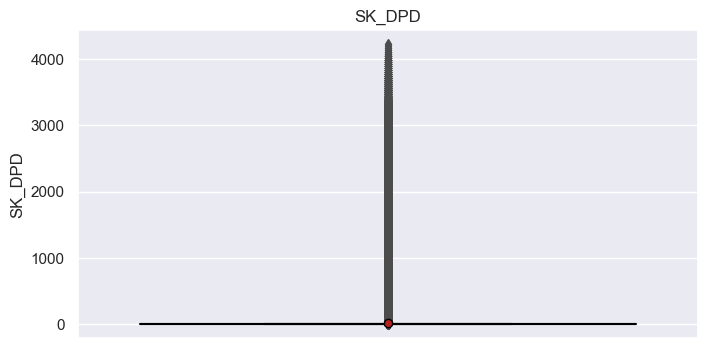

In [332]:
 # Propriétés graphiques     
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot( y=pos_cash['SK_DPD'], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
plt.title('SK_DPD');

    

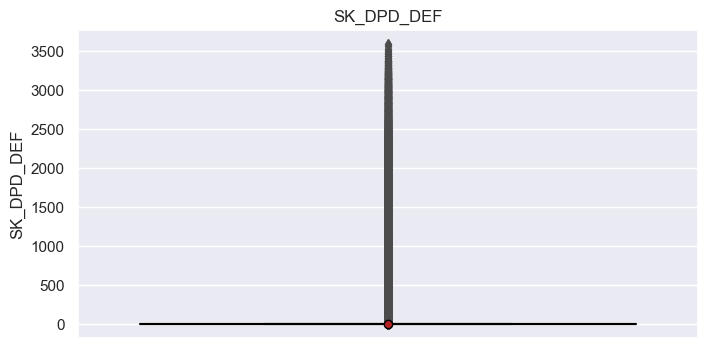

In [333]:
 # Propriétés graphiques     
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
sns.boxplot( y=pos_cash['SK_DPD_DEF'], showfliers=True,medianprops=medianprops, showmeans=True, meanprops=meanprops)
plt.title('SK_DPD_DEF');

DPD=days past due

SK_DPD_DEF : DPD au cours du mois avec tolérance (les dettes à faible montant d'emprunt sont ignorées) du crédit précédent   
SK_DPD et SK_DPD_DEF sont à supprimer compte tenu de leur distribution.

In [334]:
pos_cash.drop(labels=['SK_DPD', 'SK_DPD_DEF'], axis=1, inplace=True)

In [335]:
client_pos_cash = pos_cash.groupby(['SK_ID_CURR'], as_index=False).agg({'SK_ID_PREV': 'count',
                                                                        'MONTHS_BALANCE': 'mean',
                                                                        'CNT_INSTALMENT': 'mean',
                                                                        'CNT_INSTALMENT_FUTURE': 'mean'})

client_pos_cash.drop(labels='SK_ID_CURR', axis=1).describe()

,SK_ID_PREV,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE
count,"337,252.00","337,252.00","337,224.00","337,224.00"
mean,29.66,-31.87,14.65,9.18
std,24.53,20.08,7.97,6.50
min,1.00,-96.00,1.00,0.00
25%,12.00,-43.99,9.62,5.00
50%,22.00,-28.57,12.00,6.99
75%,39.00,-15.50,18.60,11.67
max,295.00,-1.00,72.00,60.00


In [336]:
#jointure avec clean_X_train_join4

clean_X_train_join5 = clean_X_train_join4.merge(client_pos_cash, how='left', on='SK_ID_CURR')

#jointure avec clean_X_test_join4
clean_X_test_join5 = clean_X_test_join4.merge(client_pos_cash, how='left', on='SK_ID_CURR')


clean_X_train_join5.shape,clean_X_test_join5.shape,

((307511, 69), (48744, 68))

In [337]:
missing_values(clean_X_train_join5)

,Total,%
CNT_INSTALMENT_FUTURE,18091,5.88
CNT_INSTALMENT,18091,5.88
MONTHS_BALANCE,18067,5.88
SK_ID_PREV,18067,5.88
nb_demande_pret_precedent,0,0.00
prev_contrat_statut_Refused,0,0.00
prev_contrat_statut_Canceled,0,0.00
nb_year_depuis_decision_precedente,0,0.00
heure_demande_pret_precedent,0,0.00
montant_demande_pret_precedent,0,0.00


In [338]:
missing_values(clean_X_test_join5)

,Total,%
CNT_INSTALMENT_FUTURE,940,1.93
CNT_INSTALMENT,940,1.93
MONTHS_BALANCE,936,1.92
SK_ID_PREV,936,1.92
nb_demande_pret_precedent,0,0.00
prev_contrat_statut_Refused,0,0.00
prev_contrat_statut_Canceled,0,0.00
nb_year_depuis_decision_precedente,0,0.00
heure_demande_pret_precedent,0,0.00
montant_demande_pret_precedent,0,0.00


In [339]:
liste_var4 = ['SK_ID_PREV', 'MONTHS_BALANCE', 'CNT_INSTALMENT', 'CNT_INSTALMENT_FUTURE']

for var in liste_var4:
    clean_X_train_join5[var].fillna(0, inplace=True)
    clean_X_test_join5[var].fillna(0, inplace=True)

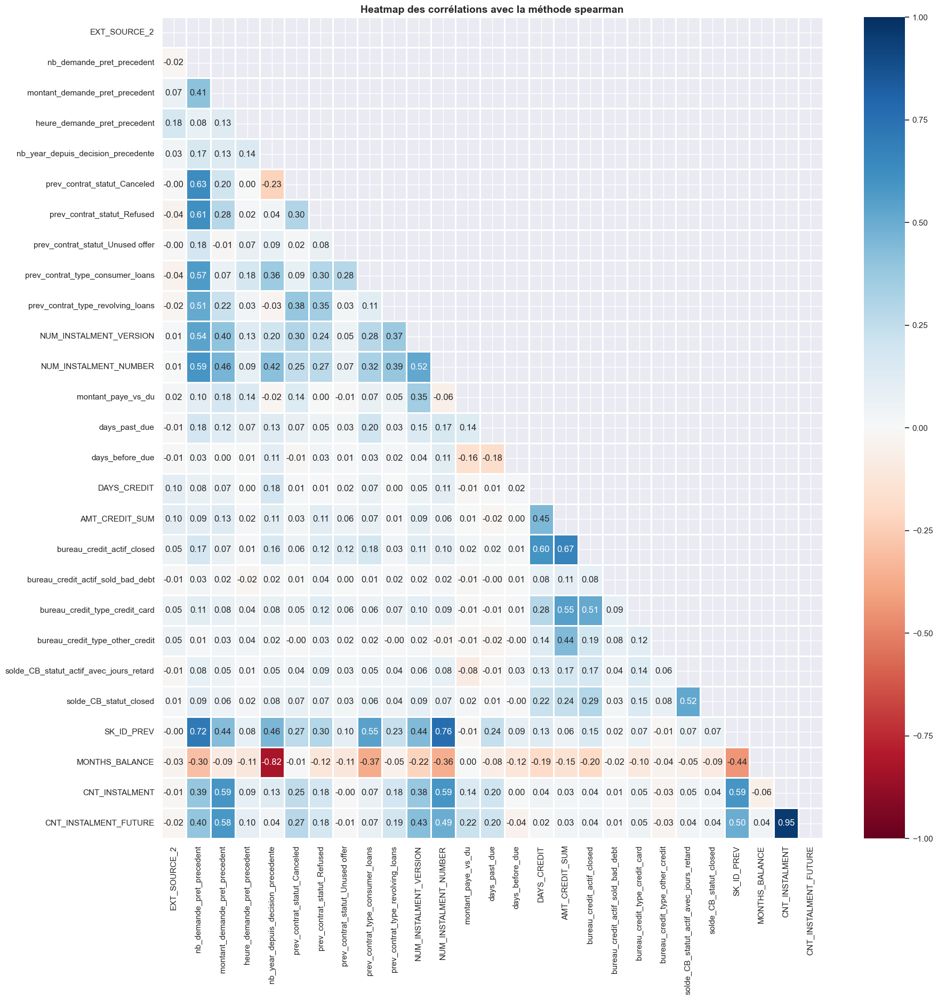

In [340]:
df = clean_X_train_join5.drop(labels=['SK_ID_CURR', 'TARGET'], axis=1).select_dtypes(include=[np.number])

# On centre et on réduit les colonnes
df_stand = (df-df.mean(axis=0))/df.std(axis=0)

plt.figure(figsize = (20,20))

mat=correlation_matrice(df_stand,'spearman')


In [341]:
# Suppression des variables très liées entre elles

vars_to_drop3 = ['CNT_INSTALMENT_FUTURE', 'MONTHS_BALANCE', 'SK_ID_PREV']

clean_X_train_join5.drop(labels=vars_to_drop3, axis=1, inplace=True)
clean_X_test_join5.drop(labels=vars_to_drop3, axis=1, inplace=True)

clean_X_train_join5.shape,clean_X_test_join5.shape

((307511, 66), (48744, 65))

## credit_card

In [342]:
credit_card = pd.read_csv(path+'credit_card_balance.csv')

Aperçus mensuels du solde des cartes de crédit précédentes que le demandeur a avec Home Credit. Ce tableau comporte une ligne pour chaque mois d'historique de chaque crédit précédent dans Home Credit (crédit à la consommation et prêts de trésorerie) lié aux prêts de notre échantillon - c'est-à-dire que le tableau a (nombre de prêts dans l'échantillon nombre de cartes de crédit précédentes relatives nombre de mois où nous avons un historique observable pour la carte de crédit précédente) lignes.

In [343]:
credit_card.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_CURRENT    float64
 19  CNT_INSTALMENT_MATURE

In [344]:
missing_values(credit_card)

,Total,%
AMT_PAYMENT_CURRENT,767988,20.00
AMT_DRAWINGS_ATM_CURRENT,749816,19.52
CNT_DRAWINGS_POS_CURRENT,749816,19.52
AMT_DRAWINGS_OTHER_CURRENT,749816,19.52
AMT_DRAWINGS_POS_CURRENT,749816,19.52
CNT_DRAWINGS_OTHER_CURRENT,749816,19.52
CNT_DRAWINGS_ATM_CURRENT,749816,19.52
CNT_INSTALMENT_MATURE_CUM,305236,7.95
AMT_INST_MIN_REGULARITY,305236,7.95
SK_ID_PREV,0,0.00


In [345]:
# suppression des colonnes avec des nan
credit_card.dropna(axis=1, inplace=True)

In [346]:
# verification
credit_card.isna().sum().sum()

0

In [347]:
# Categorical Variables
    
cat_analyzer(credit_card, 'NAME_CONTRACT_STATUS')

NAME_CONTRACT_STATUS
                 COUNT  RATIO
Active         3698436  96.31
Completed       128918   3.36
Signed           11058   0.29
Demand            1365   0.04
Sent proposal      513   0.01
Refused             17   0.00
Approved             5   0.00




In [348]:
# suppression de la variable non discriminante NAME_CONTRACT_STATUS
credit_card.drop(labels='NAME_CONTRACT_STATUS', axis=1, inplace=True)

In [349]:
credit_card.drop(labels=['SK_ID_CURR', 'SK_ID_PREV'], axis=1).describe([.01, .1, .25, .5, .75, .8, .9, .95, .99]).T

,count,mean,std,min,1%,10%,25%,50%,75%,80%,90%,95%,99%,max
MONTHS_BALANCE,"3,840,312.00",-34.52,26.67,-96.00,-93.00,-76.00,-55.00,-28.00,-11.00,-9.00,-5.00,-3.00,-1.00,-1.00
AMT_BALANCE,"3,840,312.00","58,300.16","106,307.03","-420,250.18",0.00,0.00,0.00,0.00,"89,046.69","116,880.71","180,016.20","257,181.38","466,295.12","1,505,902.19"
AMT_CREDIT_LIMIT_ACTUAL,"3,840,312.00","153,807.96","165,145.70",0.00,0.00,0.00,"45,000.00","112,500.00","180,000.00","225,000.00","427,500.00","450,000.00","765,000.00","1,350,000.00"
AMT_DRAWINGS_CURRENT,"3,840,312.00","7,433.39","33,846.08","-6,211.62",0.00,0.00,0.00,0.00,0.00,0.00,"11,250.00","45,000.00","157,500.00","2,287,098.31"
AMT_PAYMENT_TOTAL_CURRENT,"3,840,312.00","7,588.86","32,005.99",0.00,0.00,0.00,0.00,0.00,"6,750.00","9,000.00","13,500.00","23,400.00","128,614.93","4,278,315.69"
AMT_RECEIVABLE_PRINCIPAL,"3,840,312.00","55,965.88","102,533.62","-423,305.82",0.00,0.00,0.00,0.00,"85,359.24","111,982.27","173,228.93","247,803.41","448,121.83","1,472,316.79"
AMT_RECIVABLE,"3,840,312.00","58,088.81","105,965.37","-420,250.18",-487.26,0.00,0.00,0.00,"88,899.49","116,663.39","179,815.77","256,445.41","464,023.86","1,493,338.19"
AMT_TOTAL_RECEIVABLE,"3,840,312.00","58,098.29","105,971.80","-420,250.18",-486.63,0.00,0.00,0.00,"88,914.51","116,690.04","179,830.17","256,468.50","464,025.51","1,493,338.19"
CNT_DRAWINGS_CURRENT,"3,840,312.00",0.70,3.19,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,4.00,14.00,165.00
SK_DPD,"3,840,312.00",9.28,97.52,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,274.00,"3,260.00"


MONTHS_BALANCE : Mois du solde par rapport à la date d'application (-1 signifie la date de solde la plus récente)  
AMT_BALANCE : Solde au cours du mois du crédit précédent  
AMT_CREDIT_LIMIT_ACTUAL : Limite de carte de crédit au cours du mois du crédit précédent  
AMT_DRAWINGS_CURRENT : Montant tiré au cours du mois du crédit précédent  
AMT_PAYMENT_TOTAL_CURRENT : Combien le client a-t-il payé au cours du mois au total sur le crédit précédent  
AMT_RECEIVABLE_PRINCIPAL : Montant à recevoir en principal sur le crédit précédent  
AMT_RECIVABLE : Montant à recevoir sur le crédit précédent  
AMT_TOTAL_RECEIVABLE : Montant total à recevoir sur le crédit précédent  
CNT_DRAWINGS_CURRENT : Nombre de tirages durant ce mois sur le crédit précédent  
SK_DPD : DPD (Jours de retard) au cours du mois sur le crédit précédent  
SK_DPD_DEF : DPD (Jours de retard) au cours du mois avec tolérance (les créances à faible montant d'emprunt sont ignorées) du crédit précédent

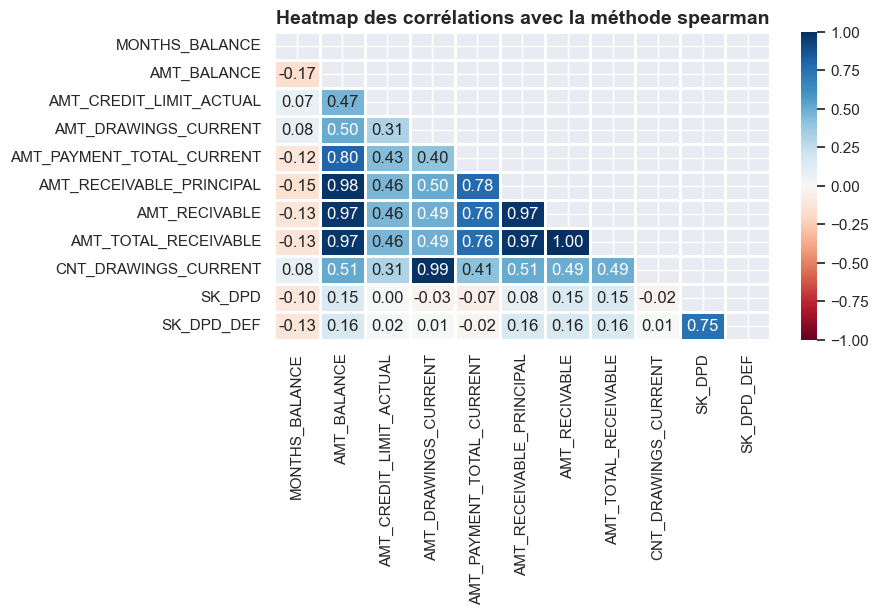

In [350]:
df = credit_card.drop(labels=['SK_ID_CURR', 'SK_ID_PREV'], axis=1).select_dtypes(include=[np.number])

# On centre et on réduit les colonnes
df_stand = (df-df.mean(axis=0))/df.std(axis=0)


correlation_matrice(df_stand,'spearman')


In [351]:
mat_corr = df_stand.corr(method='spearman')
for i in mat_corr.columns:
    
    cr = mat_corr.loc[i].loc[(mat_corr.loc[i] >= 0.7) | (mat_corr.loc[i] <= -.7)].drop(i)
    if len(cr) > 0:
        print(i)
        print("-------------------------------")
        print(cr.sort_values(ascending=False))
        print("\n")

AMT_BALANCE
-------------------------------
AMT_RECEIVABLE_PRINCIPAL    0.98
AMT_TOTAL_RECEIVABLE        0.97
AMT_RECIVABLE               0.97
AMT_PAYMENT_TOTAL_CURRENT   0.80
Name: AMT_BALANCE, dtype: float64


AMT_DRAWINGS_CURRENT
-------------------------------
CNT_DRAWINGS_CURRENT   0.99
Name: AMT_DRAWINGS_CURRENT, dtype: float64


AMT_PAYMENT_TOTAL_CURRENT
-------------------------------
AMT_BALANCE                0.80
AMT_RECEIVABLE_PRINCIPAL   0.78
AMT_TOTAL_RECEIVABLE       0.76
AMT_RECIVABLE              0.76
Name: AMT_PAYMENT_TOTAL_CURRENT, dtype: float64


AMT_RECEIVABLE_PRINCIPAL
-------------------------------
AMT_BALANCE                 0.98
AMT_RECIVABLE               0.97
AMT_TOTAL_RECEIVABLE        0.97
AMT_PAYMENT_TOTAL_CURRENT   0.78
Name: AMT_RECEIVABLE_PRINCIPAL, dtype: float64


AMT_RECIVABLE
-------------------------------
AMT_TOTAL_RECEIVABLE        1.00
AMT_BALANCE                 0.97
AMT_RECEIVABLE_PRINCIPAL    0.97
AMT_PAYMENT_TOTAL_CURRENT   0.76
Name: AMT_

In [352]:
# Suppression des variables très liées entre elles

vars_to_drop4 = ['AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE', 
                 'AMT_PAYMENT_TOTAL_CURRENT', 'CNT_DRAWINGS_CURRENT', 'SK_DPD', 'SK_DPD_DEF']

credit_card.drop(labels=vars_to_drop4, axis=1, inplace=True)

credit_card.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 6 columns):
 #   Column                   Dtype  
---  ------                   -----  
 0   SK_ID_PREV               int64  
 1   SK_ID_CURR               int64  
 2   MONTHS_BALANCE           int64  
 3   AMT_BALANCE              float64
 4   AMT_CREDIT_LIMIT_ACTUAL  int64  
 5   AMT_DRAWINGS_CURRENT     float64
dtypes: float64(2), int64(4)
memory usage: 175.8 MB


In [353]:
client_credit_card = credit_card.groupby(['SK_ID_CURR'], as_index=False).agg({'SK_ID_PREV': 'count',
                                                                              'MONTHS_BALANCE': 'mean',
                                                                              'AMT_BALANCE': 'sum',
                                                                              'AMT_CREDIT_LIMIT_ACTUAL': 'sum',
                                                                              'AMT_DRAWINGS_CURRENT': 'sum' })

In [354]:
#Fusion avec clean_X_train_join5

clean_X_train_join6 = clean_X_train_join5.merge(client_credit_card, how='left', on='SK_ID_CURR')

#Fusion avec clean_X_test_join5

clean_X_test_join6 = clean_X_test_join5.merge(client_credit_card, how='left', on='SK_ID_CURR')

clean_X_train_join6.shape,clean_X_test_join6.shape


((307511, 71), (48744, 70))

In [355]:
missing_values(clean_X_train_join6)

,Total,%
AMT_DRAWINGS_CURRENT,220606,71.74
AMT_CREDIT_LIMIT_ACTUAL,220606,71.74
AMT_BALANCE,220606,71.74
MONTHS_BALANCE,220606,71.74
SK_ID_PREV,220606,71.74
montant_demande_pret_precedent,0,0.00
prev_contrat_statut_Unused offer,0,0.00
prev_contrat_statut_Refused,0,0.00
prev_contrat_statut_Canceled,0,0.00
nb_year_depuis_decision_precedente,0,0.00


Il y a près de 72% de valeurs manquantes sur les variables après la jointure avec client_credit_card.

Nous n'utiliserons pas ces variables pour la suite. 

## Sauvegarde des fichiers d'entraînement et de test

In [356]:
# passer noms des variables en minuscule
clean_X_train_join5=clean_X_train_join5.rename(columns=str.lower)
clean_X_test_join5=clean_X_test_join5.rename(columns=str.lower)

In [357]:
clean_X_train_join5.to_csv(r'C:\Users\serge\OneDrive\Documents\Documents\DATA SCIENTIST\P7\data\X_train.csv', encoding='utf-8', index=None)

In [358]:
clean_X_test_join5.to_csv(r'C:\Users\serge\OneDrive\Documents\Documents\DATA SCIENTIST\P7\data\X_test.csv', encoding='utf-8', index=None)

In [359]:
clean_X_train_join5.shape,clean_X_test_join5.shape

((307511, 66), (48744, 65))